# Milestone 1

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing the Libraries

In [2]:
! pip install nltk

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
! pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
! pip install wordnet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for wordnet: filename=wordnet-0.0.1b2-py3-none-any.whl size=10519 sha256=e1fd23d8cf81a232d89c54af59d5ab90f1ecb00647185df88f63a13fe6824885
  Stored in directory: /root/.cache/pip/wheels/c3/6b/0d/1364db2ed13d53eba854f1b31dcfb4cc56adc191e11147ed64
Successfully built wordnet


In [5]:
! pip install textblob

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns,re,string
from datetime import datetime
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from matplotlib import rcParams
from textblob import TextBlob


from wordcloud import WordCloud,STOPWORDS
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
nltk.download('omw-1.4')


from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split

import sklearn 
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn import svm, datasets
from sklearn import preprocessing 

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


# Importing the CSV files

In [8]:
d = pd.read_csv('/content/drive/MyDrive/Project/eda_toy (1).csv')
d

,Unnamed: 0,reviewerID,asin,reviewText,overall,reviewTime,Reviews_orignal,reviewText + summary,reviewPolarity,reviewAnalysis
0,0,A1VXOAVRGKGEAK,0439893577,like item pricing granddaughter wanted mark wa...,5,2014-01-29,I like the item pricing. My granddaughter want...,I like the item pricing. My granddaughter want...,0.000000,Neutral
1,1,A8R62G708TSCM,0439893577,love magnet easel great moving different areas...,4,2014-03-28,Love the magnet easel... great for moving to d...,Love the magnet easel... great for moving to d...,0.433333,Positive
2,2,A21KH420DK0ICA,0439893577,sides magnetic real plus youre entertaining ch...,5,2013-01-28,Both sides are magnetic. A real plus when you...,Both sides are magnetic. A real plus when you...,0.300000,Positive
3,3,AR29QK6HPFYZ4,0439893577,bought years ago daughter loves today holidays...,5,2014-02-08,Bought one a few years ago for my daughter and...,Bought one a few years ago for my daughter and...,0.700000,Highly Positive
4,4,ACCH8EOML6FN5,0439893577,stainless steel refrigerator space son play ma...,4,2014-05-05,I have a stainless steel refrigerator therefor...,I have a stainless steel refrigerator therefor...,0.500000,Positive
...,...,...,...,...,...,...,...,...,...,...
167592,167592,A18Q24BZK2CB5P,B00LBI9BKA,drone fun super duarable easy use kids love de...,5,2014-07-07,This drone is very fun and super duarable. Its...,This drone is very fun and super duarable. Its...,0.391667,Positive
167593,167593,A1I8ON1X0B2N2W,B00LBI9BKA,brothers prized toy extremely durable performs...,5,2014-07-07,This is my brother's most prized toy. It's ext...,This is my brother's most prized toy. It's ext...,0.118500,Positive
167594,167594,A3V24H5350ULKI,B00LBI9BKA,panther drone toy awesome definitely recommend...,5,2014-07-08,This Panther Drone toy is awesome. I definitel...,This Panther Drone toy is awesome. I definitel...,0.379556,Positive
167595,167595,A1W2F1WI0QZ4AJ,B00LBI9BKA,drone proven excellent choice drone obviously ...,5,2014-07-18,This is my first drone and it has proven to be...,This is my first drone and it has proven to be...,0.293056,Positive


In [9]:
d.isnull().sum()

Unnamed: 0               0
reviewerID               0
asin                     0
reviewText              93
overall                  0
reviewTime               0
Reviews_orignal         93
reviewText + summary     0
reviewPolarity           0
reviewAnalysis           0
dtype: int64

In [10]:
d1 = pd.read_csv('/content/drive/MyDrive/Project/eda_toy (1).csv')
d1

,Unnamed: 0,reviewerID,asin,reviewText,overall,reviewTime,Reviews_orignal,reviewText + summary,reviewPolarity,reviewAnalysis
0,0,A1VXOAVRGKGEAK,0439893577,like item pricing granddaughter wanted mark wa...,5,2014-01-29,I like the item pricing. My granddaughter want...,I like the item pricing. My granddaughter want...,0.000000,Neutral
1,1,A8R62G708TSCM,0439893577,love magnet easel great moving different areas...,4,2014-03-28,Love the magnet easel... great for moving to d...,Love the magnet easel... great for moving to d...,0.433333,Positive
2,2,A21KH420DK0ICA,0439893577,sides magnetic real plus youre entertaining ch...,5,2013-01-28,Both sides are magnetic. A real plus when you...,Both sides are magnetic. A real plus when you...,0.300000,Positive
3,3,AR29QK6HPFYZ4,0439893577,bought years ago daughter loves today holidays...,5,2014-02-08,Bought one a few years ago for my daughter and...,Bought one a few years ago for my daughter and...,0.700000,Highly Positive
4,4,ACCH8EOML6FN5,0439893577,stainless steel refrigerator space son play ma...,4,2014-05-05,I have a stainless steel refrigerator therefor...,I have a stainless steel refrigerator therefor...,0.500000,Positive
...,...,...,...,...,...,...,...,...,...,...
167592,167592,A18Q24BZK2CB5P,B00LBI9BKA,drone fun super duarable easy use kids love de...,5,2014-07-07,This drone is very fun and super duarable. Its...,This drone is very fun and super duarable. Its...,0.391667,Positive
167593,167593,A1I8ON1X0B2N2W,B00LBI9BKA,brothers prized toy extremely durable performs...,5,2014-07-07,This is my brother's most prized toy. It's ext...,This is my brother's most prized toy. It's ext...,0.118500,Positive
167594,167594,A3V24H5350ULKI,B00LBI9BKA,panther drone toy awesome definitely recommend...,5,2014-07-08,This Panther Drone toy is awesome. I definitel...,This Panther Drone toy is awesome. I definitel...,0.379556,Positive
167595,167595,A1W2F1WI0QZ4AJ,B00LBI9BKA,drone proven excellent choice drone obviously ...,5,2014-07-18,This is my first drone and it has proven to be...,This is my first drone and it has proven to be...,0.293056,Positive


In [38]:
d1.isnull().sum()

Unnamed: 0               0
reviewerID               0
asin                     0
reviewText              93
overall                  0
reviewTime               0
Reviews_orignal         93
reviewText + summary     0
reviewPolarity           0
reviewAnalysis           0
dtype: int64

# Time Series Analysis Dataset 1

In [39]:
tm = d1.drop(['reviewText','Unnamed: 0','reviewerID','asin','Reviews_orignal','reviewText + summary'],axis=1)
tm

,overall,reviewTime,reviewPolarity,reviewAnalysis
0,5,2014-01-29,0.000000,Neutral
1,4,2014-03-28,0.433333,Positive
2,5,2013-01-28,0.300000,Positive
3,5,2014-02-08,0.700000,Highly Positive
4,4,2014-05-05,0.500000,Positive
...,...,...,...,...
167592,5,2014-07-07,0.391667,Positive
167593,5,2014-07-07,0.118500,Positive
167594,5,2014-07-08,0.379556,Positive
167595,5,2014-07-18,0.293056,Positive


In [40]:
tm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167597 entries, 0 to 167596
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   overall         167597 non-null  int64  
 1   reviewTime      167597 non-null  object 
 2   reviewPolarity  167597 non-null  float64
 3   reviewAnalysis  167597 non-null  object 
dtypes: float64(1), int64(1), object(2)
memory usage: 5.1+ MB


In [41]:
tm['reviewTime'] = pd.to_datetime(tm['reviewTime'])

In [42]:
tm.dtypes

overall                    int64
reviewTime        datetime64[ns]
reviewPolarity           float64
reviewAnalysis            object
dtype: object

In [43]:
tm = tm.set_index("reviewTime")
print(tm)

            overall  reviewPolarity   reviewAnalysis
reviewTime                                          
2014-01-29        5        0.000000          Neutral
2014-03-28        4        0.433333         Positive
2013-01-28        5        0.300000         Positive
2014-02-08        5        0.700000  Highly Positive
2014-05-05        4        0.500000         Positive
...             ...             ...              ...
2014-07-07        5        0.391667         Positive
2014-07-07        5        0.118500         Positive
2014-07-08        5        0.379556         Positive
2014-07-18        5        0.293056         Positive
2014-07-15        4        0.323810         Positive

[167597 rows x 3 columns]


In [44]:
tm=tm.sort_values(by='reviewTime')
tm

,overall,reviewPolarity,reviewAnalysis
reviewTime,,,
2000-07-28,5,0.221970,Positive
2000-08-15,2,0.106061,Positive
2000-08-31,5,0.058929,Positive
2000-09-04,5,0.326667,Positive
2000-09-04,5,0.700000,Highly Positive
...,...,...,...
2014-07-23,5,0.000000,Neutral
2014-07-23,5,0.800000,Highly Positive
2014-07-23,5,0.300000,Positive


In [45]:
tm = tm.resample('M').mean().round(2)

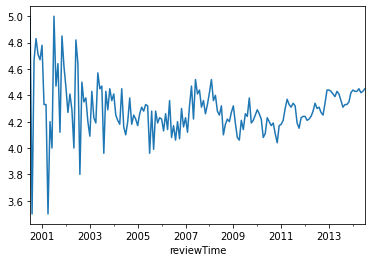

In [46]:
tm.overall.plot()

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller,acf,pacf
from statsmodels.tsa.statespace.tools import diff
from pmdarima.arima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from pandas.plotting import autocorrelation_plot
from pandas.tseries.offsets import DateOffset
import warnings
warnings.filterwarnings('ignore')

ModuleNotFoundError: ignored

In [62]:
# import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

'''from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX'''
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
# dickey fuller test for stationarity check
from statsmodels.tsa.stattools import adfuller,acf,pacf
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm


# libraries for evaluation
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

Text(0.5, 1.0, 'Random')

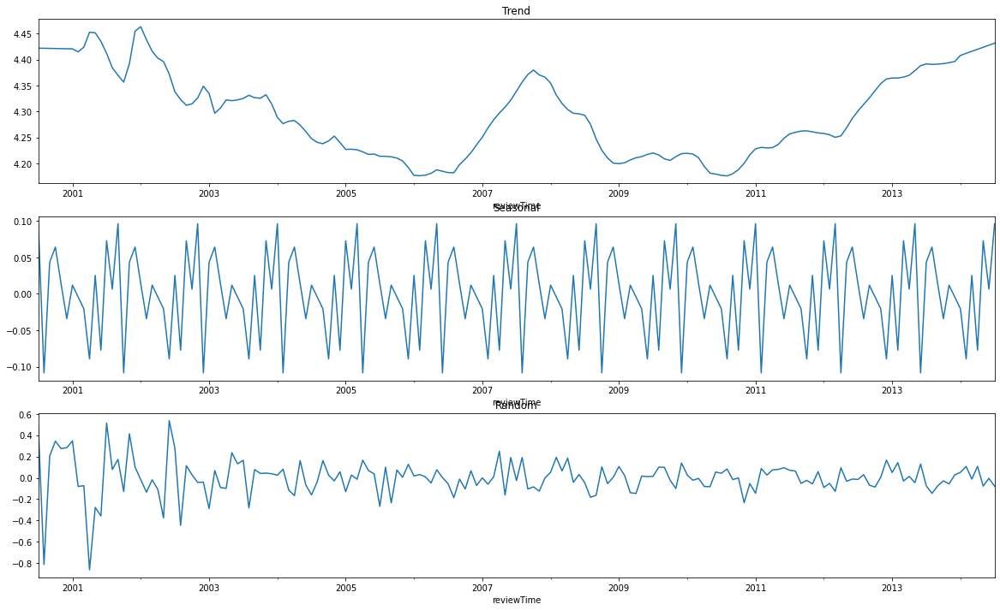

In [53]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(tm['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [54]:
tm1=tm['overall']
tm1

reviewTime
2000-07-31    5.00
2000-08-31    3.50
2000-09-30    4.67
2000-10-31    4.83
2000-11-30    4.71
              ... 
2014-03-31    4.43
2014-04-30    4.45
2014-05-31    4.42
2014-06-30    4.43
2014-07-31    4.45
Freq: M, Name: overall, Length: 169, dtype: float64

In [55]:
tm1 = pd.DataFrame(tm1)

In [56]:
tm1

,overall
reviewTime,
2000-07-31,5.00
2000-08-31,3.50
2000-09-30,4.67
2000-10-31,4.83
2000-11-30,4.71
...,...
2014-03-31,4.43
2014-04-30,4.45
2014-05-31,4.42


In [57]:
def checkStationarity(tm1):
  pvalue = adfuller(tm1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [58]:
ret = checkStationarity(tm1);
ret

'p-value=0.48595271145885083. Data is not stationary'

In [59]:
data_diff=tm1-tm1.shift()
data_diff

,overall
reviewTime,
2000-07-31,NaN
2000-08-31,-1.50
2000-09-30,1.17
2000-10-31,0.16
2000-11-30,-0.12
...,...
2014-03-31,0.00
2014-04-30,0.02
2014-05-31,-0.03


In [60]:
checkStationarity(data_diff[1:].dropna())

'p-value=0.0001179163600626905. Data is stationary'

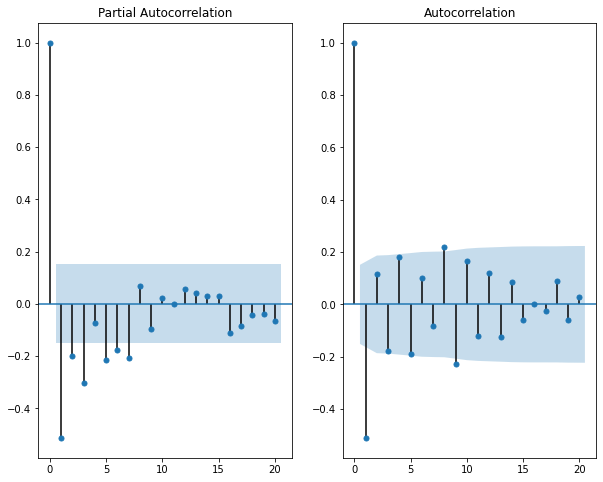

In [63]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(data_diff.dropna(),lags=20,ax=ax[0])
plot_acf(data_diff.dropna(),lags=20,ax=ax[1])
plt.show()

In [64]:
ss = int(0.80 * len(tm1['overall'])) 
train_df = tm1.iloc[:ss] 
test_df = tm1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 135, test = 34


In [65]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 135, test = 34


## ARMA

In [72]:
# import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
# dickey fuller test for stationarity check
from statsmodels.tsa.stattools import adfuller,acf,pacf
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm


# libraries for evaluation
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

In [71]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 5.0 MB/s 
     |████████████████████████████████| 9.9 MB 67.8 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2


In [73]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  135
Model:                 ARIMA(7, 0, 6)   Log Likelihood                  24.362
Date:                Tue, 13 Dec 2022   AIC                            -18.724
Time:                        10:03:17   BIC                             24.855
Sample:                    07-31-2000   HQIC                            -1.015
                         - 09-30-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.2991      0.088     48.871      0.000       4.127       4.472
ar.L1          0.0683      0.180      0.380      0.704      -0.284       0.420
ar.L2         -0.3986      0.156     -2.552      0.0

In [74]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

reviewTime
2000-07-31    4.299140
2000-08-31    4.164959
2000-09-30    4.663850
2000-10-31    3.881538
2000-11-30    4.686082
2000-12-31    4.068845
2001-01-31    4.680390
2001-02-28    4.380885
2001-03-31    4.483606
2001-04-30    4.122226
2001-05-31    4.645629
2001-06-30    4.127997
2001-07-31    4.445396
2001-08-31    4.207121
2001-09-30    4.692273
2001-10-31    4.119585
2001-11-30    4.599983
2001-12-31    4.179690
2002-01-31    4.550086
2002-02-28    4.240351
2002-03-31    4.735308
2002-04-30    4.155772
2002-05-31    4.383802
2002-06-30    4.243788
2002-07-31    4.634982
2002-08-31    4.322844
2002-09-30    4.431060
2002-10-31    4.247171
2002-11-30    4.453435
2002-12-31    4.153362
2003-01-31    4.649988
2003-02-28    4.344284
2003-03-31    4.232867
2003-04-30    4.175698
Freq: M, Name: predicted_mean, dtype: float64


In [75]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

    actual  predicted       err
0     5.00   4.299140  0.700860
1     3.50   4.164959 -0.664959
2     4.67   4.663850  0.006150
3     4.83   3.881538  0.948462
4     4.71   4.686082  0.023918
5     4.67   4.068845  0.601155
6     4.78   4.680390  0.099610
7     4.33   4.380885 -0.050885
8     4.33   4.483606 -0.153606
9     3.50   4.122226 -0.622226
10    4.20   4.645629 -0.445629
11    4.00   4.127997 -0.127997
12    5.00   4.445396  0.554604
13    4.47   4.207121  0.262879
14    4.64   4.692273 -0.052273
15    4.12   4.119585  0.000415
16    4.85   4.599983  0.250017
17    4.62   4.179690  0.440310
18    4.46   4.550086 -0.090086
19    4.27   4.240351  0.029649
20    4.41   4.735308 -0.325308
21    4.29   4.155772  0.134228
22    4.00   4.383802 -0.383802
23    4.82   4.243788  0.576212
24    4.64   4.634982  0.005018
25    3.80   4.322844 -0.522844
26    4.50   4.431060  0.068940
27    4.35   4.247171  0.102829
28    4.38   4.453435 -0.073435
29    4.20   4.153362  0.046638
30    4.

In [76]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [77]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.13819381925113755
	RMSE = 0.37174429282927474


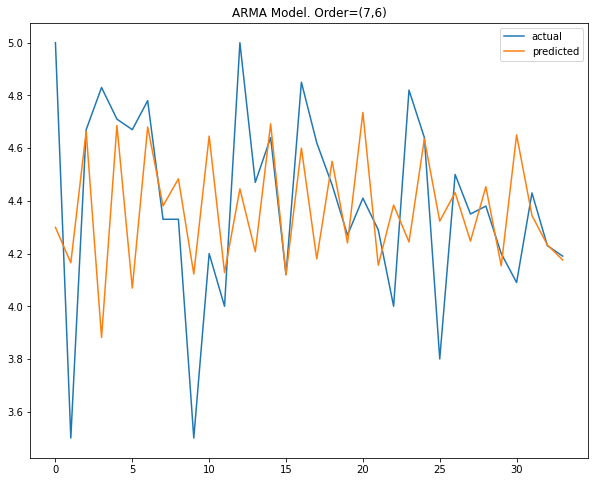

In [78]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [79]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m1)

2011-10-31    4.192795
2011-11-30    4.257740
2011-12-31    4.273074
2012-01-31    4.220034
2012-02-29    4.262931
2012-03-31    4.294652
2012-04-30    4.217947
2012-05-31    4.217006
2012-06-30    4.294763
2012-07-31    4.271291
2012-08-31    4.219917
2012-09-30    4.263412
2012-10-31    4.274912
2012-11-30    4.229231
2012-12-31    4.254722
2013-01-31    4.292361
2013-02-28    4.244464
2013-03-31    4.229795
2013-04-30    4.280389
2013-05-31    4.272706
2013-06-30    4.236060
2013-07-31    4.265390
2013-08-31    4.278434
2013-09-30    4.242444
2013-10-31    4.253019
2013-11-30    4.286580
2013-12-31    4.259188
2014-01-31    4.242331
2014-02-28    4.275069
2014-03-31    4.274672
2014-04-30    4.247218
Freq: M, Name: predicted_mean, dtype: float64


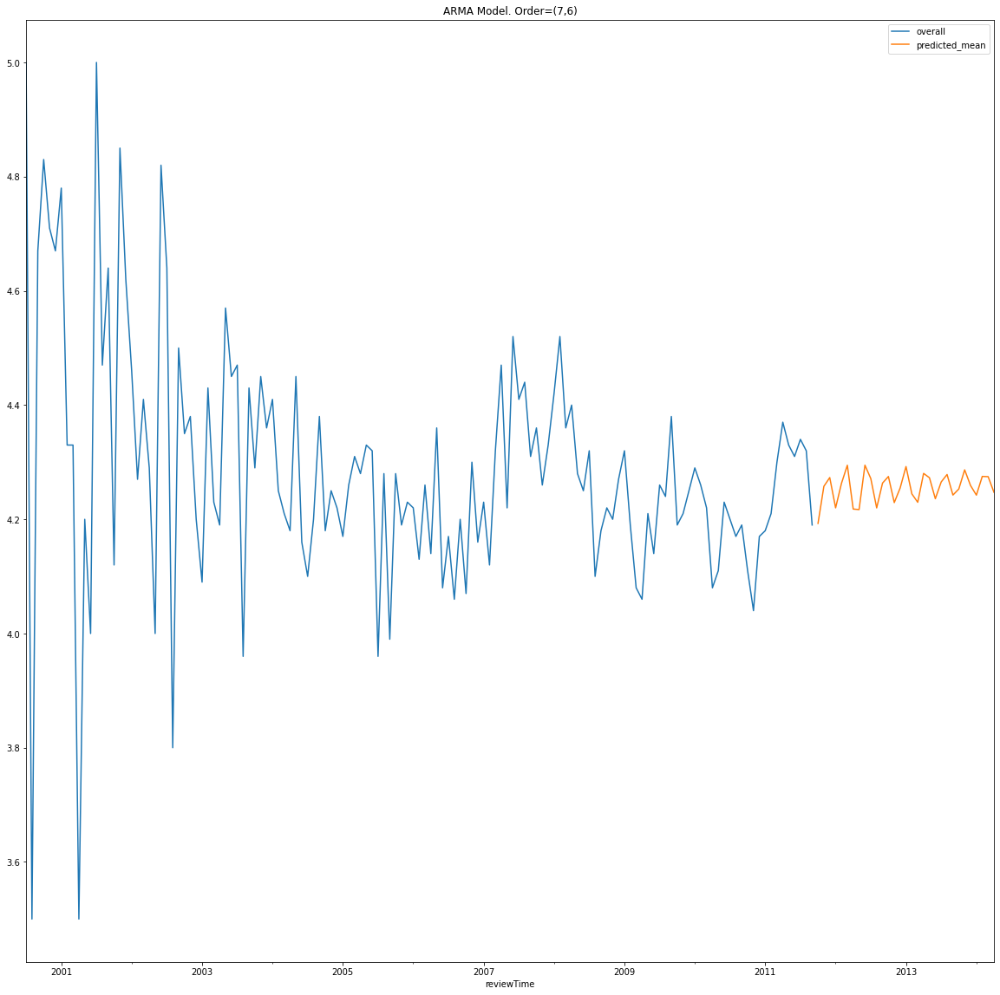

In [80]:
train.plot(figsize=(20,20),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## ARIMA

In [81]:
m2 = auto_arima(train,start_p=1,max_p=3, start_q=1,max_q=3, seasonal=False, trace=True)
print(m2.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-22.218, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=59.790, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9.299, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-24.141, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=57.845, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-22.198, Time=0.24 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-24.112, Time=0.10 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0] intercept
Total fit time: 1.482 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  135
Model:               SARIMAX(0, 1, 1)   Log Likelihood                  15.070
Date:                Tue, 13 Dec 2022   AIC                            -24.141
Time:                        10:03:56   BIC         

In [82]:
p=2
d=1
q=2
m2 = ARIMA(train,order=(p,d,q)).fit()
print(m2.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  135
Model:                 ARIMA(2, 1, 2)   Log Likelihood                  19.253
Date:                Tue, 13 Dec 2022   AIC                            -28.506
Time:                        10:03:59   BIC                            -14.017
Sample:                    07-31-2000   HQIC                           -22.618
                         - 09-30-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8892      0.085    -10.490      0.000      -1.055      -0.723
ar.L2          0.1008      0.081      1.239      0.215      -0.059       0.260
ma.L1         -0.0151      0.076     -0.200      0.8

In [83]:
predictions1=m2.predict(0,len(train)-1)
predictions1

reviewTime
2000-07-31    0.000000
2000-08-31    5.000000
2000-09-30    4.511554
2000-10-31    3.976542
2000-11-30    4.774838
                ...   
2011-05-31    4.229320
2011-06-30    4.230880
2011-07-31    4.236203
2011-08-31    4.241876
2011-09-30    4.250600
Freq: M, Name: predicted_mean, Length: 135, dtype: float64

In [84]:
actual = []; pred = []
for i in range(len(predictions1)):
  actual.append(train[i])
  pred.append(predictions1[i])
df_res1 = pd.DataFrame({'actual':actual, 'predicted':pred})
df_res1['err'] = df_res1.actual - df_res1.predicted
print(df_res1)

     actual  predicted       err
0      5.00   0.000000  5.000000
1      3.50   5.000000 -1.500000
2      4.67   4.511554  0.158446
3      4.83   3.976542  0.853458
4      4.71   4.774838 -0.064838
..      ...        ...       ...
130    4.33   4.229320  0.100680
131    4.31   4.230880  0.079120
132    4.34   4.236203  0.103797
133    4.32   4.241876  0.078124
134    4.19   4.250600 -0.060600

[135 rows x 3 columns]


In [85]:
pvalue = sm.stats.acorr_ljungbox(m2.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Reject H0. Bad model


In [86]:
msg1 = 'ARIMA Model. Order=(' + str(p) + ',' + str(d) + ',' + str(q) + ')'
mse1 = mean_squared_error(df_res1.actual, df_res1.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse1,np.sqrt(mse1)))

ARMA Model. Order=(7,6)
	MSE = 0.24096232255170089
	RMSE = 0.4908791323245478


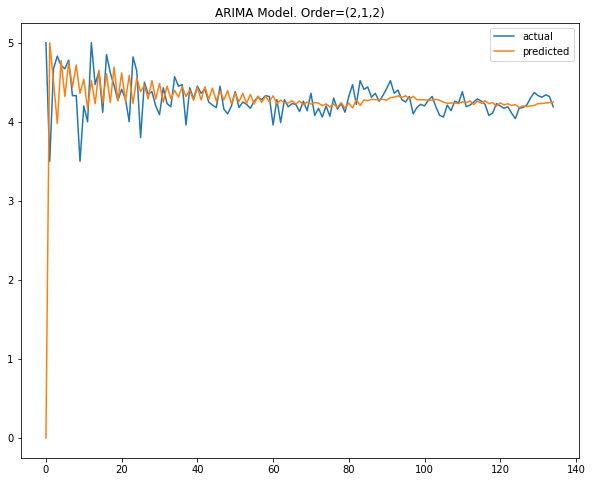

In [87]:
df_res1.actual.plot(figsize=(10,8),legend=True)
df_res1.predicted.plot(legend=True)
plt.title(msg1)
plt.show()

In [88]:
fcast_m2 = m2.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m2)

2011-10-31    4.237494
2011-11-30    4.234135
2011-12-31    4.241909
2012-01-31    4.234657
2012-02-29    4.241889
2012-03-31    4.234728
2012-04-30    4.241825
2012-05-31    4.234792
2012-06-30    4.241761
2012-07-31    4.234855
2012-08-31    4.241698
2012-09-30    4.234917
2012-10-31    4.241637
2012-11-30    4.234978
2012-12-31    4.241576
2013-01-31    4.235038
2013-02-28    4.241517
2013-03-31    4.235097
2013-04-30    4.241459
2013-05-31    4.235155
2013-06-30    4.241401
2013-07-31    4.235211
2013-08-31    4.241345
2013-09-30    4.235267
2013-10-31    4.241290
2013-11-30    4.235322
2013-12-31    4.241236
2014-01-31    4.235375
2014-02-28    4.241183
2014-03-31    4.235428
2014-04-30    4.241131
Freq: M, Name: predicted_mean, dtype: float64


Text(0.5, 1.0, 'ARIMA Model. Order=(2,1,2)')

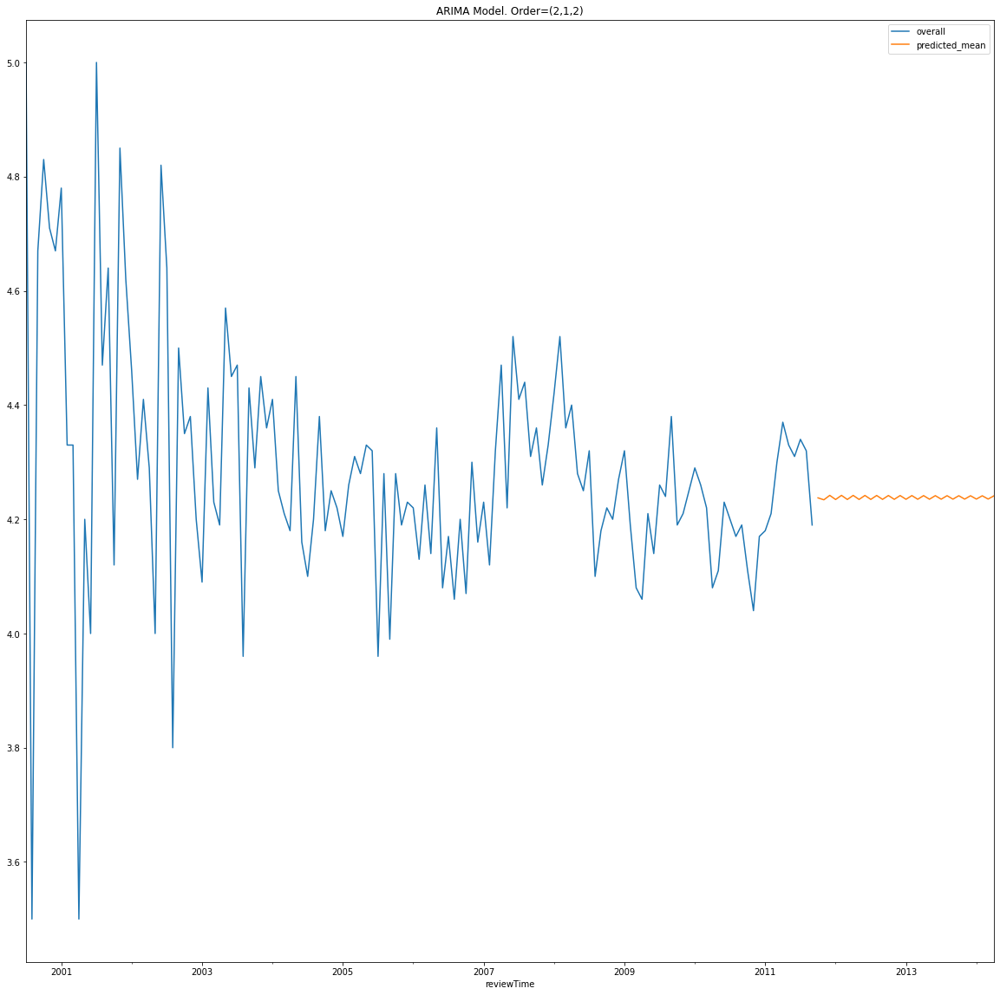

In [89]:
train.plot(figsize=(20,20),legend=True)
fcast_m2.plot(legend=True)
plt.title(msg1)

## SARIMA

In [90]:
m3 = SARIMAX(train, order=(2,1,2), seasonal_order=(1,1,1,30)).fit()
m3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                              overall   No. Observations:                  135
Model:             SARIMAX(2, 1, 2)x(1, 1, [1], 30)   Log Likelihood                  -5.952
Date:                              Tue, 13 Dec 2022   AIC                             25.905
Time:                                      10:04:38   BIC                             44.415
Sample:                                  07-31-2000   HQIC                            33.404
                                       - 09-30-2011                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8888      0.109     -8.188      0.000      -1.101      -0.676
ar.L2          0.1028      0.103      0.994      0.320      -0.100       0.306
ma.L1          0.0122      0.095      0.128      0.898      -0.174       0.199
ma.L2         -0.8703      0.075    -11.609      0.000      -1.017      -0.723
ar.S.L30      -0.1120      0.346     -0.323      0.746      -0.791       0.567
ma.S.L30      -0.3500      0.389     -0.900      0.368      -1.113       0.413
sigma2         0.0603      0.009      6.759      0.000       0.043       0.078
===================================================================================
Ljung-Box (L1) (Q):                   0.60   Jarque-Bera (JB):               128.24
Prob(Q):                              0.44   Prob(JB):                         0.00
Heteroskedasticity (H):               0.12   Skew:                             1.23
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [91]:
predictions2=m3.predict(0,len(test)-1)
predictions2

reviewTime
2000-07-31    0.000000
2000-08-31    5.000000
2000-09-30    3.500000
2000-10-31    4.670000
2000-11-30    4.830000
2000-12-31    4.710000
2001-01-31    4.670000
2001-02-28    4.780000
2001-03-31    4.330000
2001-04-30    4.330000
2001-05-31    3.500000
2001-06-30    4.200000
2001-07-31    4.000000
2001-08-31    5.000000
2001-09-30    4.470000
2001-10-31    4.640000
2001-11-30    4.120000
2001-12-31    4.850000
2002-01-31    4.620000
2002-02-28    4.460000
2002-03-31    4.270000
2002-04-30    4.410000
2002-05-31    4.290000
2002-06-30    4.000000
2002-07-31    4.820000
2002-08-31    4.640000
2002-09-30    3.800000
2002-10-31    4.500000
2002-11-30    4.350000
2002-12-31    4.380000
2003-01-31    6.700000
2003-02-28    2.590000
2003-03-31    4.618568
2003-04-30    4.860252
Freq: M, Name: predicted_mean, dtype: float64

In [92]:
# actual vs predicted values
# print("test = {}, predicted = {}".format(len(test), len(predictions) ))
actual = []; pred= [] 
for i in range(len(predictions2)):
    actual.append(train[i]) 
    pred.append(predictions2[i]) 
df_res3 = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res3['err'] = df_res3.actual- df_res3.predicted
print(df_res3) #MAE Mean(|E|)

    actual  predicted           err
0     5.00   0.000000  5.000000e+00
1     3.50   5.000000 -1.500000e+00
2     4.67   3.500000  1.170000e+00
3     4.83   4.670000  1.600002e-01
4     4.71   4.830000 -1.200001e-01
5     4.67   4.710000 -3.999990e-02
6     4.78   4.670000  1.099999e-01
7     4.33   4.780000 -4.499999e-01
8     4.33   4.330000 -1.311086e-07
9     3.50   4.330000 -8.299999e-01
10    4.20   3.500000  6.999998e-01
11    4.00   4.200000 -1.999998e-01
12    5.00   4.000000  9.999999e-01
13    4.47   5.000000 -5.299998e-01
14    4.64   4.470000  1.699998e-01
15    4.12   4.640000 -5.199998e-01
16    4.85   4.120000  7.299998e-01
17    4.62   4.850000 -2.299998e-01
18    4.46   4.620000 -1.600002e-01
19    4.27   4.460000 -1.899998e-01
20    4.41   4.270000  1.399998e-01
21    4.29   4.410000 -1.199998e-01
22    4.00   4.290000 -2.900002e-01
23    4.82   4.000000  8.200001e-01
24    4.64   4.820000 -1.800001e-01
25    3.80   4.640000 -8.399999e-01
26    4.50   3.800000  6.999

In [93]:
mse2=mean_squared_error(df_res3.actual,df_res3.predicted)
print("\n\tMSE = {}\n\tRMSE = {}".format(mse2,np.sqrt(mse2)))


	MSE = 1.3292329407141175
	RMSE = 1.1529236491260457


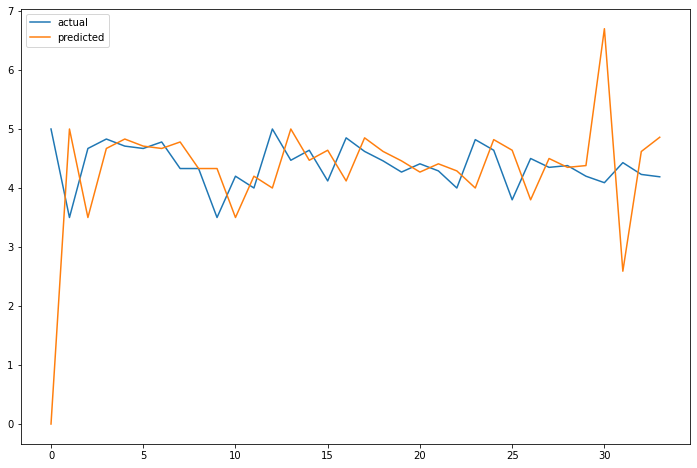

In [94]:
df_res3[['actual','predicted']].plot(figsize=(12,8))

In [95]:
fcast_m3 = m3.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m3)

2011-10-31    4.088076
2011-11-30    4.250709
2011-12-31    4.171709
2012-01-31    4.198636
2012-02-29    4.200677
2012-03-31    4.319599
2012-04-30    4.277894
2012-05-31    4.164156
2012-06-30    4.354702
2012-07-31    4.286881
2012-08-31    4.291138
2012-09-30    4.228166
2012-10-31    4.198062
2012-11-30    4.150766
2012-12-31    4.267681
2013-01-31    4.202905
2013-02-28    4.282779
2013-03-31    4.182940
2013-04-30    4.227005
2013-05-31    4.113571
2013-06-30    4.215964
2013-07-31    4.201743
2013-08-31    4.156763
2013-09-30    4.219731
2013-10-31    4.278550
2013-11-30    4.251412
2013-12-31    4.265685
2014-01-31    4.284929
2014-02-28    4.248161
2014-03-31    4.121808
2014-04-30    4.076450
Freq: M, Name: predicted_mean, dtype: float64


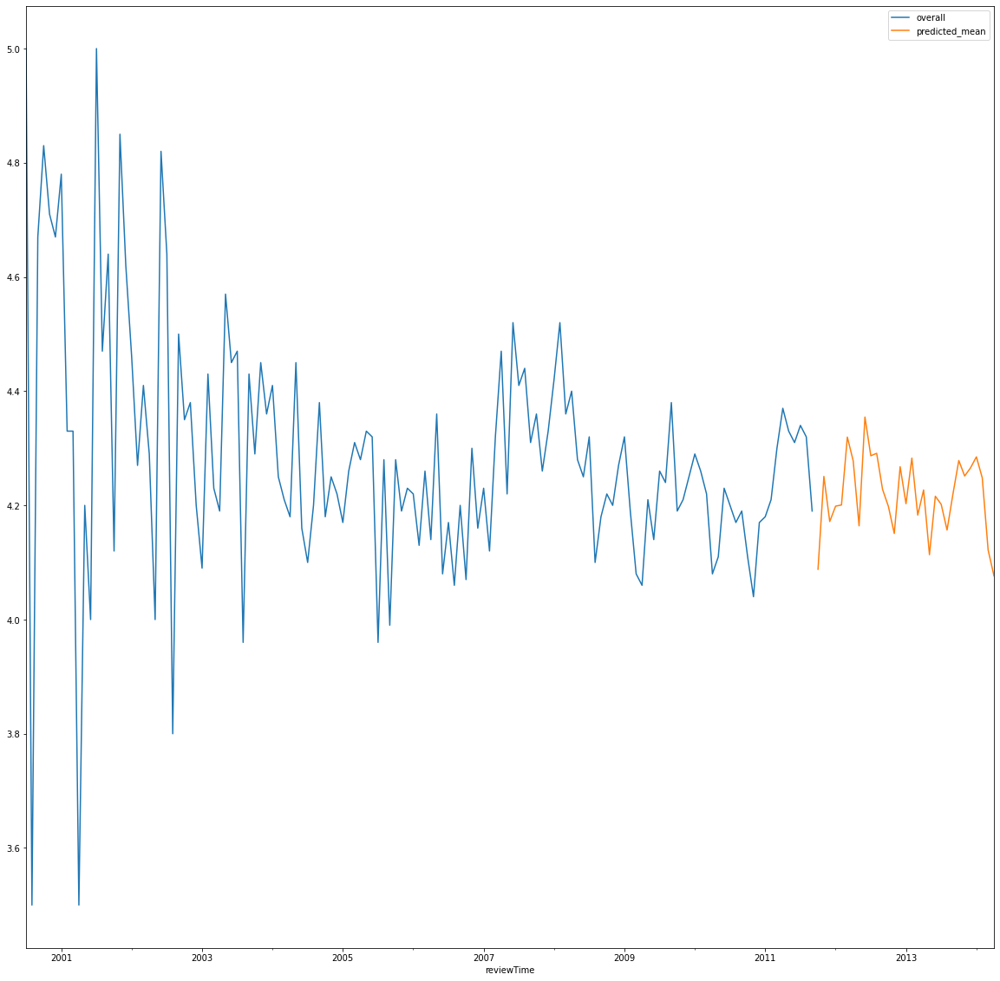

In [96]:
train.plot(figsize=(20,20),legend=True)
fcast_m3.plot(legend=True)

ARMA Model is the best as it has the lowest RMSE

## Finding for positive,neutral and negative polarity sentiments

## Neutral

In [98]:
top = tm[(tm['reviewAnalysis'] == 'Neutral')]
top

KeyError: ignored

In [ ]:
top = top.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
top

,overall,category,ReviewTime,polarity,polarity_sentiment
1,4,"[""Video Games"",""PC"",""Games""]",2013-06-30,0.033333,Neutral
4,4,"[""Video Games"",""PC"",""Games""]",2011-06-14,0.039669,Neutral
16,4,"[""Video Games"",""PC"",""Games""]",2012-03-19,0.054655,Neutral
23,3,"[""Video Games"",""PC"",""Games""]",2012-06-09,0.047277,Neutral
24,5,"[""Video Games"",""PC"",""Games""]",2011-06-13,0.050369,Neutral
...,...,...,...,...,...
228511,5,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.087986,Neutral
228515,1,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.048611,Neutral
228521,4,"[""Video Games"",""Xbox One"",""""]",2014-06-17,0.033333,Neutral
228531,5,"[""Video Games"",""Xbox One"",""""]",2014-07-19,0.041888,Neutral


In [ ]:
top['ReviewTime'] = pd.to_datetime(top['ReviewTime'])

In [ ]:
top = top.set_index("ReviewTime")
print(top)

            overall                       category  polarity  \
ReviewTime                                                     
2013-06-30        4   ["Video Games","PC","Games"]  0.033333   
2011-06-14        4   ["Video Games","PC","Games"]  0.039669   
2012-03-19        4   ["Video Games","PC","Games"]  0.054655   
2012-06-09        3   ["Video Games","PC","Games"]  0.047277   
2011-06-13        5   ["Video Games","PC","Games"]  0.050369   
...             ...                            ...       ...   
2014-06-09        5  ["Video Games","Xbox One",""]  0.087986   
2014-06-09        1  ["Video Games","Xbox One",""]  0.048611   
2014-06-17        4  ["Video Games","Xbox One",""]  0.033333   
2014-07-19        5  ["Video Games","Xbox One",""]  0.041888   
2014-06-09        2  ["Video Games","Xbox One",""]  0.016944   

           polarity_sentiment  
ReviewTime                     
2013-06-30            Neutral  
2011-06-14            Neutral  
2012-03-19            Neutral  
2012-06

In [ ]:
top=top.sort_values(by='ReviewTime')
top

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
1999-11-10,2,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.060000,Neutral
1999-11-10,2,"[""Video Games"",""Retro Gaming &amp; Microconsol...",0.060000,Neutral
1999-11-19,5,"[""Video Games"",""PC"",""Games"",""""]",0.053954,Neutral
1999-11-19,5,"[""Video Games"",""PC"",""Games"",""""]",0.053954,Neutral
1999-11-26,5,"[""Video Games"",""PC"",""Games"","""",""Space Game"",""T...",0.012500,Neutral
...,...,...,...,...
2014-07-22,4,"[""Video Games"",""PC""]",0.000000,Neutral
2014-07-22,5,"[""Video Games"",""PC"",""Accessories"",""Gaming Keyb...",0.000000,Neutral
2014-07-22,4,"[""Video Games"",""Kids & Family"",""PlayStation 4""...",0.000000,Neutral


In [ ]:
top = top.resample('W').mean().round(2)

In [ ]:
top = top.interpolate(method='linear')
top

,overall,polarity
ReviewTime,,
1999-11-14,2.00,0.06
1999-11-21,5.00,0.05
1999-11-28,5.00,0.01
1999-12-05,4.43,0.05
1999-12-12,4.43,0.06
...,...,...
2014-06-29,4.08,0.05
2014-07-06,4.20,0.04
2014-07-13,4.12,0.04


<AxesSubplot:xlabel='ReviewTime'>

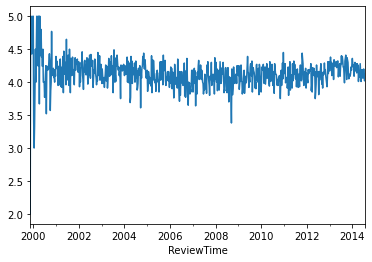

In [ ]:
top.overall.plot()

Text(0.5, 1.0, 'Random')

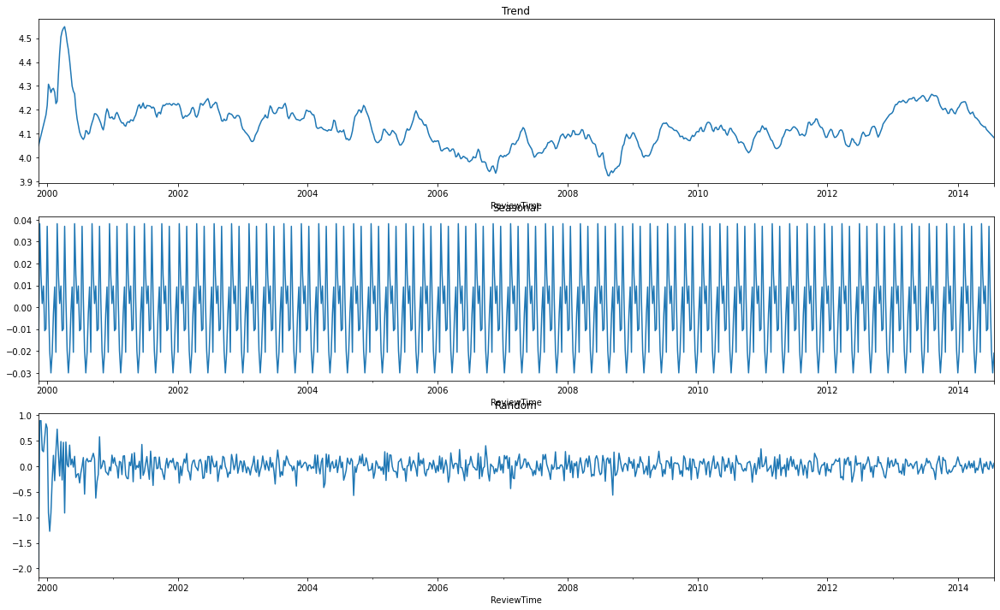

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(top['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [ ]:
top1=top['overall']
top1

ReviewTime
1999-11-14    2.00
1999-11-21    5.00
1999-11-28    5.00
1999-12-05    4.43
1999-12-12    4.43
              ... 
2014-06-29    4.08
2014-07-06    4.20
2014-07-13    4.12
2014-07-20    4.02
2014-07-27    4.12
Freq: W-SUN, Name: overall, Length: 768, dtype: float64

In [ ]:
top1 = pd.DataFrame(top1)

In [ ]:
def checkStationarity(top1):
  pvalue = adfuller(top1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [ ]:
ret = checkStationarity(top1);
ret

'p-value=2.142258640653892e-16. Data is stationary'

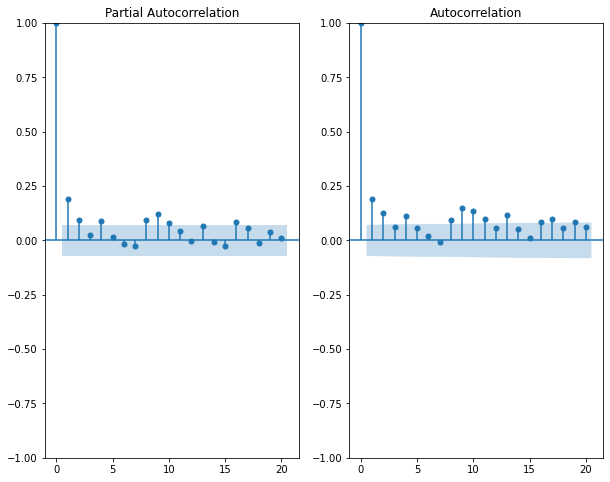

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(top1,lags=20,ax=ax[0])
plot_acf(top1.dropna(),lags=20,ax=ax[1])
plt.show()

In [ ]:
ss = int(0.80 * len(top1['overall'])) 
train_df = top1.iloc[:ss] 
test_df = top1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 614, test = 154


In [ ]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 614, test = 154


In [ ]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  614
Model:                 ARIMA(7, 0, 6)   Log Likelihood                  61.858
Date:                Sun, 13 Mar 2022   AIC                            -93.716
Time:                        17:49:29   BIC                            -27.416
Sample:                    11-14-1999   HQIC                           -67.934
                         - 08-14-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.1286      0.023    176.883      0.000       4.083       4.174
ar.L1         -0.4240      0.182     -2.329      0.020      -0.781      -0.067
ar.L2          1.1660      0.090     13.002      0.0

In [ ]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
1999-11-14    4.128584
1999-11-21    3.753541
1999-11-28    4.069989
1999-12-05    4.255904
1999-12-12    4.084001
                ...   
2002-09-22    4.164463
2002-09-29    4.173892
2002-10-06    4.182877
2002-10-13    4.207112
2002-10-20    4.192812
Freq: W-SUN, Name: predicted_mean, Length: 154, dtype: float64


In [ ]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      2.00   4.128584 -2.128584
1      5.00   3.753541  1.246459
2      5.00   4.069989  0.930011
3      4.43   4.255904  0.174096
4      4.43   4.084001  0.345999
..      ...        ...       ...
149    4.31   4.164463  0.145537
150    4.12   4.173892 -0.053892
151    4.07   4.182877 -0.112877
152    3.96   4.207112 -0.247112
153    4.08   4.192812 -0.112812

[154 rows x 3 columns]


In [ ]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.12323562495447052
	RMSE = 0.351049319831944


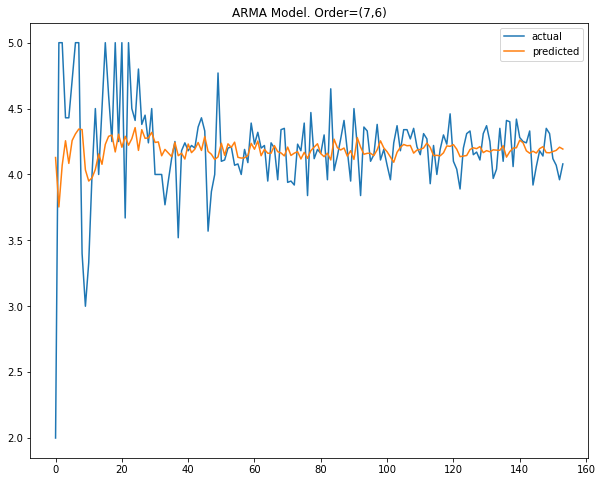

In [ ]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [ ]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+50, typ='levels')
print(fcast_m1)

2011-08-21    4.119084
2011-08-28    4.120306
2011-09-04    4.087051
2011-09-11    4.076123
2011-09-18    4.087551
2011-09-25    4.106799
2011-10-02    4.130634
2011-10-09    4.121540
2011-10-16    4.107127
2011-10-23    4.086707
2011-10-30    4.082596
2011-11-06    4.102104
2011-11-13    4.112737
2011-11-20    4.129606
2011-11-27    4.110459
2011-12-04    4.102761
2011-12-11    4.086294
2011-12-18    4.094465
2011-12-25    4.108919
2012-01-01    4.117520
2012-01-08    4.122806
2012-01-15    4.104870
2012-01-22    4.099692
2012-01-29    4.091504
2012-02-05    4.102800
2012-02-12    4.114201
2012-02-19    4.117105
2012-02-26    4.117482
2012-03-04    4.100702
2012-03-11    4.101033
2012-03-18    4.096608
2012-03-25    4.110046
2012-04-01    4.115481
2012-04-08    4.115921
2012-04-15    4.112359
2012-04-22    4.100056
2012-04-29    4.103416
2012-05-06    4.102164
2012-05-13    4.114270
2012-05-20    4.115300
2012-05-27    4.113808
2012-06-03    4.109281
2012-06-10    4.101111
2012-06-17 

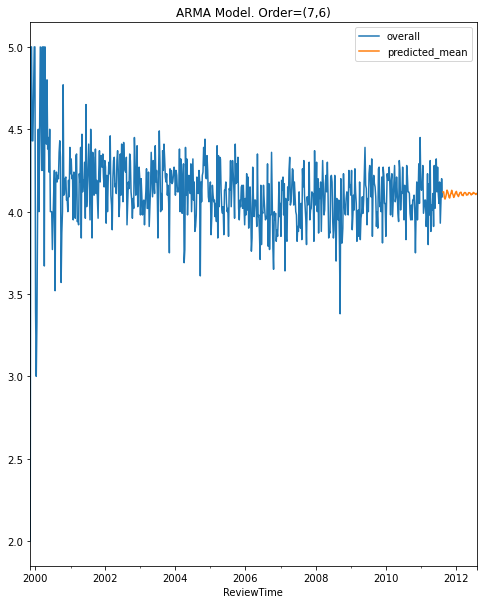

In [ ]:
train.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## Negative

In [ ]:
sec = rev[(rev['polarity_sentiment'] == 'Negative')]
sec

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,700099867,1,A2HD75EMZR8QLN,"[""Video Games"",""PC"",""Games""]",2012-07-09,installing game struggle game window live bugs...,40.0,Negative,-0.109790,Negative
2,700099867,1,A1INA0F5CWW3J4,"[""Video Games"",""PC"",""Games""]",2014-06-28,shipment received book instead shipment got fa...,0.0,Negative,-0.171429,Negative
3,700099867,3,A1DLMTOTHQ4AST,"[""Video Games"",""PC"",""Games""]",2011-09-14,got version instead version turned mistake con...,41.0,Neutral,-0.011501,Negative
5,700099867,4,A2UTRVO4FDCBH6,"[""Video Games"",""PC"",""Games""]",2013-05-11,overall well done racing game good graphic tim...,0.0,Positive,-0.076285,Negative
7,700099867,1,AQTC623NCESZW,"[""Video Games"",""PC"",""Games""]",2012-11-24,cant tell piece dog game like everything else ...,20.0,Negative,-0.224126,Negative
...,...,...,...,...,...,...,...,...,...,...
228507,B00KAI3KW2,3,A2BVX2MCXPP49R,"[""Video Games"",""Xbox One"",""""]",2014-06-24,hey finally able go buy xbox one xbox one got ...,34.0,Neutral,-0.038762,Negative
228510,B00KAI3KW2,1,A1ZR8AIM298DFT,"[""Video Games"",""Xbox One"",""""]",2014-07-09,still isnt worth weak console overall buy inst...,15.0,Negative,-0.025000,Negative
228519,B00KAI3KW2,1,AQOFQWJYJRA5W,"[""Video Games"",""Xbox One"",""""]",2014-06-15,bought xbox one hour ago along copy ryse game ...,25.0,Negative,-0.235294,Negative
228530,B00KAI3KW2,1,A1MHB1HRR6VPEH,"[""Video Games"",""Xbox One"",""""]",2014-06-14,microsoft decided remove camera thingy realize...,16.0,Negative,-0.450000,Negative


In [ ]:
sec['ReviewTime'] = pd.to_datetime(sec['ReviewTime'])

In [ ]:
sec = sec.set_index("ReviewTime")
print(sec)

            product_id  overall      reviewerID  \
ReviewTime                                        
2012-07-09   700099867        1  A2HD75EMZR8QLN   
2014-06-28   700099867        1  A1INA0F5CWW3J4   
2011-09-14   700099867        3  A1DLMTOTHQ4AST   
2013-05-11   700099867        4  A2UTRVO4FDCBH6   
2012-11-24   700099867        1   AQTC623NCESZW   
...                ...      ...             ...   
2014-06-24  B00KAI3KW2        3  A2BVX2MCXPP49R   
2014-07-09  B00KAI3KW2        1  A1ZR8AIM298DFT   
2014-06-15  B00KAI3KW2        1   AQOFQWJYJRA5W   
2014-06-14  B00KAI3KW2        1  A1MHB1HRR6VPEH   
2014-06-13  B00KAI3KW2        4  A3PG9EEZMT9CJF   

                                 category  \
ReviewTime                                  
2012-07-09   ["Video Games","PC","Games"]   
2014-06-28   ["Video Games","PC","Games"]   
2011-09-14   ["Video Games","PC","Games"]   
2013-05-11   ["Video Games","PC","Games"]   
2012-11-24   ["Video Games","PC","Games"]   
...                  

In [ ]:
sec=sec.sort_values(by='ReviewTime')
sec

,product_id,overall,reviewerID,category,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
ReviewTime,,,,,,,,,
1999-11-25,B00000DMAD,5,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"","""",""3-D Adventure""]",liked full trottle love lucasarts game general...,42.0,Positive,-3.529412e-02,Negative
1999-11-25,B00001W0J2,5,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"",""""]",funkyist phates game late much fun ive recomme...,33.0,Positive,-9.251859e-18,Negative
1999-11-25,B00001W0J2,5,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"",""""]",funkyist phates game late much fun ive recomme...,33.0,Positive,-9.251859e-18,Negative
1999-11-25,B00004SWKG,4,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"",""""]",without doubt violent bloody driving game ever...,0.0,Positive,-2.649351e-01,Negative
1999-11-25,B00004SWKG,4,A3NK7ASILKG3TX,"[""Video Games"",""PC"",""Games"",""""]",without doubt violent bloody driving game ever...,0.0,Positive,-2.649351e-01,Negative
...,...,...,...,...,...,...,...,...,...
2014-07-22,B00BMFIXKQ,1,A3D8VKH8GUOBYV,"[""Video Games"",""PlayStation 3"",""""]",game okay progress anything storyline need pur...,0.0,Negative,-5.000000e-03,Negative
2014-07-22,B00CX6XKK6,1,AO5CE7DBUWCDK,"[""Video Games"",""Xbox One"",""Games"",""""]",still terrible game wasted multiplayer unplaya...,0.0,Negative,-2.666667e-01,Negative
2014-07-22,B00I5LMSE2,1,ALI31O6E1W9EA,"[""Video Games"",""Kids & Family"",""Nintendo 3DS"",...",got game becose beat battlefield bored eat stu...,0.0,Negative,-2.000000e-01,Negative


In [ ]:
sec = sec.resample('W').mean().round(2)

In [ ]:
sec = sec.interpolate(method='linear')
sec

,overall,helpful_rate,polarity
ReviewTime,,,
1999-11-28,3.550,31.82,-0.07
1999-12-05,3.275,39.91,-0.07
1999-12-12,3.000,48.00,-0.07
1999-12-19,5.000,0.00,-0.01
1999-12-26,2.000,43.00,-0.18
...,...,...,...
2014-06-29,3.400,7.56,-0.11
2014-07-06,3.530,5.55,-0.17
2014-07-13,3.350,4.03,-0.18


<AxesSubplot:xlabel='ReviewTime'>

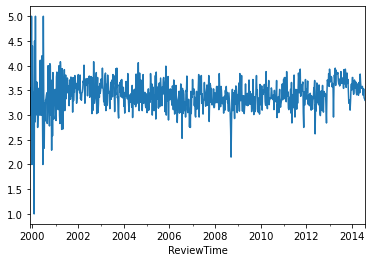

In [ ]:
sec.overall.plot()

Text(0.5, 1.0, 'Random')

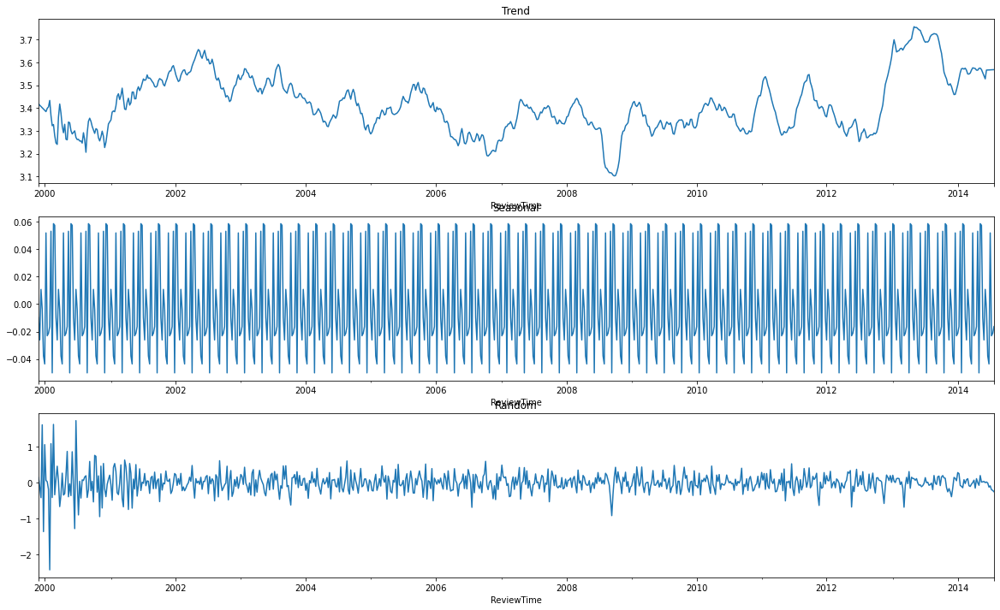

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(sec['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [ ]:
sec1=sec['overall']
sec1

ReviewTime
1999-11-28    3.550
1999-12-05    3.275
1999-12-12    3.000
1999-12-19    5.000
1999-12-26    2.000
              ...  
2014-06-29    3.400
2014-07-06    3.530
2014-07-13    3.350
2014-07-20    3.330
2014-07-27    3.300
Freq: W-SUN, Name: overall, Length: 766, dtype: float64

In [ ]:
sec1 = pd.DataFrame(sec1)

In [ ]:
def checkStationarity(sec1):
  pvalue = adfuller(sec1)[1]
  if(pvalue>0.05):
    msg1 = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg1='p-value={}. Data is stationary'.format(pvalue)
  return(msg1)

In [ ]:
ret = checkStationarity(sec1);
ret

'p-value=0.014131563521006058. Data is stationary'

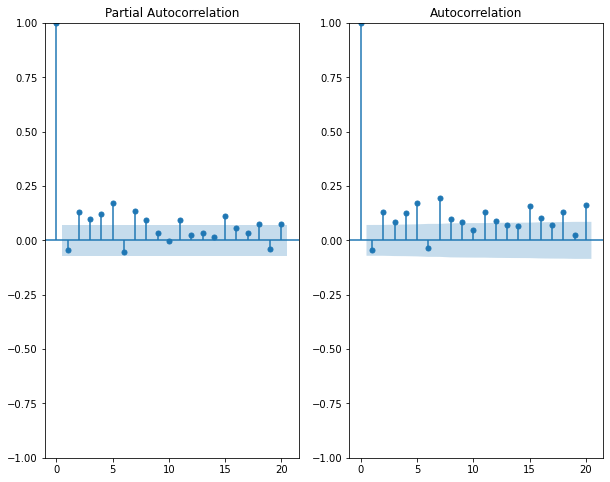

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(sec1,lags=20,ax=ax[0])
plot_acf(sec1,lags=20,ax=ax[1])
plt.show()

In [ ]:
ss = int(0.80 * len(sec1['overall'])) 
train_df = sec1.iloc[:ss] 
test_df = sec1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 612, test = 154


In [ ]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 612, test = 154


In [ ]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  612
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -172.106
Date:                Sun, 13 Mar 2022   AIC                            374.212
Time:                        20:28:53   BIC                            440.463
Sample:                    11-28-1999   HQIC                           399.979
                         - 08-14-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.3884      0.017    202.032      0.000       3.356       3.421
ar.L1          0.1954      0.803      0.243      0.808      -1.379       1.770
ar.L2          0.0957      0.722      0.133      0.8

In [ ]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
1999-11-28    3.388395
1999-12-05    3.357053
1999-12-12    3.423582
1999-12-19    3.452099
1999-12-26    3.064162
                ...   
2002-10-06    3.374630
2002-10-13    3.467710
2002-10-20    3.437394
2002-10-27    3.263379
2002-11-03    3.488340
Freq: W-SUN, Name: predicted_mean, Length: 154, dtype: float64


In [ ]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0     3.550   3.388395  0.161605
1     3.275   3.357053 -0.082053
2     3.000   3.423582 -0.423582
3     5.000   3.452099  1.547901
4     2.000   3.064162 -1.064162
..      ...        ...       ...
149   3.390   3.374630  0.015370
150   3.490   3.467710  0.022290
151   3.860   3.437394  0.422606
152   3.030   3.263379 -0.233379
153   3.550   3.488340  0.061660

[154 rows x 3 columns]


In [ ]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.22817185621735878
	RMSE = 0.4776733781752535


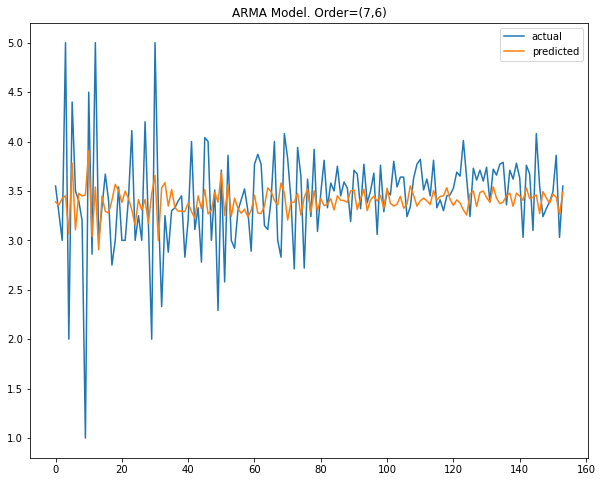

In [ ]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [ ]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+40, typ='levels')
print(fcast_m1)

2011-08-21    3.405433
2011-08-28    3.345498
2011-09-04    3.397763
2011-09-11    3.381799
2011-09-18    3.369571
2011-09-25    3.379215
2011-10-02    3.401176
2011-10-09    3.382317
2011-10-16    3.375696
2011-10-23    3.394633
2011-10-30    3.401389
2011-11-06    3.377295
2011-11-13    3.382937
2011-11-20    3.401105
2011-11-27    3.392905
2011-12-04    3.373673
2011-12-11    3.391012
2011-12-18    3.400853
2011-12-25    3.383229
2012-01-01    3.376186
2012-01-08    3.398664
2012-01-15    3.395617
2012-01-22    3.376900
2012-01-29    3.383679
2012-02-05    3.402372
2012-02-12    3.387364
2012-02-19    3.375899
2012-02-26    3.392536
2012-03-04    3.400386
2012-03-11    3.379488
2012-03-18    3.380311
2012-03-25    3.399068
2012-04-01    3.393706
2012-04-08    3.375334
2012-04-15    3.388128
2012-04-22    3.400743
2012-04-29    3.385264
2012-05-06    3.376555
2012-05-13    3.395969
2012-05-20    3.397075
2012-05-27    3.378586
Freq: W-SUN, Name: predicted_mean, dtype: float64


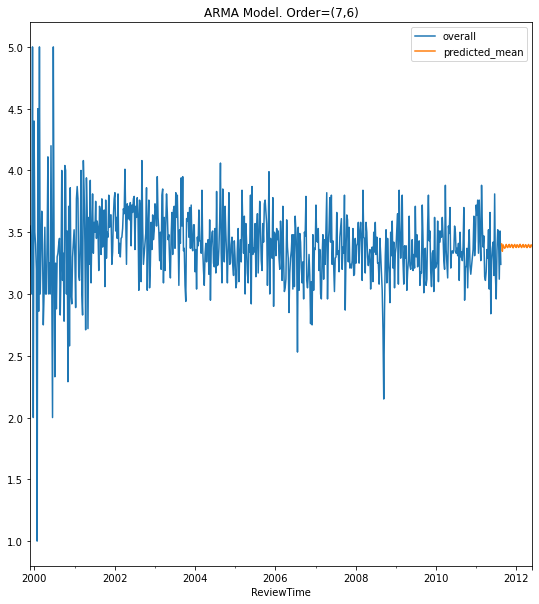

In [ ]:
train.plot(figsize=(9,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## Positive

In [99]:
d1.sample(2)

,Unnamed: 0,reviewerID,asin,reviewText,overall,reviewTime,Reviews_orignal,reviewText + summary,reviewPolarity,reviewAnalysis
15676,15676,A138L5S2OGB697,B00009XO8U,son daycare loved actually expensive model don...,5,2013-08-25,My son was using this at daycare and loved it....,My son was using this at daycare and loved it....,0.219097,Positive
154769,154769,A1ITRGMT80D5TK,B00CI6JDO8,love idea product 12-year-old daughter enjoyin...,4,2013-11-04,I love the idea of this product. My 12-year-o...,I love the idea of this product. My 12-year-o...,0.242763,Positive


In [102]:
third = d1[(d1['reviewAnalysis'] == 'Positive')]
third

,Unnamed: 0,reviewerID,asin,reviewText,overall,reviewTime,Reviews_orignal,reviewText + summary,reviewPolarity,reviewAnalysis
1,1,A8R62G708TSCM,0439893577,love magnet easel great moving different areas...,4,2014-03-28,Love the magnet easel... great for moving to d...,Love the magnet easel... great for moving to d...,0.433333,Positive
2,2,A21KH420DK0ICA,0439893577,sides magnetic real plus youre entertaining ch...,5,2013-01-28,Both sides are magnetic. A real plus when you...,Both sides are magnetic. A real plus when you...,0.300000,Positive
4,4,ACCH8EOML6FN5,0439893577,stainless steel refrigerator space son play ma...,4,2014-05-05,I have a stainless steel refrigerator therefor...,I have a stainless steel refrigerator therefor...,0.500000,Positive
6,6,A181ZNB42LISRZ,0439893577,expected sturdy stands im sure long grandsons ...,3,2012-12-26,This is just as I expected. It's not too sturd...,This is just as I expected. It's not too sturd...,0.212500,Positive
7,7,A1RBEJ5UQ1RWAW,0439893577,granddaughter likes love fold away definately ...,5,2014-04-15,My granddaughter really really likes this. I l...,My granddaughter really really likes this. I l...,0.500000,Positive
...,...,...,...,...,...,...,...,...,...,...
167592,167592,A18Q24BZK2CB5P,B00LBI9BKA,drone fun super duarable easy use kids love de...,5,2014-07-07,This drone is very fun and super duarable. Its...,This drone is very fun and super duarable. Its...,0.391667,Positive
167593,167593,A1I8ON1X0B2N2W,B00LBI9BKA,brothers prized toy extremely durable performs...,5,2014-07-07,This is my brother's most prized toy. It's ext...,This is my brother's most prized toy. It's ext...,0.118500,Positive
167594,167594,A3V24H5350ULKI,B00LBI9BKA,panther drone toy awesome definitely recommend...,5,2014-07-08,This Panther Drone toy is awesome. I definitel...,This Panther Drone toy is awesome. I definitel...,0.379556,Positive
167595,167595,A1W2F1WI0QZ4AJ,B00LBI9BKA,drone proven excellent choice drone obviously ...,5,2014-07-18,This is my first drone and it has proven to be...,This is my first drone and it has proven to be...,0.293056,Positive


In [103]:
third['reviewTime'] = pd.to_datetime(third['reviewTime'])

In [105]:
third=third.sort_values(by='reviewTime')
third

,Unnamed: 0,reviewerID,asin,reviewText,overall,reviewTime,Reviews_orignal,reviewText + summary,reviewPolarity,reviewAnalysis
7016,7016,A2B8GXSCB1R05T,B00004SDAP,favorite games young tricky games fun playing ...,5,2000-07-28,This was one of my favorite games when I was y...,This was one of my favorite games when I was y...,0.221970,Positive
3886,3886,A32JIQG3B1XX5I,B00000IW2S,bought son knowing playskool pretty good brand...,2,2000-08-15,I bought this for my son for [$] knowing that ...,I bought this for my son for [$] knowing that ...,0.106061,Positive
5027,5027,A1M2T0J45TTE64,B00000IZXG,saw game friends house party got people playin...,5,2000-08-31,I first saw this game at a friend's house at a...,I first saw this game at a friend's house at a...,0.058929,Positive
4819,4819,ADX9NTN40T1HN,B00000IZOU,purchased toy son learning walk 9 months age h...,5,2000-09-04,We purchased this toy for our son when he was ...,We purchased this toy for our son when he was ...,0.326667,Positive
4898,4898,A32JIQG3B1XX5I,B00000IZQE,son loves product little tied crib sit kicking...,5,2000-10-01,My son loves this product. When he was little ...,My son loves this product. When he was little ...,0.156250,Positive
...,...,...,...,...,...,...,...,...,...,...
141385,141385,A381XYPXYSTQUO,B00A8HOYQQ,fun,5,2014-07-23,What fun,What fun Five Stars,0.300000,Positive
160834,160834,A381XYPXYSTQUO,B00DPK11ZA,easy break,3,2014-07-23,Its easy to break,Its easy to break Three Stars,0.433333,Positive
167333,167333,A3TJSWA0W9ITYE,B00IVFCGIA,product comes doll bed chair table small acces...,4,2014-07-23,"This product comes with a doll, bed, chair and...","This product comes with a doll, bed, chair and...",0.033333,Positive
110070,110070,A381XYPXYSTQUO,B005VPREJE,fun toy,5,2014-07-23,Fun toy,Fun toy Five Stars,0.300000,Positive


In [106]:
third = third.set_index("reviewTime")
print(third)

            Unnamed: 0      reviewerID        asin  \
reviewTime                                           
2000-07-28        7016  A2B8GXSCB1R05T  B00004SDAP   
2000-08-15        3886  A32JIQG3B1XX5I  B00000IW2S   
2000-08-31        5027  A1M2T0J45TTE64  B00000IZXG   
2000-09-04        4819   ADX9NTN40T1HN  B00000IZOU   
2000-10-01        4898  A32JIQG3B1XX5I  B00000IZQE   
...                ...             ...         ...   
2014-07-23      141385  A381XYPXYSTQUO  B00A8HOYQQ   
2014-07-23      160834  A381XYPXYSTQUO  B00DPK11ZA   
2014-07-23      167333  A3TJSWA0W9ITYE  B00IVFCGIA   
2014-07-23      110070  A381XYPXYSTQUO  B005VPREJE   
2014-07-23      167355  A2FWZ58M6IQMD7  B00IVFCGKS   

                                                   reviewText  overall  \
reviewTime                                                               
2000-07-28  favorite games young tricky games fun playing ...        5   
2000-08-15  bought son knowing playskool pretty good brand...        2   
2

In [107]:
third = third.resample('W').mean().round(2)

In [108]:
third1 =third.interpolate(method='linear')
third1

,Unnamed: 0,overall,reviewPolarity
reviewTime,,,
2000-07-30,7016.000000,5.00,0.220000
2000-08-06,5972.666667,4.00,0.183333
2000-08-13,4929.333333,3.00,0.146667
2000-08-20,3886.000000,2.00,0.110000
2000-08-27,4456.500000,3.50,0.085000
...,...,...,...
2014-06-29,107742.430000,4.53,0.250000
2014-07-06,111666.200000,4.51,0.260000
2014-07-13,104941.050000,4.48,0.270000


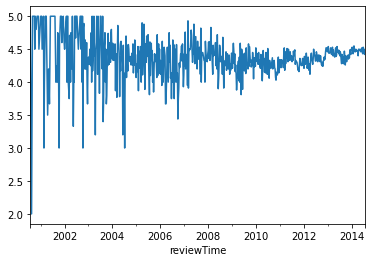

In [109]:
third1.overall.plot()

Text(0.5, 1.0, 'Random')

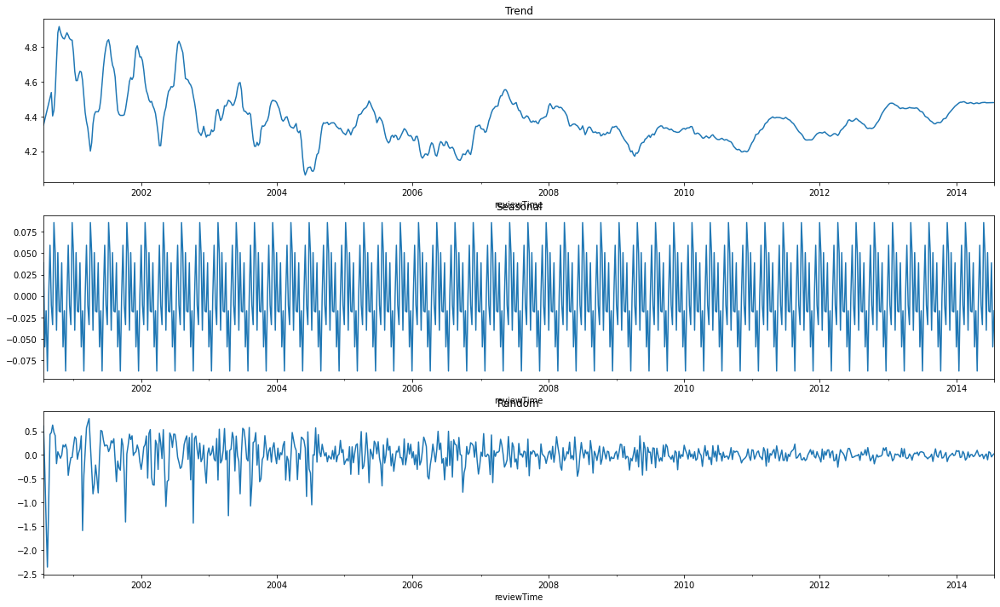

In [110]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(third1['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [111]:
third2=third1['overall']
third2

reviewTime
2000-07-30    5.00
2000-08-06    4.00
2000-08-13    3.00
2000-08-20    2.00
2000-08-27    3.50
              ... 
2014-06-29    4.53
2014-07-06    4.51
2014-07-13    4.48
2014-07-20    4.42
2014-07-27    4.49
Freq: W-SUN, Name: overall, Length: 731, dtype: float64

In [112]:
third2 = pd.DataFrame(third2)

In [113]:
def checkStationarity(third2):
  pvalue = adfuller(third2)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [114]:
ret = checkStationarity(third2);
ret

'p-value=1.0630657739459971e-20. Data is stationary'

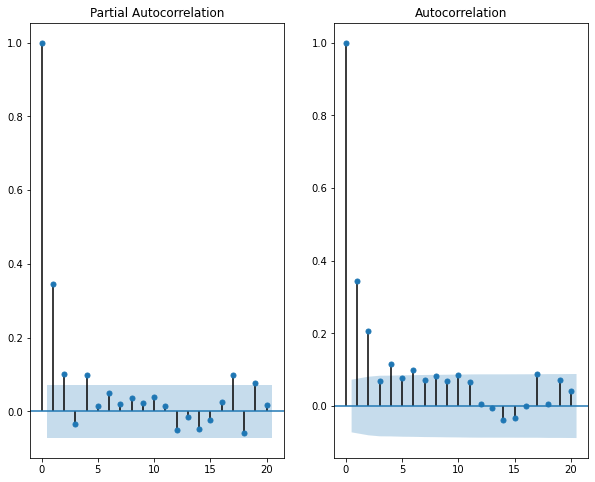

In [115]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(third2,lags=20,ax=ax[0])
plot_acf(third2,lags=20,ax=ax[1])
plt.show()

In [116]:
ss = int(0.80 * len(third1['overall'])) 
train_df = third2.iloc[:ss] 
test_df = third2.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 584, test = 147


In [117]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 584, test = 147


In [118]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  584
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -183.886
Date:                Tue, 13 Dec 2022   AIC                            397.773
Time:                        10:13:31   BIC                            463.321
Sample:                    07-30-2000   HQIC                           423.320
                         - 10-02-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.4150      0.082     53.581      0.000       4.253       4.576
ar.L1         -0.3159     15.931     -0.020      0.984     -31.540      30.909
ar.L2         -0.0589      4.714     -0.012      0.9

In [119]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

reviewTime
2000-07-30    4.414980
2000-08-06    4.639388
2000-08-13    4.363992
2000-08-20    3.865363
2000-08-27    3.488429
                ...   
2003-04-20    4.427788
2003-04-27    4.111093
2003-05-04    4.322595
2003-05-11    4.645506
2003-05-18    4.560439
Freq: W-SUN, Name: predicted_mean, Length: 147, dtype: float64


In [120]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0       5.0   4.414980  0.585020
1       4.0   4.639388 -0.639388
2       3.0   4.363992 -1.363992
3       2.0   3.865363 -1.865363
4       3.5   3.488429  0.011571
..      ...        ...       ...
142     3.2   4.427788 -1.227788
143     4.5   4.111093  0.388907
144     4.6   4.322595  0.277405
145     5.0   4.645506  0.354494
146     4.8   4.560439  0.239561

[147 rows x 3 columns]


In [121]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [122]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.2449432094783166
	RMSE = 0.4949173764158181


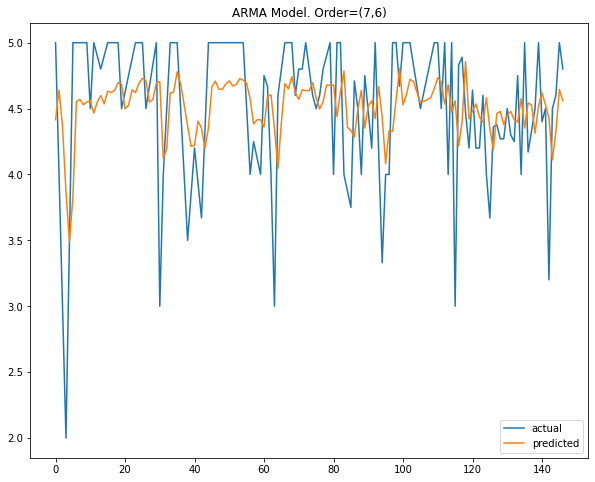

In [123]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [124]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+38, typ='levels')
print(fcast_m1)

2011-10-09    4.309079
2011-10-16    4.320194
2011-10-23    4.333813
2011-10-30    4.337046
2011-11-06    4.341225
2011-11-13    4.334100
2011-11-20    4.337162
2011-11-27    4.341603
2011-12-04    4.338777
2011-12-11    4.335783
2011-12-18    4.340590
2011-12-25    4.341822
2012-01-01    4.337740
2012-01-08    4.338689
2012-01-15    4.342767
2012-01-22    4.340877
2012-01-29    4.338517
2012-02-05    4.341753
2012-02-12    4.343291
2012-02-19    4.340321
2012-02-26    4.340673
2012-03-04    4.343860
2012-03-11    4.342906
2012-03-18    4.340946
2012-03-25    4.343180
2012-04-01    4.344706
2012-04-08    4.342657
2012-04-15    4.342640
2012-04-22    4.345115
2012-04-29    4.344757
2012-05-06    4.343208
2012-05-13    4.344719
2012-05-20    4.346134
2012-05-27    4.344777
2012-06-03    4.344579
2012-06-10    4.346475
2012-06-17    4.346493
2012-06-24    4.345315
2012-07-01    4.346322
Freq: W-SUN, Name: predicted_mean, dtype: float64


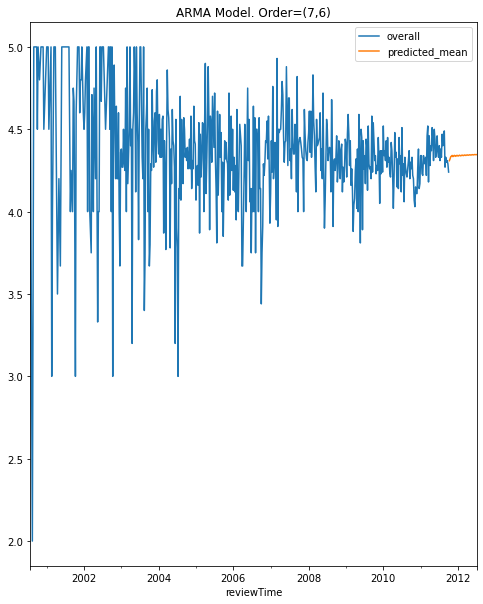

In [125]:
train.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## For a particular product

In [126]:
pos  = d1[(d1['reviewAnalysis'] == 'Positive')]

In [ ]:
pos = pos.drop(['sentiment','helpful_rate','reviews','reviewerID'],axis=1)
pos

,product_id,overall,category,ReviewTime,polarity,polarity_sentiment
6,700099867,5,"[""Video Games"",""PC"",""Games""]",2011-08-14,0.265385,Positive
10,700099867,5,"[""Video Games"",""PC"",""Games""]",2011-06-28,0.184149,Positive
11,700099867,5,"[""Video Games"",""PC"",""Games""]",2011-10-19,0.235880,Positive
13,700099867,1,"[""Video Games"",""PC"",""Games""]",2014-06-30,0.157143,Positive
15,700099867,1,"[""Video Games"",""PC"",""Games""]",2013-07-15,0.150000,Positive
...,...,...,...,...,...,...
228525,B00KAI3KW2,5,"[""Video Games"",""Xbox One"",""""]",2014-06-10,0.110833,Positive
228526,B00KAI3KW2,5,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.138462,Positive
228527,B00KAI3KW2,1,"[""Video Games"",""Xbox One"",""""]",2014-06-22,0.193457,Positive
228528,B00KAI3KW2,5,"[""Video Games"",""Xbox One"",""""]",2014-06-09,0.344773,Positive


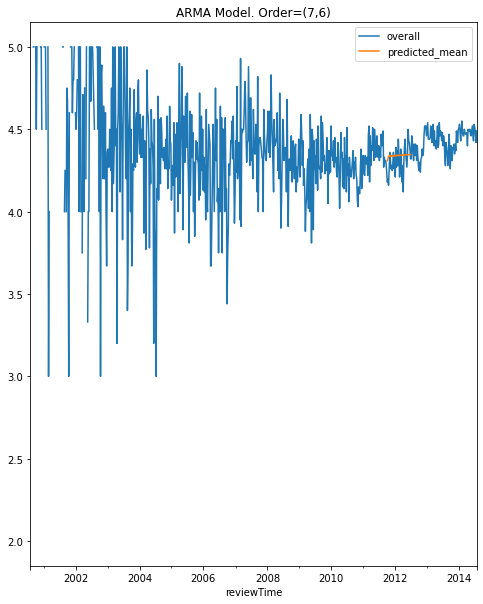

In [130]:
third.overall.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

In [ ]:
counts = pos["category"].value_counts().to_frame()
counts

,category
"[""Video Games"",""PC"",""Games"",""""]",9467
"[""Video Games"",""Xbox 360"",""Games"",""""]",6269
"[""Video Games"",""PlayStation 3"",""Games"",""""]",5573
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",4171
"[""Video Games"",""Kids & Family"",""Wii"",""Games"",""""]",2410
...,...
"[""Video Games"",""PC"",""Games"","""",""Thousands of Zombies On Screen: The undead are everywhere creating a dynamic and challenging zombie-killing experience for the player as weapons will be created to kill massive amounts of zombies at one time!"",""New Storyline and Characters: A new protagonist, Chuck Greene, is just the beginning in a long list of new characters, new survivors and new more vicious psychos that will be introduced to fans in the new world of Dead Rising."",""2-Player Co-Op: Co-op play is introduced to the Dead Rising universe for the first time as players can invite their friends to partner up with them at any time to take on the zombie massacre- tag-team style!"",""Play with a friend and have even more fun as you lure zombies in using strategic items like a toy helicopter or a firecracker."",""Terror is Reality: Allows 4 players to compete in a gladiator type show that pits zombies against a group of players in the ultimate Vs. multiplayer blood bath."",""Thousands of Zombies On Screen: The undead are everywhere creating a dynamic and challenging zombie-killing experience for the player as weapons will be created to kill massive amounts of zombies at one time!"",""New Storyline and Characters: A new protagonist, Chuck Greene, is just the beginning in a long list of new characters, new survivors and new more vicious psychos that will be introduced to fans in the new world of Dead Rising.""]",1
"[""Video Games"",""Kids & Family"",""Xbox 360"",""Games"","""",""High-Stakes Rivalry - Racers are lone wolves out for their own glory; driving agile cars built for high speed racing and epic chases. Cops work in teams to hunt down and bust racers using the full power of the police force. Switch roles at any time and watch the stakes grow in an all-new scoring system that lets you put your speed points on the line to earn even greater rewards."",""AllDrive - New in Need for Speed Rivals, AllDrive destroys the line between single player and multiplayer gameplay. Seamlessly join a world where your friends are already racing and chasing. No lobbies. No waiting. Paths will cross as races and pursuits collide, creating a world where no two moments or events will ever be the same."",""Your Car, Your Identity - Power up your car with the latest performance upgrades and technology, and personalize your car with fresh paintjobs, liveries, custom license plates, rims, and decals to show off your style to your friends and rivals. Save different configurations and keep a variety of car packages available to leave your mark no matter the situation."",""Pursuit and Evasion Tech - Intense racing moments are made even more thrilling with access to technology and upgrades customized to each side of the law. Racers can choose evasion technology from jammers to electromagnetic pulses. Cops are outfitted for aggressive busts with shockwaves, roadblocks, helicopter support and more. No matter the side you choose, use technology to keep you one step ahead of your rivals."",""Requires an Xbox 360 Hard Drive with 3GB of storage space for a mandatory installation of game disc content.""]",1
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"","""",""Freeform gameplay - Approach missions in any way you like, or break off from the fight and enjoy exploring the islands"",""Huge environments with over 250 thousand acres of land to explore - The largest environment ever seen in a game"",""Over-the-top stunts - Jump from vehicle to vehicle, parasail, skydive, and base-jump"",""More than 100 of the most varied, exciting array of land, sea and air vehicles ever seen in a video game"",""Cutting-e

In [ ]:
avg_rating = pos.groupby('category')["overall"].mean().to_frame()
avg_rating

,overall
category,
"[""Video Games"",""Accessories"","""",""Brand New Generic Bulk Package""]",4.000000
"[""Video Games"",""Accessories"","""",""Converts the video and audio signals into your VGA monitor."",""Compatible with Playstation, PS2, XBOX, Gamecube, Nintendo 64 or Dreamcast""]",4.000000
"[""Video Games"",""Accessories"","""",""PS3 Controller"",""Silicone Controller"",""Red Controller"",""Blue Controller"",""Black Controller""]",4.047619
"[""Video Games"",""Accessories"","""",""USB cable allows you to charge your Microsoft xBox 360 Wireless Headset"",""Charge through any USB port and never run out of power again"",""Compatible With Xbox 360"",""Color: White; Package Contents: 1 x USB 2.0 Xbox 360 Wireless Headset Charging Cable""]",4.666667
"[""Video Games"",""Accessories"",""""]",4.029412
...,...
"[""Video Games"",""Xbox One"",""Games"",""""]",4.240469
"[""Video Games"",""Xbox One"",""Interactive Gaming Figures"","""",""All Skylanders Spyro's Adventure, Skylanders Giants, and Skylanders SWAP Force figures work with Skylanders Trap Team.""]",4.538462
"[""Video Games"",""Xbox One"",""Interactive Gaming Figures"","""",""Warnado"",""Warnado"",""CAN contain Glow-in-the-dark Warnado variant."",""Skylanders Triple Pack {Ignitor, Camo, Warnado}""]",4.625000


In [ ]:
proj = counts.join(avg_rating)
proj.head(30)

,category,overall
"[""Video Games"",""PC"",""Games"",""""]",9467,4.338650
"[""Video Games"",""Xbox 360"",""Games"",""""]",6269,4.457011
"[""Video Games"",""PlayStation 3"",""Games"",""""]",5573,4.520904
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games"",""""]",4171,4.502278
"[""Video Games"",""Kids & Family"",""Wii"",""Games"",""""]",2410,4.530290
"[""Video Games"",""Retro Gaming &amp; Microconsoles"",""PlayStation 2"",""Games"",""""]",2316,4.508636
"[""Video Games"",""Retro Gaming & Microconsoles"",""PlayStation 2"",""Games""]",1917,4.400626
"[""Video Games"",""Kids & Family"",""Nintendo DS"",""Games"",""""]",1901,4.485534
"[""Video Games"",""Retro Gaming & Microconsoles"",""Xbox"",""Games"",""""]",1596,4.434837
"[""Video Games"",""Kids & Family"",""PlayStation 3"",""Games"",""""]",1391,4.483106


In [ ]:
prod  = rev[(rev['category'] == '["Video Games","Retro Gaming & Microconsoles","PlayStation 2","Games",""]')]

In [ ]:
prod

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
21303,B00004TN1Z,2,A305MT5Y9I4T69,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2007-11-06,playing game play preceding title series mark ...,44.0,Negative,0.112325,Positive
21304,B00004TN1Z,2,A305MT5Y9I4T69,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2007-11-06,playing game play preceding title series mark ...,44.0,Negative,0.112325,Positive
21305,B00004TN1Z,4,A278KO9LMJAFSW,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-01-01,look header say game came fast good visual con...,0.0,Positive,0.300000,Positive
21306,B00004TN1Z,4,A278KO9LMJAFSW,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-01-01,look header say game came fast good visual con...,0.0,Positive,0.300000,Positive
21307,B00004TN1Z,4,A7GXT5V1VL5UT,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2005-07-13,pro similar mark kri mechanic little violent p...,47.0,Positive,-0.041468,Negative
...,...,...,...,...,...,...,...,...,...,...
200007,B00542XFX8,5,AVOIQL3XNCA5P,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2013-04-04,game brother enjoy place today read got paint ...,50.0,Positive,0.000000,Neutral
200008,B00542XFX8,4,A1NA3BY2VED6TT,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-06-27,although im completely certain theyre going tr...,0.0,Positive,0.095570,Neutral
200009,B00542XFX8,2,ANAYSRE3LX8GZ,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-12-26,last nba game doesnt go bang wish read people ...,40.0,Negative,-0.025279,Negative
200010,B00542XFX8,4,A211X9NEHYT65Y,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-12-25,worked fine given gift christmas gift birthday...,0.0,Positive,0.238889,Positive


In [ ]:
prod = prod.drop(['sentiment','helpful_rate','reviews','reviewerID'],axis=1)
prod

,product_id,overall,category,ReviewTime,polarity,polarity_sentiment
21303,B00004TN1Z,2,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2007-11-06,0.112325,Positive
21304,B00004TN1Z,2,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2007-11-06,0.112325,Positive
21305,B00004TN1Z,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-01-01,0.300000,Positive
21306,B00004TN1Z,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2014-01-01,0.300000,Positive
21307,B00004TN1Z,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2005-07-13,-0.041468,Negative
...,...,...,...,...,...,...
200007,B00542XFX8,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2013-04-04,0.000000,Neutral
200008,B00542XFX8,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-06-27,0.095570,Neutral
200009,B00542XFX8,2,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-12-26,-0.025279,Negative
200010,B00542XFX8,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",2012-12-25,0.238889,Positive


In [ ]:
prod['ReviewTime'] = pd.to_datetime(prod['ReviewTime'])

In [ ]:
prod = prod.set_index("ReviewTime")
print(prod)

            product_id  overall  \
ReviewTime                        
2007-11-06  B00004TN1Z        2   
2007-11-06  B00004TN1Z        2   
2014-01-01  B00004TN1Z        4   
2014-01-01  B00004TN1Z        4   
2005-07-13  B00004TN1Z        4   
...                ...      ...   
2013-04-04  B00542XFX8        5   
2012-06-27  B00542XFX8        4   
2012-12-26  B00542XFX8        2   
2012-12-25  B00542XFX8        4   
2012-06-18  B00542XFX8        1   

                                                     category  polarity  \
ReviewTime                                                                
2007-11-06  ["Video Games","Retro Gaming & Microconsoles",...  0.112325   
2007-11-06  ["Video Games","Retro Gaming & Microconsoles",...  0.112325   
2014-01-01  ["Video Games","Retro Gaming & Microconsoles",...  0.300000   
2014-01-01  ["Video Games","Retro Gaming & Microconsoles",...  0.300000   
2005-07-13  ["Video Games","Retro Gaming & Microconsoles",... -0.041468   
...                

In [ ]:
prod=prod.sort_values(by='ReviewTime')
prod

,product_id,overall,category,polarity,polarity_sentiment
ReviewTime,,,,,
2000-07-26,B00004U5VF,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.039028,Neutral
2000-07-26,B00004U5VF,4,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.039028,Neutral
2000-08-27,B00004U5VF,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",-0.040943,Negative
2000-08-27,B00004U5VF,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",-0.040943,Negative
2000-10-08,B00004U5VF,3,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.097944,Neutral
...,...,...,...,...,...
2014-07-16,B00006GSNX,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.308333,Positive
2014-07-16,B000A87T3I,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.550000,Positive
2014-07-16,B000099T2E,5,"[""Video Games"",""Retro Gaming & Microconsoles"",...",0.128333,Positive


In [ ]:
prod = prod.resample('W').mean().round(2)

In [ ]:
prod = prod.interpolate(method='linear')
prod

,overall,polarity
ReviewTime,,
2000-07-30,4.00,0.04
2000-08-06,4.25,0.02
2000-08-13,4.50,0.00
2000-08-20,4.75,-0.02
2000-08-27,5.00,-0.04
...,...,...
2014-06-22,4.80,0.18
2014-06-29,3.89,0.10
2014-07-06,4.90,0.32


<AxesSubplot:xlabel='ReviewTime'>

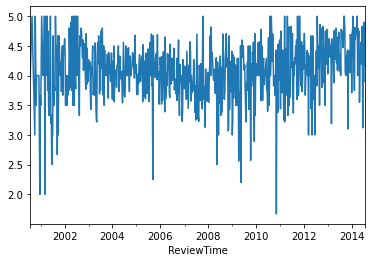

In [ ]:
prod.overall.plot()

Text(0.5, 1.0, 'Random')

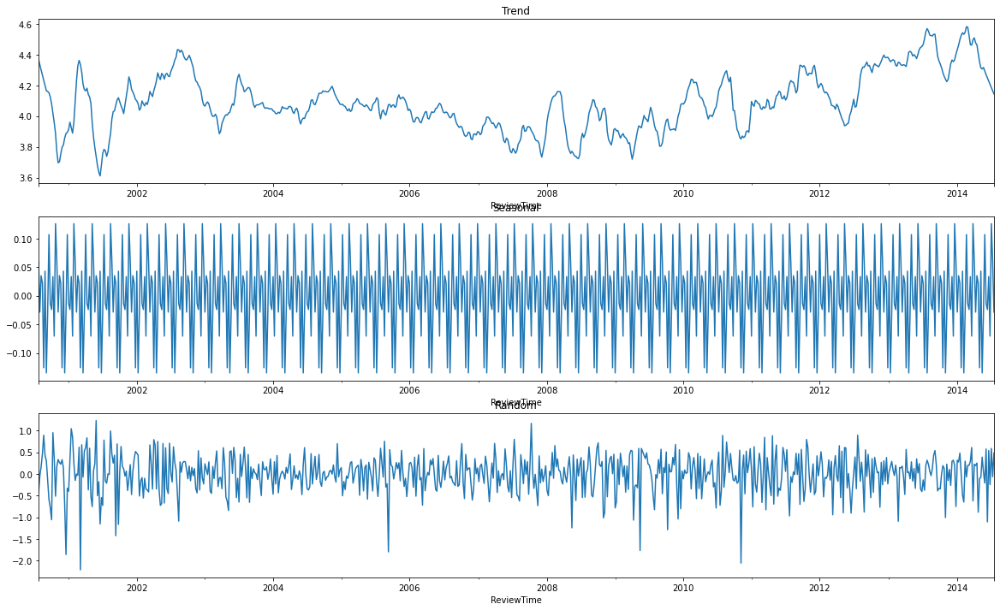

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(prod['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [ ]:
prod1=prod['overall']
prod1

ReviewTime
2000-07-30    4.00
2000-08-06    4.25
2000-08-13    4.50
2000-08-20    4.75
2000-08-27    5.00
              ... 
2014-06-22    4.80
2014-06-29    3.89
2014-07-06    4.90
2014-07-13    4.16
2014-07-20    4.60
Freq: W-SUN, Name: overall, Length: 730, dtype: float64

In [ ]:
prod1 = pd.DataFrame(prod1)

In [ ]:
def checkStationarity(prod1):
  pvalue = adfuller(prod1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [ ]:
ret = checkStationarity(prod1);
ret

'p-value=0.0024608969112551566. Data is stationary'

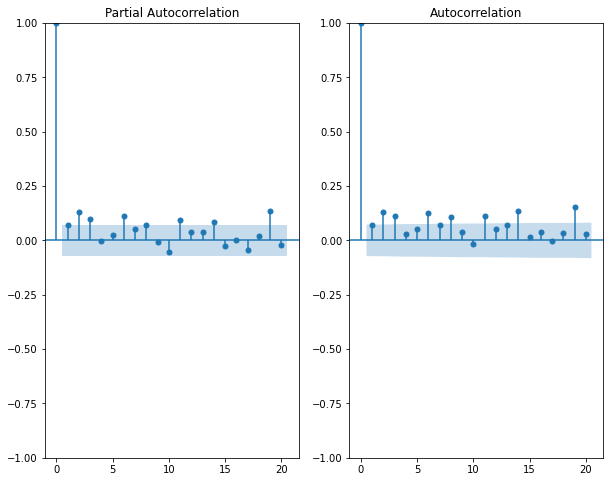

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(prod1,lags=20,ax=ax[0])
plot_acf(prod1.dropna(),lags=20,ax=ax[1])
plt.show()

In [ ]:
ss = int(0.70 * len(top1['overall'])) 
train_df = prod1.iloc[:ss] 
test_df = prod1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 508, test = 222


In [ ]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 508, test = 222


In [ ]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  508
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -325.497
Date:                Sun, 13 Mar 2022   AIC                            680.994
Time:                        20:31:16   BIC                            744.452
Sample:                    07-30-2000   HQIC                           705.878
                         - 04-18-2010                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.0183      0.060     66.663      0.000       3.900       4.136
ar.L1          0.0041      0.553      0.007      0.994      -1.080       1.088
ar.L2          0.1929      0.437      0.441      0.6

In [ ]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-07-30    4.018266
2000-08-06    4.016871
2000-08-13    4.033392
2000-08-20    4.067688
2000-08-27    4.112461
                ...   
2004-09-26    3.990344
2004-10-03    3.990492
2004-10-10    4.095200
2004-10-17    4.067296
2004-10-24    4.104530
Freq: W-SUN, Name: predicted_mean, Length: 222, dtype: float64


In [ ]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      4.00   4.018266 -0.018266
1      4.25   4.016871  0.233129
2      4.50   4.033392  0.466608
3      4.75   4.067688  0.682312
4      5.00   4.112461  0.887539
..      ...        ...       ...
217    4.15   3.990344  0.159656
218    4.33   3.990492  0.339508
219    4.00   4.095200 -0.095200
220    4.06   4.067296 -0.007296
221    4.14   4.104530  0.035470

[222 rows x 3 columns]


In [ ]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.243849663039332
	RMSE = 0.4938113638215832


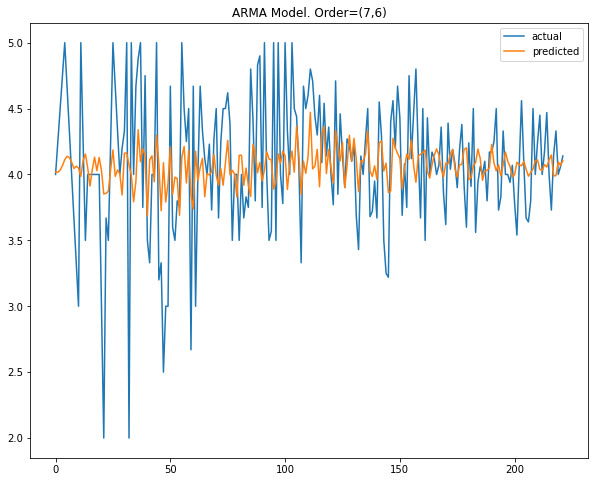

In [ ]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [ ]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m1)

2010-04-25    3.995331
2010-05-02    3.952854
2010-05-09    3.918251
2010-05-16    4.261058
2010-05-23    3.995102
2010-05-30    3.928956
2010-06-06    4.020608
2010-06-13    3.826075
2010-06-20    4.037410
2010-06-27    4.200456
2010-07-04    3.946324
2010-07-11    4.056311
2010-07-18    3.943419
2010-07-25    3.813321
2010-08-01    4.124805
2010-08-08    4.075971
2010-08-15    4.002574
2010-08-22    4.115246
2010-08-29    3.844069
2010-09-05    3.899030
2010-09-12    4.111660
2010-09-19    3.984563
2010-09-26    4.113019
2010-10-03    4.072293
2010-10-10    3.815916
2010-10-17    3.997187
2010-10-24    4.015429
2010-10-31    3.987492
2010-11-07    4.185386
2010-11-14    3.982257
2010-11-21    3.881258
Freq: W-SUN, Name: predicted_mean, dtype: float64


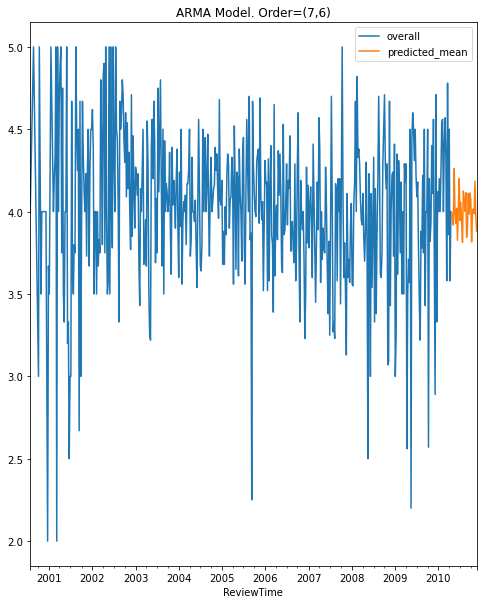

In [ ]:
train.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

# Dataset 2(Sentiment Analysis and Clustering)

In [ ]:
df1['sentiment'] = df1.apply(sent,axis=1)
df1.head()

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let reviews turn off this wond...,45.0,Positive
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative


In [ ]:
df1['sentiment'].value_counts()

Positive    98746
Neutral     11582
Negative     7673
Name: sentiment, dtype: int64

In [ ]:
review_pos = df1[df1["sentiment"]=='Positive'].dropna()
review_neu = df1[df1["sentiment"]=='Neutral'].dropna()
review_neg = df1[df1["sentiment"]=='Negative'].dropna()

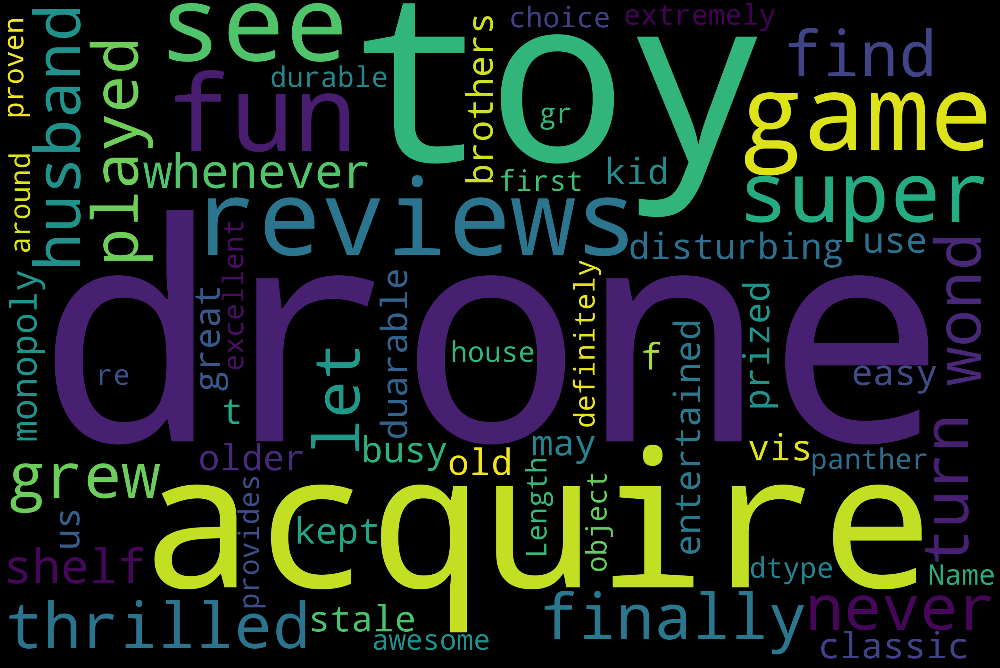

In [ ]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

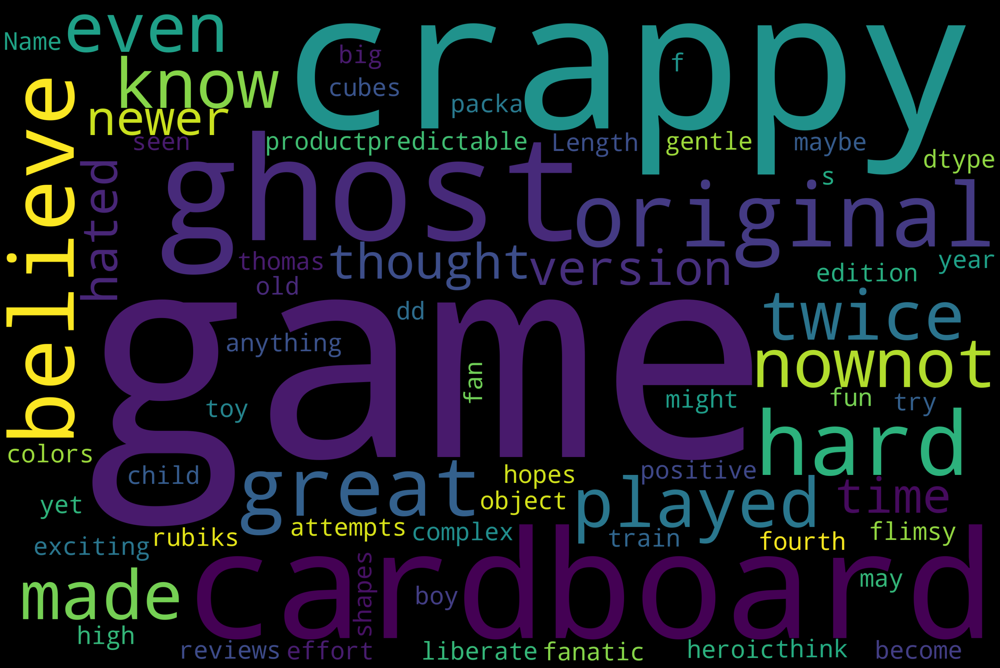

In [ ]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
rev1=df1.copy()

In [ ]:
rev1["category"].unique()

array(['["Toys & Games","Games","Board Games"]',
       '["Toys & Games","Puzzles","Floor Puzzles"]',
       '["Toys & Games","Puzzles","Brain Teasers"]',
       '["Toys & Games","Games","Card Games"]',
       '["Toys & Games","Dress Up & Pretend Play","Pretend Play"]',
       '["Toys & Games","Games"]',
       '["Toys & Games","Games","Standard Playing Card Decks"]',
       '["Toys & Games","Puppets","Finger Puppets"]',
       '["Toys & Games","Arts & Crafts","Stickers"]',
       '["Toys & Games","Action Figures & Statues","Action Figures"]',
       '["Toys & Games","Games","Tile Games"]',
       '["Toys & Games","Learning & Education","Science","Anatomy"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Drawing & Sketch Pads"]',
       '["Toys & Games","Games","DVD Games"]',
       '["Toys & Games","Hobbies","Remote & App Controlled Vehicles & Parts","Remote & App Controlled Vehicles"]',
       '["Toys & Games","Hobbies","Remote & App Controlled Vehicles & Par

In [ ]:
counts1 = rev1["category"].value_counts().to_frame()
counts1

,category
"[""Toys & Games"",""Games"",""Board Games""]",9757
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511
...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5


In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
rev1["reviews"].apply(lambda x: TextBlob(x).words).head() 

0    [we, thrilled, find, acquire, finally, husband...
1    [if, never, played, let, reviews, turn, off, t...
2    [whenever, i, see, game, shelf, i, get, distur...
3    [a, crappy, cardboard, ghost, original, hard, ...
4    [great, game, played, like, twice, even, know,...
Name: reviews, dtype: object

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\abc\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
lemmatizer = WordNetLemmatizer()
def lemmatize_text(Df):
    Df.reviews = " ".join(lemmatizer.lemmatize(word) for word in Df.reviews.split())
    return Df
rev1= rev1.apply(lemmatize_text, axis = 1)

In [ ]:
rev1

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let review turn off this wonde...,45.0,Positive
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative
...,...,...,...,...,...,...,...,...
118065,B00LBI9BKA,5,A18Q24BZK2CB5P,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this drone fun super duarable it easy use kid ...,0.0,Positive
118066,B00LBI9BKA,5,A1I8ON1X0B2N2W,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this brother prized toy it extremely durable p...,50.0,Positive
118067,B00LBI9BKA,5,A3V24H5350ULKI,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,this panther drone toy awesome i definitely re...,0.0,Positive
118068,B00LBI9BKA,5,A1W2F1WI0QZ4AJ,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,this first drone proven excellent choice since...,0.0,Positive


In [ ]:
rev1['polarity'] = rev1['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)

In [ ]:
rev1.head()

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive,-0.001603
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let review turn off this wonde...,45.0,Positive,0.282192
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive,0.033528
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative,-0.166667
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative,0.400000


In [ ]:
avg_polarity1 = rev1.groupby("category")["polarity"].mean().to_frame()
avg_polarity1

,polarity
category,
"[""Toys & Games"",""Action Figures & Statues"",""Accessories""]",0.258646
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",0.253807
"[""Toys & Games"",""Action Figures & Statues"",""Imported"",""Sonic screwdriver that's really a flashlight"",""Super bright LED for timey-wimey adventuring"",""Have your collectible and use it, too!"",""Approx 6.5\"" in length"",""The Eleventh Doctor's handy device shines a bright green beam through light-emitting diodes.""]",0.252243
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",0.237416
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Vehicles""]",0.247413
...,...
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Electric Vehicles""]",0.210531
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pedal Cars""]",0.225855
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pull-Along Wagons""]",0.247045


In [ ]:
counts1 = rev1["category"].value_counts().to_frame()
counts1

,category
"[""Toys & Games"",""Games"",""Board Games""]",9757
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511
...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5


In [ ]:
avg_rating1 = rev1.groupby("category")["overall"].mean().to_frame()
avg_rating1

,overall
category,
"[""Toys & Games"",""Action Figures & Statues"",""Accessories""]",4.413793
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",4.362053
"[""Toys & Games"",""Action Figures & Statues"",""Imported"",""Sonic screwdriver that's really a flashlight"",""Super bright LED for timey-wimey adventuring"",""Have your collectible and use it, too!"",""Approx 6.5\"" in length"",""The Eleventh Doctor's handy device shines a bright green beam through light-emitting diodes.""]",4.513514
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",4.347195
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Vehicles""]",4.309148
...,...
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Electric Vehicles""]",4.555556
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pedal Cars""]",4.342857
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pull-Along Wagons""]",4.506289


In [ ]:
fin_rev1 = counts1.join(avg_polarity1)
fin_rev1.head(30)

,category,polarity
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416
"[""Toys & Games"",""Kids' Electronics"",""Electronic Learning Toys""]",3270,0.220604
"[""Toys & Games"",""Toy Remote Control & Play Vehicles"",""Vehicle Playsets""]",2659,0.217225
"[""Toys & Games"",""Games"",""Card Games""]",2220,0.098920
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Stuffed Animals & Teddy Bears""]",2211,0.276910
"[""Toys & Games"",""Dolls & Accessories"",""Playsets""]",2206,0.235745


In [ ]:
fin_rev1 = fin_rev1.join(avg_rating1)
fin_rev1

,category,polarity,overall
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195
...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000


In [ ]:
fin_rev1['polarity_sentiment'] = fin_rev1.apply(sent1,axis=1)
fin_rev1

,category,polarity,overall,polarity_sentiment
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive
...,...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000,Positive
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,Positive
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000,Positive
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000,Positive


In [ ]:
fin_rev1['product_ids']=fin_rev1.index
fin_rev1

,category,polarity,overall,polarity_sentiment,product_ids
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral,"[""Toys & Games"",""Games"",""Board Games""]"
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]"
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive,"[""Toys & Games"",""Building Toys"",""Building Sets""]"
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Ac..."
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Pl..."
...,...,...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000,Positive,"[""Toys & Games"",""Stuffed Animals & Plush Toys""..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]"
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000,Positive,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea..."


In [ ]:
fin_rev1.polarity_sentiment.value_counts()

Positive    359
Neutral      11
Negative      1
Name: polarity_sentiment, dtype: int64

In [ ]:
fin_rev1.rename(columns = {'category':'counts'}, inplace = True)

In [ ]:
fin_rev1.rename(columns = {'product_ids':'category'}, inplace = True)

In [ ]:
fin_rev1

,counts,polarity,overall,polarity_sentiment,category
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral,"[""Toys & Games"",""Games"",""Board Games""]"
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]"
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive,"[""Toys & Games"",""Building Toys"",""Building Sets""]"
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Ac..."
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Pl..."
...,...,...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000,Positive,"[""Toys & Games"",""Stuffed Animals & Plush Toys""..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]"
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000,Positive,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea..."


In [ ]:
fin_rev1['polarity_sentiment'] = fin_rev1.apply(sent1,axis=1)
fin_rev1

,counts,polarity,overall,polarity_sentiment,category
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral,"[""Toys & Games"",""Games"",""Board Games""]"
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]"
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive,"[""Toys & Games"",""Building Toys"",""Building Sets""]"
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Ac..."
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Pl..."
...,...,...,...,...,...
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Plush Figures"","""",""Officially Licensed Pokemon Product"",""9\"" from top of ears to bottom"",""Soft and Cuddly"",""Perfect for your Pokemon fan"",""Makes a great gift.""]",5,0.338711,4.400000,Positive,"[""Toys & Games"",""Stuffed Animals & Plush Toys""..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]"
"[""Toys & Games"",""Arts & Crafts"",""Drawing & Painting Supplies"",""Paper""]",5,0.310237,4.000000,Positive,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai..."
"[""Toys & Games"",""Dress Up & Pretend Play"",""Beauty & Fashion"",""Vanity Cases"",""The Magical Interactive Cinderella Vanity is a must have for every little girl that wants to be Cinderella!"",""The Vanity interacts with the child and instructs them on which accessories to pick up and use"",""Cinderella's face appears in the mirror."",""This vanity lights up, contains talking phrases that are unlocked by a special key""]",5,0.170259,3.400000,Positive,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea..."


In [ ]:
labelencoder = LabelEncoder()
fin_rev1['category1']=labelencoder.fit_transform(fin_rev1['category'])
fin_rev1.head()

,counts,polarity,overall,polarity_sentiment,category,category1
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,Neutral,"[""Toys & Games"",""Games"",""Board Games""]",126
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,Positive,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",85
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,Positive,"[""Toys & Games"",""Building Toys"",""Building Sets""]",69
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",5571,0.253807,4.362053,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Ac...",1
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3511,0.237416,4.347195,Positive,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",3


In [ ]:
fin_rev1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 371 entries, ["Toys & Games","Games","Board Games"] to ["Toys & Games","Puppets","Puppet Theaters"]
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   counts              371 non-null    int64  
 1   polarity            371 non-null    float64
 2   overall             371 non-null    float64
 3   polarity_sentiment  371 non-null    object 
 4   category            371 non-null    object 
 5   category1           371 non-null    int32  
dtypes: float64(2), int32(1), int64(1), object(2)
memory usage: 26.9+ KB


In [ ]:
fin_rev1=fin_rev1.drop(['polarity_sentiment'], axis=1)
fin_rev1.head(3)

,counts,polarity,overall,category,category1
"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,"[""Toys & Games"",""Games"",""Board Games""]",126
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",85
"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,"[""Toys & Games"",""Building Toys"",""Building Sets""]",69


In [ ]:
fin_rev1.reset_index()

,index,counts,polarity,overall,category,category1
0,"[""Toys & Games"",""Games"",""Board Games""]",9757,0.085658,4.357897,"[""Toys & Games"",""Games"",""Board Games""]",126
1,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",7267,0.269020,4.393698,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",85
2,"[""Toys & Games"",""Building Toys"",""Building Sets""]",6860,0.259607,4.559038,"[""Toys & Games"",""Building Toys"",""Building Sets""]",69
3,"[""Toys & Games"",""Action Figures & Statues"",""Ac...",5571,0.253807,4.362053,"[""Toys & Games"",""Action Figures & Statues"",""Ac...",1
4,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",3511,0.237416,4.347195,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",3
...,...,...,...,...,...,...
366,"[""Toys & Games"",""Stuffed Animals & Plush Toys""...",5,0.338711,4.400000,"[""Toys & Games"",""Stuffed Animals & Plush Toys""...",343
367,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",5,0.451238,5.000000,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",100
368,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",5,0.310237,4.000000,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",38
369,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea...",5,0.170259,3.400000,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea...",97


In [ ]:
rev1['polarity_sentiment'] = rev1.apply(sent1,axis=1)
rev1

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive,-0.001603,Negative
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let review turn off this wonde...,45.0,Positive,0.282192,Positive
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive,0.033528,Neutral
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative,-0.166667,Negative
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative,0.400000,Positive
...,...,...,...,...,...,...,...,...,...,...
118065,B00LBI9BKA,5,A18Q24BZK2CB5P,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this drone fun super duarable it easy use kid ...,0.0,Positive,0.373333,Positive
118066,B00LBI9BKA,5,A1I8ON1X0B2N2W,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this brother prized toy it extremely durable p...,50.0,Positive,0.170972,Positive
118067,B00LBI9BKA,5,A3V24H5350ULKI,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,this panther drone toy awesome i definitely re...,0.0,Positive,0.380635,Positive
118068,B00LBI9BKA,5,A1W2F1WI0QZ4AJ,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,this first drone proven excellent choice since...,0.0,Positive,0.282292,Positive


In [ ]:
review_pos1 = rev1[rev1["polarity_sentiment"]=='Positive'].dropna()
review_neu1 = rev1[rev1["polarity_sentiment"]=='Neutral'].dropna()
review_neg1 = rev1[rev1["polarity_sentiment"]=='Negative'].dropna()

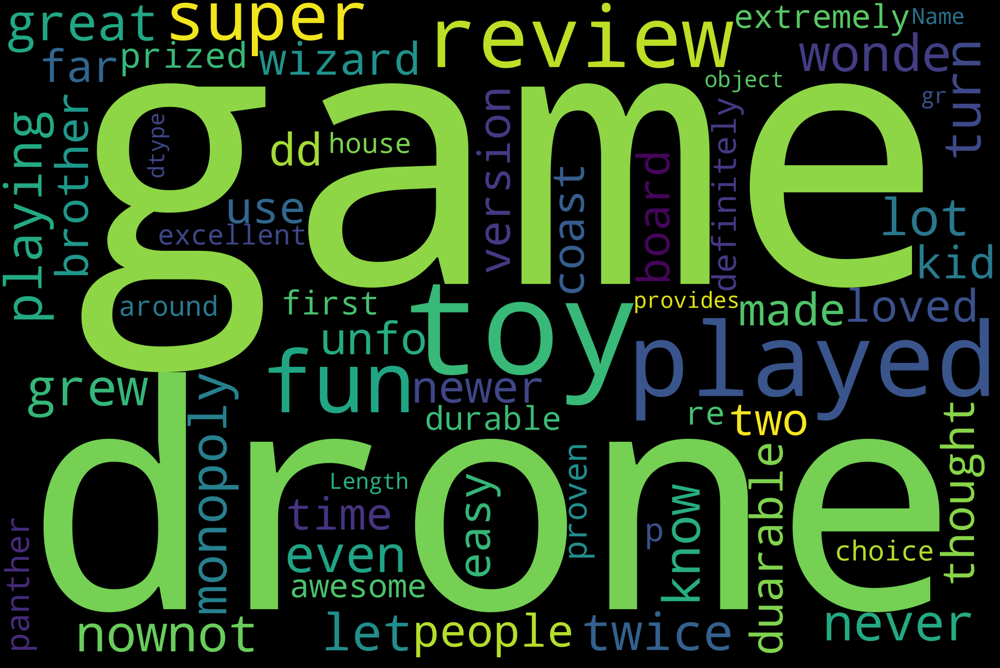

In [ ]:
text = review_pos1["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

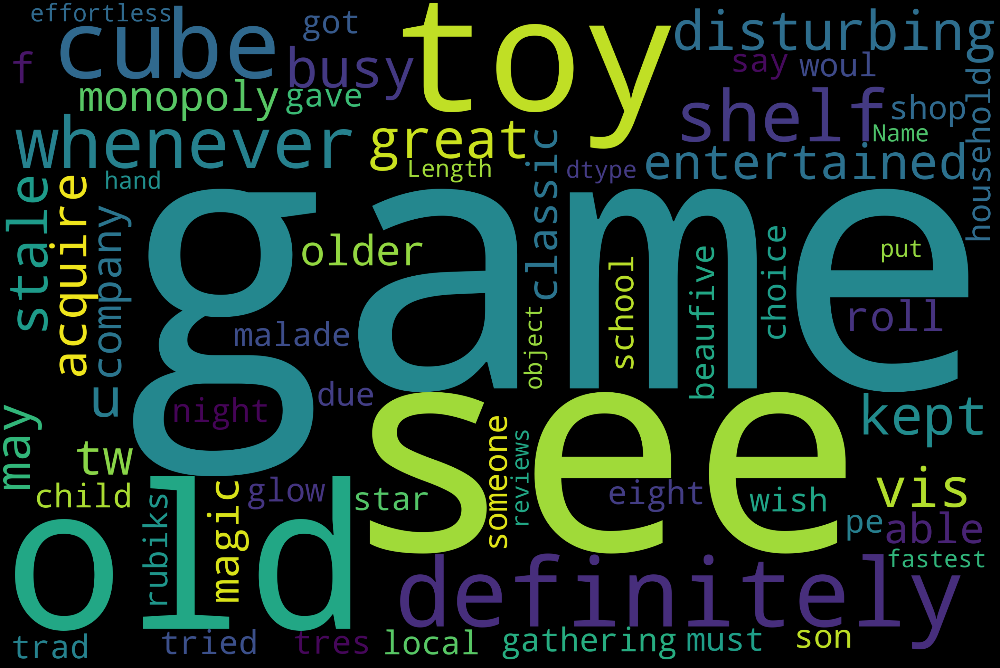

In [ ]:
text = review_neu1["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

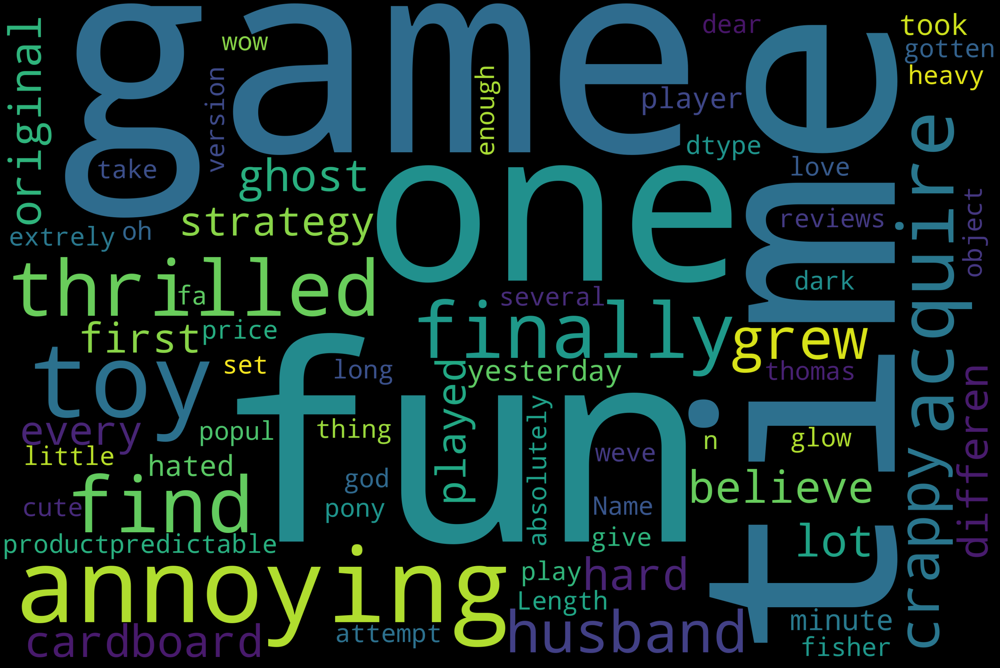

In [ ]:
text = review_neg1["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
review_pos1.to_csv('rev_pos1.csv')

In [ ]:
review_neu1.to_csv('rev_neu1.csv')

In [ ]:
review_neg1.to_csv('rev_neg1.csv')

In [ ]:
fin_rev1 = fin_rev1.reset_index(drop=True)

In [ ]:
#fin_rev1=fin_rev1.drop(['category'], axis=1)
#fin_rev1.head()

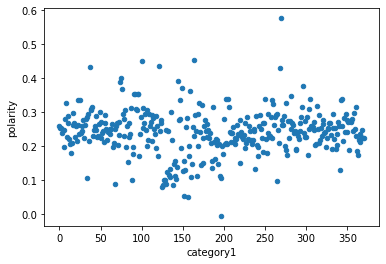

In [ ]:
fin_rev1.plot.scatter(x='category1',y='polarity')
plt.show()

In [ ]:
std_scaler = StandardScaler()
b = fin_rev1.select_dtypes('number')
std_scaler = StandardScaler()
fin_rev1_std = fin_rev1
scale_columns = ['category1','polarity']
fin_rev1_std[scale_columns] = std_scaler.fit_transform(fin_rev1[scale_columns])

In [ ]:
c = std_scaler.fit_transform(b)

In [ ]:
#! pip install hdbscan

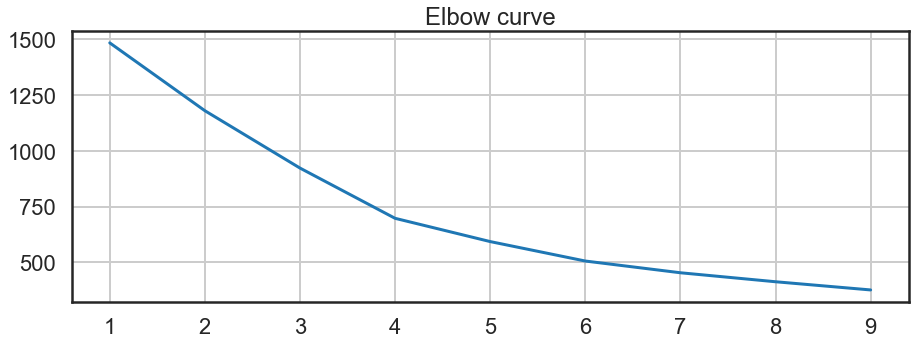

In [ ]:
import warnings
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
warnings.filterwarnings("ignore")
from string import ascii_letters 
import matplotlib.cm as cm
%matplotlib inline 
from sklearn.preprocessing import MinMaxScaler, StandardScaler, FunctionTransformer
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
sns.set_context('poster')
sns.set_style('white') 
sns.set_color_codes() 
plot_kwds = {'alpha' : 0.5, 's' : 80, 'linewidths':0}
warnings.filterwarnings("ignore")
distorsions = []
for k in range(1, 10):
  kmeans = KMeans(n_clusters=k)
  kmeans.fit(c)
  distorsions.append(kmeans.inertia_)
fig = plt.figure(figsize=(15, 5))
plt.plot(range(1, 10), distorsions)
plt.grid(True)
plt.title('Elbow curve');

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55]
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=10)
  cluster_labels = clusterer.fit_predict(c)
  silhouette_avg = silhouette_score(c, cluster_labels)
  print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.2583765931447995
For n_clusters = 3 The average silhouette_score is : 0.2696154777301544
For n_clusters = 4 The average silhouette_score is : 0.2959580875447849
For n_clusters = 5 The average silhouette_score is : 0.2776224563569983
For n_clusters = 6 The average silhouette_score is : 0.3099759062334633
For n_clusters = 7 The average silhouette_score is : 0.26609304294348485
For n_clusters = 8 The average silhouette_score is : 0.269758483579758
For n_clusters = 9 The average silhouette_score is : 0.2800512738295598
For n_clusters = 10 The average silhouette_score is : 0.25822351274536604
For n_clusters = 11 The average silhouette_score is : 0.26449354388777174
For n_clusters = 12 The average silhouette_score is : 0.26745036556172014
For n_clusters = 13 The average silhouette_score is : 0.2535694980577414
For n_clusters = 14 The average silhouette_score is : 0.25270542984848915
For n_clusters = 15 The average silhouette_score is : 0

eps =  0.5 ,min_samples =  10 -1    217
 0     91
 1     48
 3      8
 2      7
dtype: int64


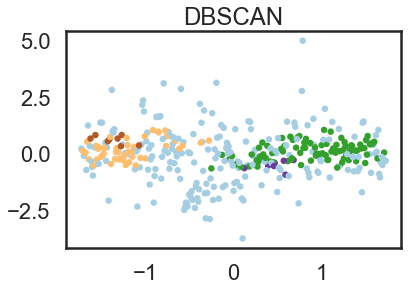

eps =  0.5 ,min_samples =  11 -1    242
 0     86
 1     32
 2     11
dtype: int64


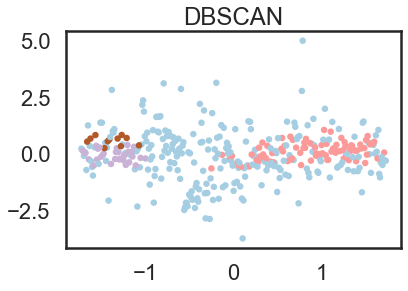

eps =  0.5 ,min_samples =  12 -1    257
 0     82
 1     32
dtype: int64


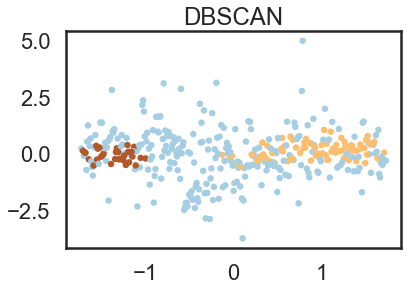

eps =  0.6 ,min_samples =  10 -1    146
 0    139
 1     86
dtype: int64


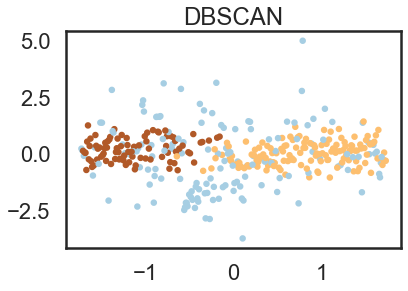

eps =  0.6 ,min_samples =  11 -1    157
 0    136
 1     78
dtype: int64


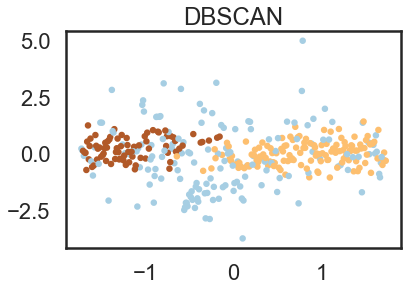

eps =  0.6 ,min_samples =  12 -1    164
 0    129
 1     78
dtype: int64


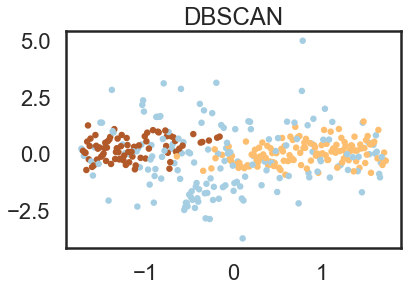

eps =  0.7 ,min_samples =  10  0    277
-1     84
 1     10
dtype: int64


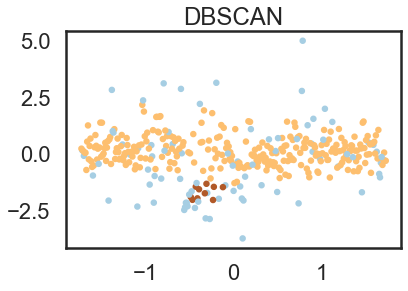

eps =  0.7 ,min_samples =  11  0    263
-1    108
dtype: int64


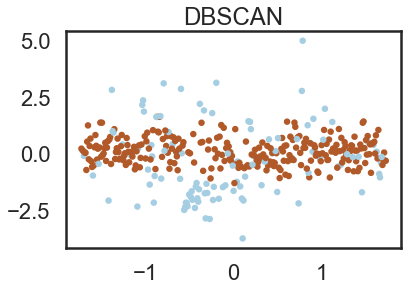

eps =  0.7 ,min_samples =  12  0    262
-1    109
dtype: int64


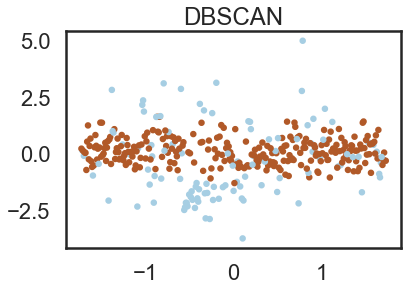

eps =  0.73 ,min_samples =  10  0    290
-1     71
 1     10
dtype: int64


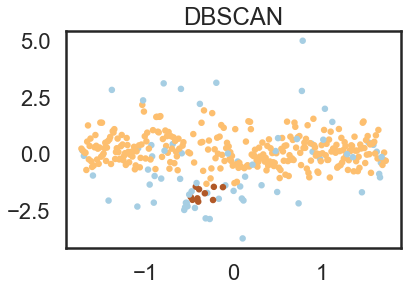

eps =  0.73 ,min_samples =  11  0    285
-1     75
 1     11
dtype: int64


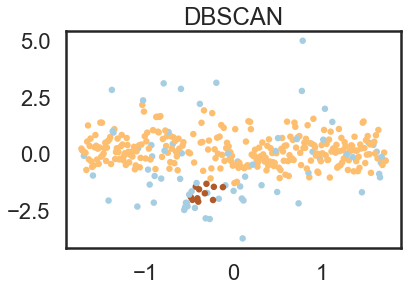

eps =  0.73 ,min_samples =  12  0    276
-1     95
dtype: int64


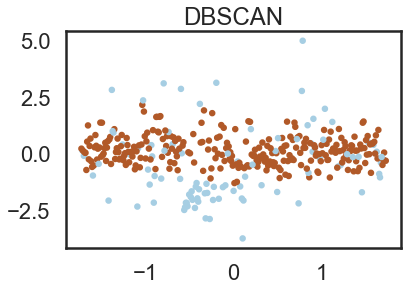

In [ ]:
eps=[0.5,0.6,0.7,0.73] 
min_samples=[10,11,12]
fin_rev_scaled1=fin_rev1[scale_columns]
for i in eps:
  for j in min_samples:
    dbscan = DBSCAN(eps=i, min_samples=j) 
    y_pred = dbscan.fit_predict(c)
    d=pd.DataFrame(y_pred)
    print('eps = ', i,',min_samples = ',j,d.value_counts() )
    plt.scatter(fin_rev1['category1'], fin_rev1['polarity'],c=y_pred, cmap='Paired',s=20) 
    plt.title("DBSCAN")
    plt.show()

eps =  0.5 ,min_samples =  10  0    276
-1     95
dtype: int64


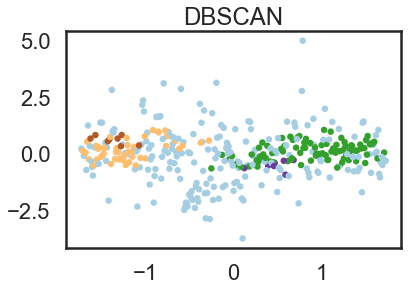

In [ ]:
eps=  0.5 
min_samples=10    
fin_rev_scaled1=fin_rev1[scale_columns]
dbscan = DBSCAN(eps=eps, min_samples=min_samples) 
fin_rev1['clusterid'] = dbscan.fit_predict(c)
y_pred=fin_rev1['clusterid'] 
print('eps = ', eps,',min_samples = ',min_samples,d.value_counts() )
plt.scatter(fin_rev1['category1'], fin_rev1['polarity'],c=y_pred, cmap='Paired',s=20) 
plt.title("DBSCAN")
plt.show()

In [ ]:
clust_0 = fin_rev1[fin_rev1['clusterid']==0]['category'].unique()
print(len(clust_0))
clust_0

91


array(['["Toys & Games","Stuffed Animals & Plush Toys","Plush Figures"]',
       '["Toys & Games","Learning & Education","Basic & Life Skills Toys"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Die-Cast Vehicles"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Play Trains & Railway Sets","Accessories","Train Tracks"]',
       '["Toys & Games","Learning & Education","Musical Instruments","Drums & Percussion"]',
       '["Toys & Games","Learning & Education","Mathematics & Counting"]',
       '["Toys & Games","Puzzles"]',
       '["Toys & Games","Sports & Outdoor Play","Play Tents & Tunnels"]',
       '["Toys & Games","Learning & Education","Science","Biology"]',
       '["Toys & Games","Kids\' Electronics"]',
       '["Toys & Games","Kids\' Electronics","Cameras & Camcorders"]',
       '["Toys & Games","Learning & Education","Musical Instruments","Pianos & Keyboards"]',
       '["Toys & Games","Novelty & Gag Toys","Magic Kits & Accessories"]',
       

In [ ]:
clust_neg1 = fin_rev1[fin_rev1['clusterid']==-1]['category'].unique()
print(len(clust_neg1))
clust_neg1

217


array(['["Toys & Games","Games","Board Games"]',
       '["Toys & Games","Dolls & Accessories","Dolls"]',
       '["Toys & Games","Building Toys","Building Sets"]',
       '["Toys & Games","Action Figures & Statues","Action Figures"]',
       '["Toys & Games","Action Figures & Statues","Playsets & Vehicles","Playsets"]',
       '["Toys & Games","Kids\' Electronics","Electronic Learning Toys"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Vehicle Playsets"]',
       '["Toys & Games","Games","Card Games"]',
       '["Toys & Games","Stuffed Animals & Plush Toys","Stuffed Animals & Teddy Bears"]',
       '["Toys & Games","Dolls & Accessories","Playsets"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Play Vehicles"]',
       '["Toys & Games","Puzzles","Jigsaw Puzzles"]',
       '["Toys & Games","Dress Up & Pretend Play","Pretend Play","Kitchen Toys","Play Food"]',
       '["Toys & Games","Sports & Outdoor Play","Blasters & Foam Play"]',
       '["Toys & G

In [ ]:
clust_1 = fin_rev1[fin_rev1['clusterid']==1]['category'].unique()
print(len(clust_1))
clust_1

48


array(['["Toys & Games","Baby & Toddler Toys","Push & Pull Toys"]',
       '["Toys & Games","Baby & Toddler Toys","Stacking & Nesting Toys"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies"]',
       '["Toys & Games","Dress Up & Pretend Play","Pretend Play","Construction Tools"]',
       '["Toys & Games","Baby & Toddler Toys","Activity Play Centers"]',
       '["Toys & Games","Arts & Crafts","Craft Kits"]',
       '["Toys & Games","Dolls & Accessories"]',
       '["Toys & Games","Building Toys","Stacking Blocks"]',
       '["Toys & Games","Action Figures & Statues","Playsets & Vehicles","Vehicles"]',
       '["Toys & Games","Action Figures & Statues"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Chalk"]',
       '["Toys & Games","Arts & Crafts","Drawing & Sketching Tablets"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Colored Pencils"]',
       '["Toys & Games","Arts & Crafts","Craft Kits","Sewing"]',
     

In [ ]:
cluster0=fin_rev1[(fin_rev1['clusterid'] == 0)]
cluster0high = cluster0.sort_values(by=['overall'], ascending=False)
cluster0high.head(5)

,counts,polarity,overall,category,category1,clusterid
289,17,0.523243,4.647059,"[""Toys & Games"",""Sports & Outdoor Play"",""Pools...",1.260527,0
173,78,-0.254471,4.589744,"[""Toys & Games"",""Sports & Outdoor Play"",""Play ...",1.064445,0
122,151,0.420468,4.556291,"[""Toys & Games"",""Sports & Outdoor Play"",""Sports""]",1.437934,0
82,296,-0.021678,4.547297,"[""Toys & Games"",""Stuffed Animals & Plush Toys""...",1.512632,0
158,100,0.768652,4.540000,"[""Toys & Games"",""Novelty & Gag Toys"",""Temporar...",0.644269,0


In [ ]:
a = cluster0high.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Pool Toys","Inflatable Water Slides"]',
       '["Toys & Games","Sports & Outdoor Play","Play Sets & Playground Equipment","Freestanding Climbers"]',
       '["Toys & Games","Sports & Outdoor Play","Sports"]',
       '["Toys & Games","Stuffed Animals & Plush Toys","Plush Puppets"]',
       '["Toys & Games","Novelty & Gag Toys","Temporary Tattoos"]',
       '["Toys & Games","Tricycles, Scooters & Wagons","Pull-Along Wagons"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Play Trains & Railway Sets","Accessories","Train Tracks"]',
       '["Toys & Games","Sports & Outdoor Play","Play Sets & Playground Equipment","Play Set Attachments","Swings"]',
       '["Toys & Games","Sports & Outdoor Play","Play Sets & Playground Equipment","Freestanding Slides"]',
       '["Toys & Games","Party Supplies","Tablecovers"]',
       '["Toys & Games","Party Supplies","Party Tableware","Cups"]',
       '["Toys & Games","T

In [ ]:
cluster0low = cluster0.sort_values(by=['overall'], ascending=True)
cluster0low.head()

,counts,polarity,overall,category,category1,clusterid
237,33,-0.546840,4.030303,"[""Toys & Games"",""Learning & Education"",""Geogra...",0.270780,0
146,119,-0.103424,4.033613,"[""Toys & Games"",""Learning & Education"",""Musica...",0.298792,0
250,26,-0.048940,4.038462,"[""Toys & Games"",""Sports & Outdoor Play"",""Marbl...",1.045770,0
126,145,-0.189097,4.041379,"[""Toys & Games"",""Toy Remote Control & Play Veh...",1.634016,0
69,351,-0.541673,4.056980,"[""Toys & Games"",""Kids' Electronics""]",0.177407,0


In [ ]:
a = cluster0low.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Learning & Education","Geography"]',
       '["Toys & Games","Learning & Education","Musical Instruments","Guitars & Strings"]',
       '["Toys & Games","Sports & Outdoor Play","Marble Games"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Pull Back Vehicles"]',
       '["Toys & Games","Kids\' Electronics"]',
       '["Toys & Games","Sports & Outdoor Play","Sports","Toy Sports","Toy Baseball"]',
       '["Toys & Games","Sports & Outdoor Play","Slumber Bags"]',
       '["Toys & Games","Sports & Outdoor Play","Nature Exploration Toys"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Sprinklers"]',
       '["Toys & Games","Party Supplies","Party Favors"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Basketball & Volleyball Sets"]',
       '["Toys & Games","Stuffed Animals & Plush Toys","Plush Interactive Toys"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Pool Rafts & Inflat

In [ ]:
clusterneg1=fin_rev1[(fin_rev1['clusterid'] == -1)]
clusterneg1high = clusterneg1.sort_values(by=['overall'], ascending=False)
clusterneg1high.head()

,counts,polarity,overall,category,category1,clusterid
342,6,4.981076,5.0,"[""Toys & Games"",""Party Supplies"",""Party Tablew...",0.784328,-1
367,5,3.108605,5.0,"[""Toys & Games"",""Dress Up & Pretend Play"",""Hats""]",-0.793665,-1
344,6,2.362228,5.0,"[""Toys & Games"",""Dolls & Accessories"",""Doll Ac...",-1.027096,-1
332,7,0.633738,5.0,"[""Toys & Games"",""Sports & Outdoor Play"",""Kites...",1.017759,-1
346,6,1.992346,5.0,"[""Toys & Games"",""Sports & Outdoor Play"",""Kites...",1.036433,-1


In [ ]:
a = clusterneg1high.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Party Supplies","Party Tableware","Plates"]',
       '["Toys & Games","Dress Up & Pretend Play","Hats"]',
       '["Toys & Games","Dolls & Accessories","Doll Accessories","Clothing & Shoes","Made by Sophia\'s, Designer Doll Clothes Affordably Priced!","2 Great Pairs Included with Heart Cut Out Design","1 Pair of Hot Pink Garden Sandals","1 Pair of White Garden Sandals. Sophia\'s Copyright Design","Made by Sophia\'s, Leading Doll Furniture, Doll Clothes, Doll Shoes & Doll Accessory Maker!"]',
       '["Toys & Games","Sports & Outdoor Play","Kites & Wind Spinners","Kite Accessories"]',
       '["Toys & Games","Sports & Outdoor Play","Kites & Wind Spinners","Wind Spinners"]',
       '["Toys & Games","Games","Game Accessories","Game Pieces"]',
       '["Toys & Games","Hobbies","Remote & App Controlled Vehicles & Parts","Remote & App Controlled Vehicles","Trucks"]',
       '["Toys & Games","Sports & Outdoor Play","Play Sets & Playground Equipment","Teeter Totters"]'

In [ ]:
clusterneg1low = clusterneg1.sort_values(by=['overall'], ascending=True)
clusterneg1low.head()

,counts,polarity,overall,category,category1,clusterid
343,6,-2.130785,2.500000,"[""Toys & Games"",""Dress Up & Pretend Play"",""Acc...",-0.905712,-1
358,5,-1.336715,2.800000,"[""Toys & Games"",""Dolls & Accessories"",""Dolls"",...",-0.952398,-1
221,42,-2.039983,2.952381,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",-1.419260,-1
299,13,-2.361511,3.000000,"[""Toys & Games"",""Games"",""Game Room Games""]",-0.438850,-1
248,26,-0.461887,3.192308,"[""Toys & Games"",""Learning & Education"",""Detect...",0.214756,-1


In [ ]:
a = clusterneg1low.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Dress Up & Pretend Play","Accessories","Plastic","Imported","0.1\\" high","0.4\\" wide","13-Inch long molded plastic wand","Officially licensed Harry Potter Movie merchandise","Rubies brings you official Hogwarts robes and ties"]',
       '["Toys & Games","Dolls & Accessories","Dolls","Allows child to dress up like Olivia. 2 different dress-up themes; Princess and Safari Adventurer^Be a ballerina or a safari adventurer, all in the same day, with 2 different dress-up themes in 1 complete set^Decorate and personalize your trunk with special Olivia stickers^Tutu, leg warmers, ballet slippers, 2 bow, crown, telescope, safari hat, and a trunk for storage^"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Paints","Finger Paint"]',
       '["Toys & Games","Games","Game Room Games"]',
       '["Toys & Games","Learning & Education","Detective & Spy"]',
       '["Toys & Games","Sports & Outdoor Play","Sports","Boxing","Punching Bags"]',
       '[

In [ ]:
cluster1=fin_rev1[(fin_rev1['clusterid'] == 1)]
cluster1high = cluster1.sort_values(by=['overall'], ascending=False)
cluster1high.head()

,counts,polarity,overall,category,category1,clusterid
68,359,1.054136,4.568245,"[""Toys & Games"",""Dolls & Accessories""]",-0.915049,1
105,198,0.263988,4.560606,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",-1.465946,1
242,30,0.709789,4.533333,"[""Toys & Games"",""Baby & Toddler Toys"",""Car Sea...",-1.213841,1
155,106,0.550019,4.518868,"[""Toys & Games"",""Action Figures & Statues"",""St...",-1.662028,1
238,33,0.987939,4.515152,"[""Toys & Games"",""Dress Up & Pretend Play"",""Bea...",-0.859026,1


In [ ]:
a = cluster1high.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Dolls & Accessories"]',
       '["Toys & Games","Arts & Crafts","Drawing & Painting Supplies","Colored Pencils"]',
       '["Toys & Games","Baby & Toddler Toys","Car Seat & Stroller Toys"]',
       '["Toys & Games","Action Figures & Statues","Statues & Bobbleheads","Statues"]',
       '["Toys & Games","Dress Up & Pretend Play","Beauty & Fashion","Makeup"]',
       '["Toys & Games","Action Figures & Statues","Imported","Sonic screwdriver that\'s really a flashlight","Super bright LED for timey-wimey adventuring","Have your collectible and use it, too!","Approx 6.5\\" in length","The Eleventh Doctor\'s handy device shines a bright green beam through light-emitting diodes."]',
       '["Toys & Games","Dress Up & Pretend Play"]',
       '["Toys & Games","Dress Up & Pretend Play","Pretend Play","Grocery Shopping","Cash Registers"]',
       '["Toys & Games","Dolls & Accessories","Doll Accessories","Furniture"]',
       '["Toys & Games","Arts & Crafts","Craft Kits","S

In [ ]:
cluster1low = cluster1.sort_values(by=['overall'], ascending=True)
cluster1low.head()

,counts,polarity,overall,category,category1,clusterid
258,25,-0.494228,4.040000,"[""Toys & Games"",""Baby & Toddler Toys"",""Toy Gif...",-1.111131,1
213,46,-0.432242,4.043478,"[""Toys & Games"",""Arts & Crafts"",""Drawing & Pai...",-1.391248,1
219,42,-0.498942,4.071429,"[""Toys & Games"",""Arts & Crafts"",""Craft Kits"",""...",-1.587330,1
67,373,-0.041051,4.107239,"[""Toys & Games"",""Arts & Crafts"",""Craft Kits""]",-1.484620,1
261,24,0.057196,4.125000,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",-1.680702,1


In [ ]:
a = cluster0low.category

In [ ]:
a = a.to_numpy()

In [ ]:
a

array(['["Toys & Games","Learning & Education","Geography"]',
       '["Toys & Games","Learning & Education","Musical Instruments","Guitars & Strings"]',
       '["Toys & Games","Sports & Outdoor Play","Marble Games"]',
       '["Toys & Games","Toy Remote Control & Play Vehicles","Pull Back Vehicles"]',
       '["Toys & Games","Kids\' Electronics"]',
       '["Toys & Games","Sports & Outdoor Play","Sports","Toy Sports","Toy Baseball"]',
       '["Toys & Games","Sports & Outdoor Play","Slumber Bags"]',
       '["Toys & Games","Sports & Outdoor Play","Nature Exploration Toys"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Sprinklers"]',
       '["Toys & Games","Party Supplies","Party Favors"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Basketball & Volleyball Sets"]',
       '["Toys & Games","Stuffed Animals & Plush Toys","Plush Interactive Toys"]',
       '["Toys & Games","Sports & Outdoor Play","Pools & Water Fun","Pool Rafts & Inflat

In [ ]:
test_data1 = np.vstack([fin_rev1]) 

In [ ]:
import hdbscan
min_size=[10,11,14,17,18]
clusters=[]
outliers=[]
for i in min_size:
  clusterer_label = hdbscan.HDBSCAN(min_cluster_size=i).fit_predict(c)
  a,b=np.unique(clusterer_label,return_counts=True)
  print('---------','for',i,'min_samples','-------------')
  clusters.append(len(a))
  print('the number of clusters:',len(a))
  if(a[0]==-1):
    outliers.append(b[0])
    print('No. of outliers is: ',b[0])
  else:
    outliers.append(0)
    print('No. of outliers: 0')

--------- for 10 min_samples -------------
the number of clusters: 3
No. of outliers is:  231
--------- for 11 min_samples -------------
the number of clusters: 3
No. of outliers is:  239
--------- for 14 min_samples -------------
the number of clusters: 3
No. of outliers is:  260
--------- for 17 min_samples -------------
the number of clusters: 3
No. of outliers is:  265
--------- for 18 min_samples -------------
the number of clusters: 3
No. of outliers is:  278


In [ ]:
test_data = np.vstack(c)

In [ ]:
clusterer1 = hdbscan.HDBSCAN(min_cluster_size=16, gen_min_span_tree=True) 
clusterer1.fit(test_data)

HDBSCAN(gen_min_span_tree=True, min_cluster_size=16)

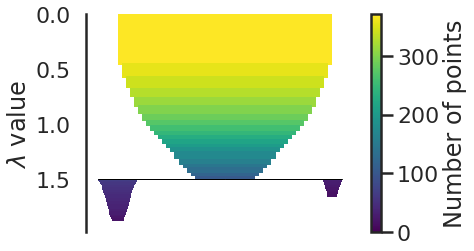

In [ ]:
clusterer1.condensed_tree_.plot()

For:  15
no. of clusters formed are:  3
for min samples:  15 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


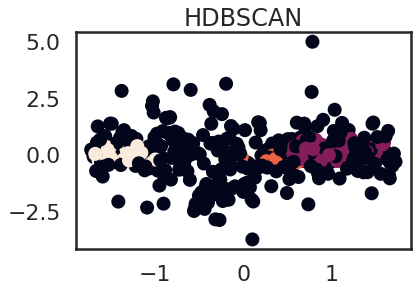

the number of clusters: 3
No. of outliers is:  266
For:  16
no. of clusters formed are:  3
for min samples:  16 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


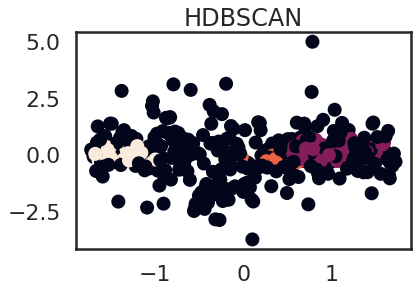

the number of clusters: 3
No. of outliers is:  271
For:  17
no. of clusters formed are:  3
for min samples:  17 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


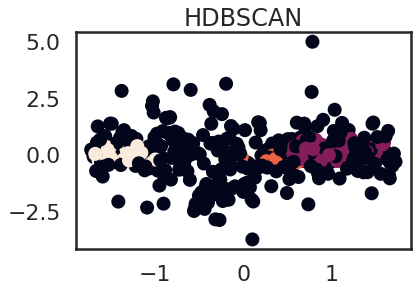

the number of clusters: 3
No. of outliers is:  265
For:  18
no. of clusters formed are:  3
for min samples:  18 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


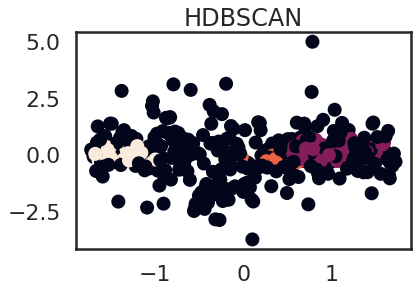

the number of clusters: 3
No. of outliers is:  278
For:  19
no. of clusters formed are:  3
for min samples:  19 , cluster count:  
 clusterid
-1           298
 0            37
 2            22
 1            14
dtype: int64


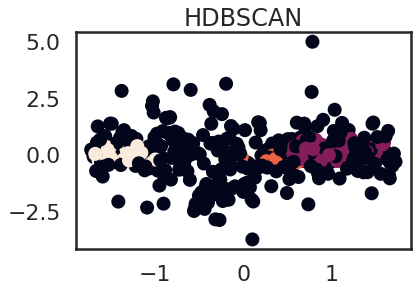

the number of clusters: 3
No. of outliers is:  281


In [ ]:
min_size=[15,16,17,18,19]
clusters=[]
outliers=[]
for i in min_size:
  clusterer_label = hdbscan.HDBSCAN(min_cluster_size=i).fit_predict(c)
  a,b=np.unique(clusterer_label,return_counts=True)
  print('For: ',i)
  clusters.append(len(a))
  print('no. of clusters formed are: ',len(a))
  d=pd.DataFrame(y_pred)
  print('for min samples: ',i,',','cluster count: ','\n',d.value_counts())
  plt.scatter(fin_rev1['category1'],fin_rev1['polarity'],c = y_pred)
  plt.title('HDBSCAN')
  plt.show()
  print('the number of clusters:',len(a))
  if(a[0]==-1):
    outliers.append(b[0])
    print('No. of outliers is: ',b[0])
  else:
    outliers.append(0)
    print('No. of outliers: 0')

# Time Series Ananlysis

## Neutral Reviews

In [ ]:
top = rev1[(rev1['polarity_sentiment'] == 'Neutral')]
top

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
2,786950072,4,A1UP19XQH91JT0,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,whenever i see game shelf i get disturbing vis...,0.0,Positive,0.033528,Neutral
5,786950072,5,A1GDPTMBF6VYSC,"[""Toys & Games"",""Games"",""Board Games""]",2013-02-04,great game stale kept u busy entertained no tw...,0.0,Positive,0.014286,Neutral
6,786950072,4,A368JTR1WZASA3,"[""Toys & Games"",""Games"",""Board Games""]",2011-06-13,acquire may old monopoly older i see classic f...,50.0,Positive,0.083894,Neutral
8,786950072,3,A6DR798RBPIGT,"[""Toys & Games"",""Games"",""Board Games""]",2013-07-23,for company able roll magic the gathering trad...,0.0,Neutral,0.069643,Neutral
12,786955708,5,A2O1SP6ZPJKCAS,"[""Toys & Games"",""Games"",""Board Games""]",2012-04-25,i got game local shop i must say i wish i woul...,33.0,Positive,0.060648,Neutral
...,...,...,...,...,...,...,...,...,...,...
117998,B00J5KVSWK,3,ANRD6B90QL0FF,"[""Toys & Games"",""Arts & Crafts""]",2014-07-01,this toy definitely child eight i tried i gave...,0.0,Neutral,0.033594,Neutral
118016,B00JRCB3HQ,5,A2Q9KLA3E0RYNI,"[""Toys & Games"",""Building Toys"",""Building Sets""]",2014-07-10,malade tres beaufive star,0.0,Positive,0.000000,Neutral
118024,B00JV9D9M2,5,A2KMMT6KLYAFFF,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-04,this definitely son toy choice night due glow ...,0.0,Positive,0.039583,Neutral
118043,B00KZAROWC,5,A17V9XL4CWTQ6G,"[""Toys & Games"",""Puzzles"",""Brain Teasers"",""Maz...",2014-07-13,if someone household old school rubiks cube pe...,0.0,Positive,0.100000,Neutral


In [ ]:
top.isnull().sum()

product_id            0
overall               0
reviewerID            0
category              0
ReviewTime            0
reviews               0
helpful_rate          0
sentiment             0
polarity              0
polarity_sentiment    0
dtype: int64

In [ ]:
top = top.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
top

,overall,category,ReviewTime,polarity,polarity_sentiment
2,4,"[""Toys & Games"",""Games"",""Board Games""]",2012-09-10,0.033528,Neutral
5,5,"[""Toys & Games"",""Games"",""Board Games""]",2013-02-04,0.014286,Neutral
6,4,"[""Toys & Games"",""Games"",""Board Games""]",2011-06-13,0.083894,Neutral
8,3,"[""Toys & Games"",""Games"",""Board Games""]",2013-07-23,0.069643,Neutral
12,5,"[""Toys & Games"",""Games"",""Board Games""]",2012-04-25,0.060648,Neutral
...,...,...,...,...,...
117998,3,"[""Toys & Games"",""Arts & Crafts""]",2014-07-01,0.033594,Neutral
118016,5,"[""Toys & Games"",""Building Toys"",""Building Sets""]",2014-07-10,0.000000,Neutral
118024,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-04,0.039583,Neutral
118043,5,"[""Toys & Games"",""Puzzles"",""Brain Teasers"",""Maz...",2014-07-13,0.100000,Neutral


In [ ]:
top['ReviewTime'] = pd.to_datetime(top['ReviewTime'])

In [ ]:
top = top.set_index("ReviewTime")
print(top)

            overall                                           category  \
ReviewTime                                                               
2012-09-10        4             ["Toys & Games","Games","Board Games"]   
2013-02-04        5             ["Toys & Games","Games","Board Games"]   
2011-06-13        4             ["Toys & Games","Games","Board Games"]   
2013-07-23        3             ["Toys & Games","Games","Board Games"]   
2012-04-25        5             ["Toys & Games","Games","Board Games"]   
...             ...                                                ...   
2014-07-01        3                   ["Toys & Games","Arts & Crafts"]   
2014-07-10        5   ["Toys & Games","Building Toys","Building Sets"]   
2014-07-04        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-13        5  ["Toys & Games","Puzzles","Brain Teasers","Maz...   
2014-07-07        5  ["Toys & Games","Puzzles","Brain Teasers","Maz...   

            polarity polarity_sentime

In [ ]:
top=top.sort_values(by='ReviewTime')
top

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
2000-08-31,5,"[""Toys & Games"",""Games"",""Board Games""]",0.029167,Neutral
2000-08-31,5,"[""Toys & Games"",""Games"",""Board Games""]",0.029167,Neutral
2000-09-30,4,"[""Toys & Games"",""Baby & Toddler Toys"",""Music &...",0.056250,Neutral
2000-09-30,4,"[""Toys & Games"",""Baby & Toddler Toys"",""Music &...",0.056250,Neutral
2000-11-20,3,"[""Toys & Games"",""Games"",""Board Games""]",0.012000,Neutral
...,...,...,...,...
2014-07-22,3,"[""Toys & Games"",""Learning & Education"",""Basic ...",0.088235,Neutral
2014-07-22,4,"[""Toys & Games"",""Games"",""Card Games""]",0.033198,Neutral
2014-07-22,3,"[""Toys & Games"",""Dress Up & Pretend Play"",""Pre...",0.057993,Neutral


In [ ]:
top = top.resample('W').mean().round(2)

In [ ]:
top = top.interpolate(method='linear')
top

,overall,polarity
ReviewTime,,
2000-09-03,5.00,0.0300
2000-09-10,4.75,0.0375
2000-09-17,4.50,0.0450
2000-09-24,4.25,0.0525
2000-10-01,4.00,0.0600
...,...,...
2014-06-29,4.07,0.0400
2014-07-06,4.21,0.0400
2014-07-13,4.34,0.0300


<AxesSubplot:xlabel='ReviewTime'>

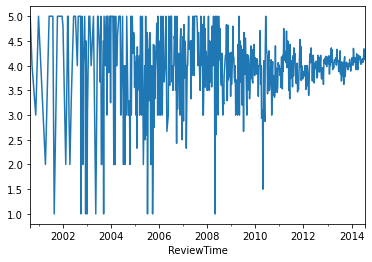

In [ ]:
top.overall.plot()

Text(0.5, 1.0, 'Random')

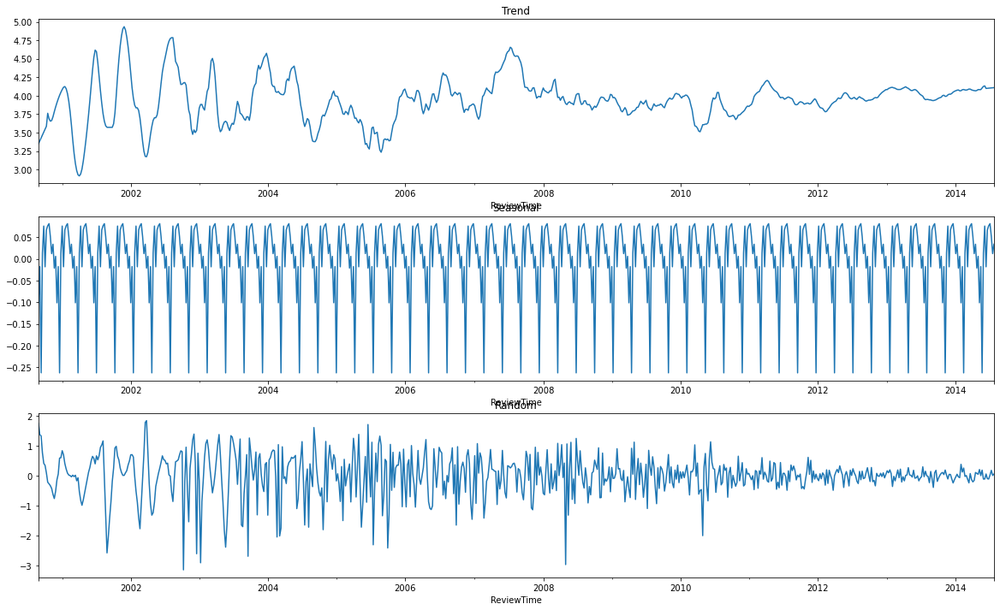

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(top['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [ ]:
top1=top['overall']
top1

ReviewTime
2000-09-03    5.00
2000-09-10    4.75
2000-09-17    4.50
2000-09-24    4.25
2000-10-01    4.00
              ... 
2014-06-29    4.07
2014-07-06    4.21
2014-07-13    4.34
2014-07-20    4.13
2014-07-27    4.20
Freq: W-SUN, Name: overall, Length: 726, dtype: float64

In [ ]:
top1 = pd.DataFrame(top1)

In [ ]:
def checkStationarity(top1):
  pvalue = adfuller(top1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [ ]:
ret = checkStationarity(top1);
ret

'p-value=1.9498525926342773e-20. Data is stationary'

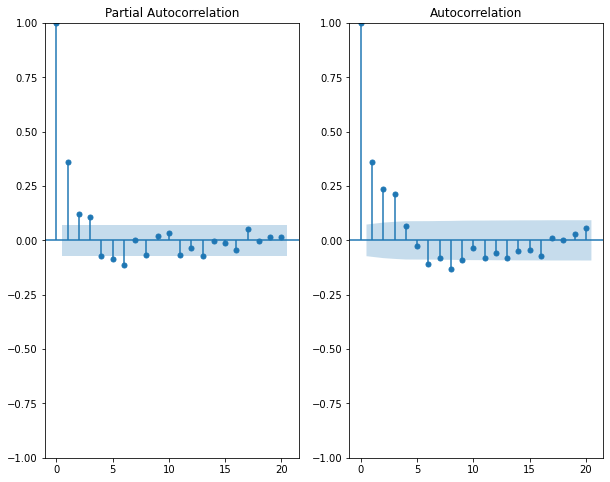

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(top1,lags=20,ax=ax[0])
plot_acf(top1.dropna(),lags=20,ax=ax[1])
plt.show()

In [ ]:
ss = int(0.80 * len(top1['overall'])) 
train_df = top1.iloc[:ss] 
test_df = top1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 580, test = 146


In [ ]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 580, test = 146


In [ ]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  580
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -671.773
Date:                Sun, 13 Mar 2022   AIC                           1373.546
Time:                        20:13:44   BIC                           1438.992
Sample:                    09-03-2000   HQIC                          1399.062
                         - 10-09-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.9251      0.051     77.504      0.000       3.826       4.024
ar.L1          0.6999      3.647      0.192      0.848      -6.448       7.847
ar.L2          0.7130      0.326      2.187      0.0

In [ ]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-09-03    3.925091
2000-09-10    4.321948
2000-09-17    4.323917
2000-09-24    4.288876
2000-10-01    4.120614
                ...   
2003-05-18    3.391319
2003-05-25    2.807861
2003-06-01    2.564300
2003-06-08    2.679185
2003-06-15    3.175457
Freq: W-SUN, Name: predicted_mean, Length: 146, dtype: float64


In [ ]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      5.00   3.925091  1.074909
1      4.75   4.321948  0.428052
2      4.50   4.323917  0.176083
3      4.25   4.288876 -0.038876
4      4.00   4.120614 -0.120614
..      ...        ...       ...
141    1.80   3.391319 -1.591319
142    1.00   2.807861 -1.807861
143    2.00   2.564300 -0.564300
144    3.00   2.679185  0.320815
145    4.00   3.175457  0.824543

[146 rows x 3 columns]


In [ ]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.6323905971220247
	RMSE = 0.795229902054761


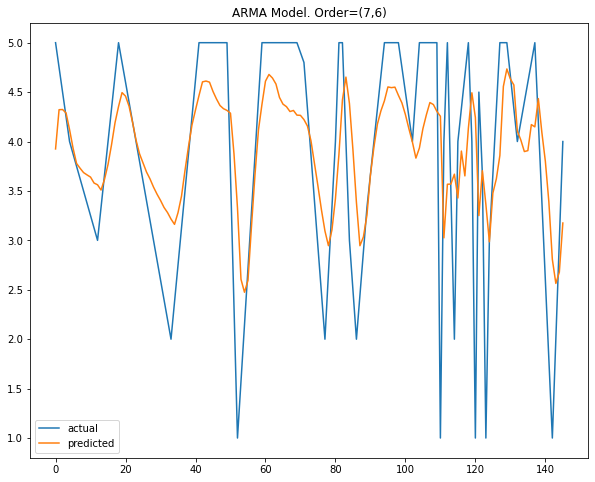

In [ ]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [ ]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+70, typ='levels')
print(fcast_m1)

2011-10-16    3.805520
2011-10-23    3.902314
2011-10-30    3.828749
2011-11-06    3.925161
2011-11-13    3.881751
                ...   
2013-01-20    3.942578
2013-01-27    3.913473
2013-02-03    3.927550
2013-02-10    3.932250
2013-02-17    3.910733
Freq: W-SUN, Name: predicted_mean, Length: 71, dtype: float64


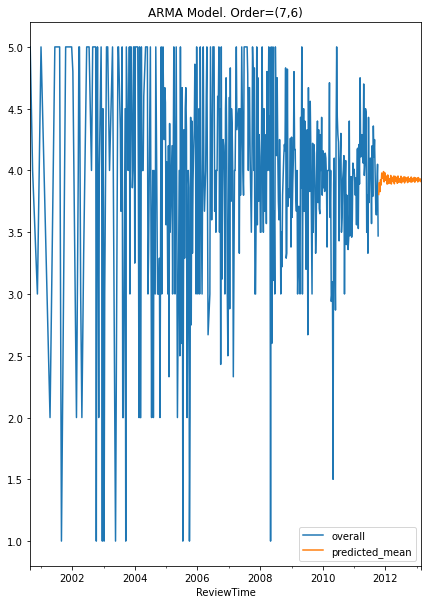

In [ ]:
train.plot(figsize=(7,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## Negative Sentiments

In [ ]:
sec = rev1[(rev1['polarity_sentiment'] == 'Negative')]
sec

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
0,786950072,5,A35T7AVM3A5F4A,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,we thrilled find acquire finally husband grew ...,33.0,Positive,-0.001603,Negative
3,786950072,1,A337DRCGSM0HSC,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,a crappy cardboard ghost original hard believe...,50.0,Negative,-0.166667,Negative
9,786950072,5,A3FI4WZ8EQTRS5,"[""Toys & Games"",""Games"",""Board Games""]",2014-06-21,it fun game a lot strategy every game differen...,0.0,Positive,-0.016667,Negative
10,786950072,5,A105H7LA4UCUKN,"[""Toys & Games"",""Games"",""Board Games""]",2011-03-20,played first time yesterday player took minute...,0.0,Positive,-0.010667,Negative
14,786955708,1,A3VEEHFVY1YSDC,"[""Toys & Games"",""Games"",""Board Games""]",2013-01-10,hated productpredictable not fun it attempt fa...,19.0,Negative,-0.194792,Negative
...,...,...,...,...,...,...,...,...,...,...
117951,B00J49UTP4,3,A2KFWHHUFVKFXZ,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-07-05,this one annoying toy weve gotten long time i ...,0.0,Neutral,-0.044129,Negative
117954,B00J49UTP4,3,AF8SREA2XE7BJ,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-06-30,oh dear god thing annoying it cute enough toy ...,0.0,Neutral,-0.053108,Negative
117971,B00J49UTW2,3,A1GNYV0RA0EQSS,"[""Toys & Games"",""Toy Remote Control & Play Veh...",2014-07-07,i several thomas take n play set one give wow ...,50.0,Neutral,-0.210204,Negative
117993,B00J49UTWC,4,A33230MIA3W7G4,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",2014-07-20,fisher price version my little pony with popul...,50.0,Positive,-0.048214,Negative


In [ ]:
sec = sec.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
sec

,overall,category,ReviewTime,polarity,polarity_sentiment
0,5,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,-0.001603,Negative
3,1,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,-0.166667,Negative
9,5,"[""Toys & Games"",""Games"",""Board Games""]",2014-06-21,-0.016667,Negative
10,5,"[""Toys & Games"",""Games"",""Board Games""]",2011-03-20,-0.010667,Negative
14,1,"[""Toys & Games"",""Games"",""Board Games""]",2013-01-10,-0.194792,Negative
...,...,...,...,...,...
117951,3,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-07-05,-0.044129,Negative
117954,3,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-06-30,-0.053108,Negative
117971,3,"[""Toys & Games"",""Toy Remote Control & Play Veh...",2014-07-07,-0.210204,Negative
117993,4,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",2014-07-20,-0.048214,Negative


In [ ]:
sec['ReviewTime'] = pd.to_datetime(sec['ReviewTime'])

In [ ]:
sec = sec.set_index("ReviewTime")
print(sec)

            overall                                           category  \
ReviewTime                                                               
2013-05-08        5             ["Toys & Games","Games","Board Games"]   
2012-06-05        1             ["Toys & Games","Games","Board Games"]   
2014-06-21        5             ["Toys & Games","Games","Board Games"]   
2011-03-20        5             ["Toys & Games","Games","Board Games"]   
2013-01-10        1             ["Toys & Games","Games","Board Games"]   
...             ...                                                ...   
2014-07-05        3             ["Toys & Games","Baby & Toddler Toys"]   
2014-06-30        3             ["Toys & Games","Baby & Toddler Toys"]   
2014-07-07        3  ["Toys & Games","Toy Remote Control & Play Veh...   
2014-07-20        4  ["Toys & Games","Action Figures & Statues","Pl...   
2014-06-27        5  ["Toys & Games","Hobbies","Remote & App Contro...   

            polarity polarity_sentime

In [ ]:
sec=sec.sort_values(by='ReviewTime')
sec

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
2000-10-10,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.115278,Negative
2000-10-10,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.115278,Negative
2000-12-02,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.034583,Negative
2000-12-02,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.034583,Negative
2000-12-08,5,"[""Toys & Games"",""Games"",""Board Games""]",-0.000309,Negative
...,...,...,...,...
2014-07-21,4,"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",-0.112500,Negative
2014-07-21,3,"[""Toys & Games"",""Games"",""Card Games""]",-0.128711,Negative
2014-07-21,4,"[""Toys & Games"",""Games"",""Board Games"",""Importe...",-0.066667,Negative


In [ ]:
sec = sec.resample('W').mean().round(2)

In [ ]:
sec = sec.interpolate(method='linear')
sec

,overall,polarity
ReviewTime,,
2000-10-15,5.00,-0.120000
2000-10-22,5.00,-0.107143
2000-10-29,5.00,-0.094286
2000-11-05,5.00,-0.081429
2000-11-12,5.00,-0.068571
...,...,...
2014-06-29,3.42,-0.100000
2014-07-06,3.46,-0.150000
2014-07-13,3.32,-0.160000


<AxesSubplot:xlabel='ReviewTime'>

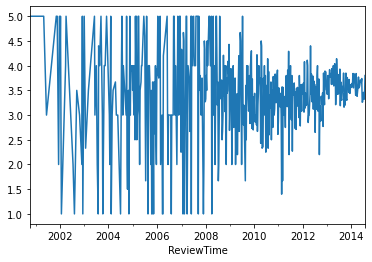

In [ ]:
sec.overall.plot()

Text(0.5, 1.0, 'Random')

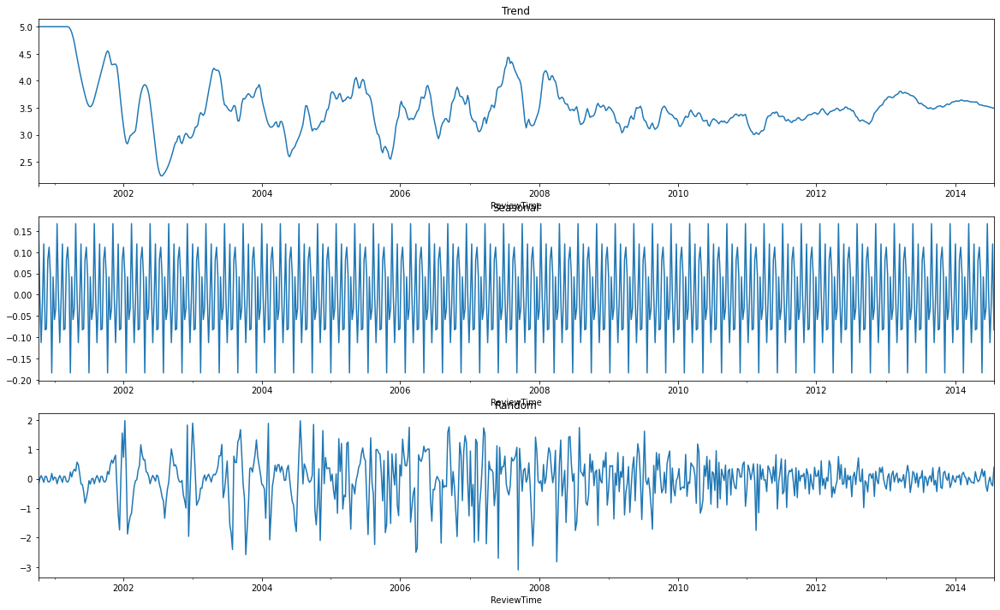

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(sec['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [ ]:
sec1=sec['overall']
sec1

ReviewTime
2000-10-15    5.00
2000-10-22    5.00
2000-10-29    5.00
2000-11-05    5.00
2000-11-12    5.00
              ... 
2014-06-29    3.42
2014-07-06    3.46
2014-07-13    3.32
2014-07-20    3.38
2014-07-27    3.80
Freq: W-SUN, Name: overall, Length: 720, dtype: float64

In [ ]:
sec1 = pd.DataFrame(sec1)

In [ ]:
def checkStationarity(sec1):
  pvalue = adfuller(sec1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [ ]:
ret = checkStationarity(sec1);
ret

'p-value=1.499407018298035e-14. Data is stationary'

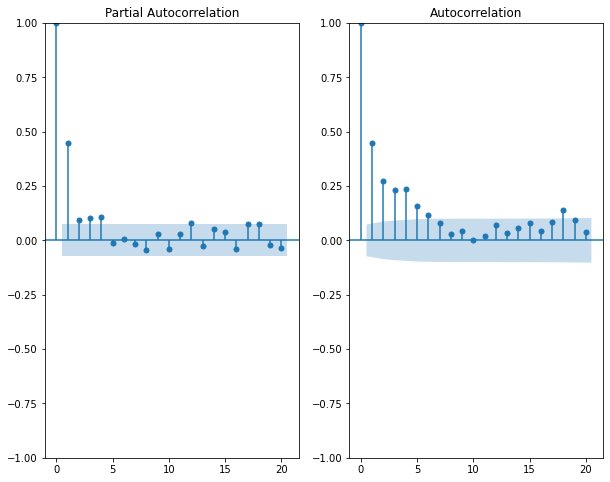

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(sec1,lags=20,ax=ax[0])
plot_acf(sec1.dropna(),lags=20,ax=ax[1])
plt.show()

In [ ]:
ss = int(0.80 * len(top1['overall'])) 
train_df = sec1.iloc[:ss] 
test_df = sec1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 580, test = 140


In [ ]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 580, test = 140


In [ ]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  580
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -748.601
Date:                Sun, 13 Mar 2022   AIC                           1527.201
Time:                        20:36:28   BIC                           1592.647
Sample:                    10-15-2000   HQIC                          1552.717
                         - 11-20-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.5124      0.114     30.817      0.000       3.289       3.736
ar.L1          0.6400      4.162      0.154      0.878      -7.518       8.798
ar.L2          0.1669      4.118      0.041      0.9

In [ ]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-10-15    3.512442
2000-10-22    4.192488
2000-10-29    4.262816
2000-11-05    4.328201
2000-11-12    4.403146
                ...   
2003-05-18    4.171119
2003-05-25    3.994243
2003-06-01    4.348406
2003-06-08    4.198909
2003-06-15    4.251390
Freq: W-SUN, Name: predicted_mean, Length: 140, dtype: float64


In [ ]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

       actual  predicted       err
0    5.000000   3.512442  1.487558
1    5.000000   4.192488  0.807512
2    5.000000   4.262816  0.737184
3    5.000000   4.328201  0.671799
4    5.000000   4.403146  0.596854
..        ...        ...       ...
135  4.653846   4.171119  0.482728
136  4.769231   3.994243  0.774988
137  4.884615   4.348406  0.536209
138  5.000000   4.198909  0.801091
139  3.000000   4.251390 -1.251390

[140 rows x 3 columns]


In [ ]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.5239362540003367
	RMSE = 0.7238344106218885


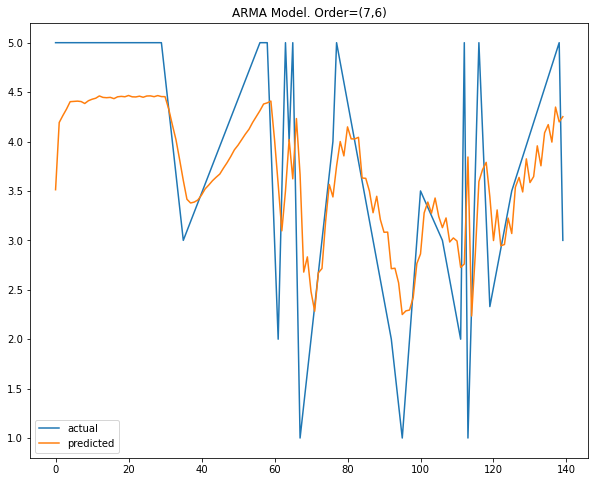

In [ ]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [ ]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+30, typ='levels')
print(fcast_m1)

2011-11-27    3.574952
2011-12-04    3.288451
2011-12-11    3.472185
2011-12-18    3.551293
2011-12-25    3.388253
2012-01-01    3.610127
2012-01-08    3.470484
2012-01-15    3.407494
2012-01-22    3.578681
2012-01-29    3.397926
2012-02-05    3.507778
2012-02-12    3.570131
2012-02-19    3.412712
2012-02-26    3.571313
2012-03-04    3.493852
2012-03-11    3.436646
2012-03-18    3.583039
2012-03-25    3.448840
2012-04-01    3.506225
2012-04-08    3.564977
2012-04-15    3.435377
2012-04-22    3.551733
2012-04-29    3.512827
2012-05-06    3.455694
2012-05-13    3.571866
2012-05-20    3.474015
2012-05-27    3.500706
2012-06-03    3.557684
2012-06-10    3.455679
2012-06-17    3.538484
2012-06-24    3.522490
Freq: W-SUN, Name: predicted_mean, dtype: float64


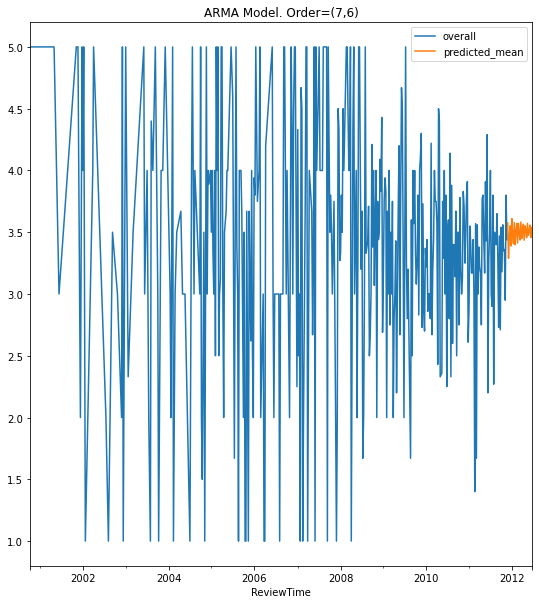

In [ ]:
train.plot(figsize=(9,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## For a particular catgeory

In [ ]:
neg  = rev1[(rev1['polarity_sentiment'] == 'Negative')]

In [ ]:
neg = neg.drop(['sentiment','helpful_rate','reviews','reviewerID'],axis=1)
neg

,product_id,overall,category,ReviewTime,polarity,polarity_sentiment
0,786950072,5,"[""Toys & Games"",""Games"",""Board Games""]",2013-05-08,-0.001603,Negative
3,786950072,1,"[""Toys & Games"",""Games"",""Board Games""]",2012-06-05,-0.166667,Negative
9,786950072,5,"[""Toys & Games"",""Games"",""Board Games""]",2014-06-21,-0.016667,Negative
10,786950072,5,"[""Toys & Games"",""Games"",""Board Games""]",2011-03-20,-0.010667,Negative
14,786955708,1,"[""Toys & Games"",""Games"",""Board Games""]",2013-01-10,-0.194792,Negative
...,...,...,...,...,...,...
117951,B00J49UTP4,3,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-07-05,-0.044129,Negative
117954,B00J49UTP4,3,"[""Toys & Games"",""Baby & Toddler Toys""]",2014-06-30,-0.053108,Negative
117971,B00J49UTW2,3,"[""Toys & Games"",""Toy Remote Control & Play Veh...",2014-07-07,-0.210204,Negative
117993,B00J49UTWC,4,"[""Toys & Games"",""Action Figures & Statues"",""Pl...",2014-07-20,-0.048214,Negative


In [ ]:
counts = neg["category"].value_counts().to_frame()
counts

,category
"[""Toys & Games"",""Games"",""Board Games""]",2354
"[""Toys & Games"",""Games"",""Card Games""]",469
"[""Toys & Games"",""Building Toys"",""Building Sets""]",410
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",368
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",347
...,...
"[""Toys & Games"",""Hobbies"",""Remote & App Controlled Vehicles & Parts"",""Remote & App Controlled Vehicle Parts"",""Wheels & Tires"",""Accessories""]",1
"[""Toys & Games"",""Party Supplies"",""Tablecovers""]",1
"[""Toys & Games"",""Arts & Crafts"",""Craft Kits"",""Wood""]",1
"[""Toys & Games"",""Learning & Education"",""Musical Instruments"",""Wind & Brass""]",1


In [ ]:
avg_rating = neg.groupby('category')["overall"].mean().to_frame()
avg_rating

,overall
category,
"[""Toys & Games"",""Action Figures & Statues"",""Accessories""]",3.500000
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",3.296196
"[""Toys & Games"",""Action Figures & Statues"",""Imported"",""Sonic screwdriver that's really a flashlight"",""Super bright LED for timey-wimey adventuring"",""Have your collectible and use it, too!"",""Approx 6.5\"" in length"",""The Eleventh Doctor's handy device shines a bright green beam through light-emitting diodes.""]",4.000000
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",3.407035
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Vehicles""]",3.000000
...,...
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Electric Vehicles""]",4.200000
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pedal Cars""]",2.666667
"[""Toys & Games"",""Tricycles, Scooters & Wagons"",""Pull-Along Wagons""]",3.769231


In [ ]:
proj = counts.join(avg_rating)
proj.head(30)

,category,overall
"[""Toys & Games"",""Games"",""Board Games""]",2354,4.032710
"[""Toys & Games"",""Games"",""Card Games""]",469,4.170576
"[""Toys & Games"",""Building Toys"",""Building Sets""]",410,3.678049
"[""Toys & Games"",""Action Figures & Statues"",""Action Figures""]",368,3.296196
"[""Toys & Games"",""Dolls & Accessories"",""Dolls""]",347,3.259366
"[""Toys & Games"",""Kids' Electronics"",""Electronic Learning Toys""]",244,3.127049
"[""Toys & Games"",""Kids' Electronics"",""Systems & Accessories"",""Electronic Software & Books""]",224,4.040179
"[""Toys & Games"",""Action Figures & Statues"",""Playsets & Vehicles"",""Playsets""]",199,3.407035
"[""Toys & Games"",""Toy Remote Control & Play Vehicles"",""Vehicle Playsets""]",193,2.751295
"[""Toys & Games"",""Stuffed Animals & Plush Toys"",""Stuffed Animals & Teddy Bears""]",124,3.475806


In [ ]:
prod  = rev1[(rev1['category'] == '["Toys & Games","Games","Card Games"]')]

In [ ]:
prod

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
49,096625757X,3,A187JLGNRZCU2J,"[""Toys & Games"",""Games"",""Card Games""]",2013-12-04,bought year old girl card probably appropriate...,0.0,Neutral,0.133333,Positive
50,096625757X,4,A313P3FY0KBUW8,"[""Toys & Games"",""Games"",""Card Games""]",2012-11-29,this really fun conversation starter especiall...,0.0,Positive,0.015179,Neutral
51,096625757X,5,A124OY4FLG30V0,"[""Toys & Games"",""Games"",""Card Games""]",2013-10-11,while vacation kid got hooked would you rather...,0.0,Positive,0.033333,Neutral
52,096625757X,4,A12ZPX7NST48Q4,"[""Toys & Games"",""Games"",""Card Games""]",2014-02-21,cute card game great traveling teen adult we t...,0.0,Positive,-0.016667,Negative
53,096625757X,3,A13G1TKIKHGV3F,"[""Toys & Games"",""Games"",""Card Games""]",2012-11-26,we played game family thanksgiving there way r...,50.0,Neutral,0.032083,Neutral
...,...,...,...,...,...,...,...,...,...,...
117509,B00HVFBT1G,5,A1HU0Y4JENS74E,"[""Toys & Games"",""Games"",""Card Games""]",2014-06-12,my yearold son i enjoy playing this expansion ...,0.0,Positive,0.000000,Neutral
117510,B00HVFBT1G,4,AD8SR4DNEN1YM,"[""Toys & Games"",""Games"",""Card Games""]",2014-07-13,without played it changeling seem like need se...,0.0,Positive,-0.333333,Negative
117511,B00HVFBT1G,5,A3HWQBKOVVBS00,"[""Toys & Games"",""Games"",""Card Games""]",2014-05-02,great fun expansion already fun game it add ch...,0.0,Positive,0.116667,Positive
117512,B00HVFBT1G,5,A3OD9DU3A0NCCI,"[""Toys & Games"",""Games"",""Card Games""]",2014-04-17,i apparent minority liked cthulhu expansion sc...,50.0,Positive,0.100455,Positive


In [ ]:
prod = prod.drop(['sentiment','helpful_rate','reviews','reviewerID'],axis=1)
prod

,product_id,overall,category,ReviewTime,polarity,polarity_sentiment
49,096625757X,3,"[""Toys & Games"",""Games"",""Card Games""]",2013-12-04,0.133333,Positive
50,096625757X,4,"[""Toys & Games"",""Games"",""Card Games""]",2012-11-29,0.015179,Neutral
51,096625757X,5,"[""Toys & Games"",""Games"",""Card Games""]",2013-10-11,0.033333,Neutral
52,096625757X,4,"[""Toys & Games"",""Games"",""Card Games""]",2014-02-21,-0.016667,Negative
53,096625757X,3,"[""Toys & Games"",""Games"",""Card Games""]",2012-11-26,0.032083,Neutral
...,...,...,...,...,...,...
117509,B00HVFBT1G,5,"[""Toys & Games"",""Games"",""Card Games""]",2014-06-12,0.000000,Neutral
117510,B00HVFBT1G,4,"[""Toys & Games"",""Games"",""Card Games""]",2014-07-13,-0.333333,Negative
117511,B00HVFBT1G,5,"[""Toys & Games"",""Games"",""Card Games""]",2014-05-02,0.116667,Positive
117512,B00HVFBT1G,5,"[""Toys & Games"",""Games"",""Card Games""]",2014-04-17,0.100455,Positive


In [ ]:
prod.overall.value_counts()

5    1489
4     479
3     172
2      53
1      27
Name: overall, dtype: int64

In [ ]:
prod['ReviewTime'] = pd.to_datetime(prod['ReviewTime'])

In [ ]:
prod = prod.set_index("ReviewTime")
print(prod)

            product_id  overall                               category  \
ReviewTime                                                               
2013-12-04  096625757X        3  ["Toys & Games","Games","Card Games"]   
2012-11-29  096625757X        4  ["Toys & Games","Games","Card Games"]   
2013-10-11  096625757X        5  ["Toys & Games","Games","Card Games"]   
2014-02-21  096625757X        4  ["Toys & Games","Games","Card Games"]   
2012-11-26  096625757X        3  ["Toys & Games","Games","Card Games"]   
...                ...      ...                                    ...   
2014-06-12  B00HVFBT1G        5  ["Toys & Games","Games","Card Games"]   
2014-07-13  B00HVFBT1G        4  ["Toys & Games","Games","Card Games"]   
2014-05-02  B00HVFBT1G        5  ["Toys & Games","Games","Card Games"]   
2014-04-17  B00HVFBT1G        5  ["Toys & Games","Games","Card Games"]   
2014-05-05  B00HVFBT1G        5  ["Toys & Games","Games","Card Games"]   

            polarity polarity_sentime

In [ ]:
prod=prod.sort_values(by='ReviewTime')
prod

,product_id,overall,category,polarity,polarity_sentiment
ReviewTime,,,,,
2000-07-28,B00004SDAP,5,"[""Toys & Games"",""Games"",""Card Games""]",0.152604,Positive
2000-07-28,B00004SDAP,5,"[""Toys & Games"",""Games"",""Card Games""]",0.152604,Positive
2001-12-25,B00000DMBD,5,"[""Toys & Games"",""Games"",""Card Games""]",0.018681,Neutral
2002-07-15,B00000DMBD,5,"[""Toys & Games"",""Games"",""Card Games""]",0.089394,Neutral
2002-10-17,B00000GBQJ,5,"[""Toys & Games"",""Games"",""Card Games""]",0.170417,Positive
...,...,...,...,...,...
2014-07-22,B004U7JJWE,4,"[""Toys & Games"",""Games"",""Card Games""]",0.550000,Positive
2014-07-22,B00FG1U7FQ,4,"[""Toys & Games"",""Games"",""Card Games""]",0.033198,Neutral
2014-07-22,B001ESQTUM,5,"[""Toys & Games"",""Games"",""Card Games""]",0.700000,Positive


In [ ]:
prod = prod.resample('W').mean().round(2)

In [ ]:
prod = prod.interpolate(method='linear')
prod

,overall,polarity
ReviewTime,,
2000-07-30,5.00,0.150000
2000-08-06,5.00,0.148243
2000-08-13,5.00,0.146486
2000-08-20,5.00,0.144730
2000-08-27,5.00,0.142973
...,...,...
2014-06-29,4.67,0.150000
2014-07-06,4.38,0.140000
2014-07-13,4.41,0.120000


In [ ]:
prod = prod.dropna()

<AxesSubplot:xlabel='ReviewTime'>

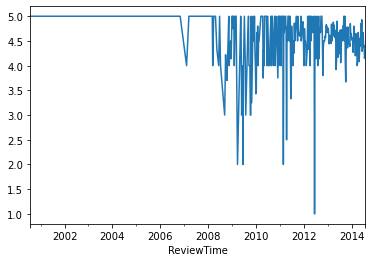

In [ ]:
prod.overall.plot()

In [ ]:
prod1=prod['overall']
prod1

ReviewTime
2000-07-30    5.00
2000-08-06    5.00
2000-08-13    5.00
2000-08-20    5.00
2000-08-27    5.00
              ... 
2014-06-29    4.67
2014-07-06    4.38
2014-07-13    4.41
2014-07-20    4.15
2014-07-27    4.27
Freq: W-SUN, Name: overall, Length: 731, dtype: float64

In [ ]:
prod1 = pd.DataFrame(prod1)

In [ ]:
def checkStationarity(prod1):
  pvalue = adfuller(prod1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [ ]:
ret = checkStationarity(prod1);
ret

'p-value=0.051574322754565576. Data is not stationary'

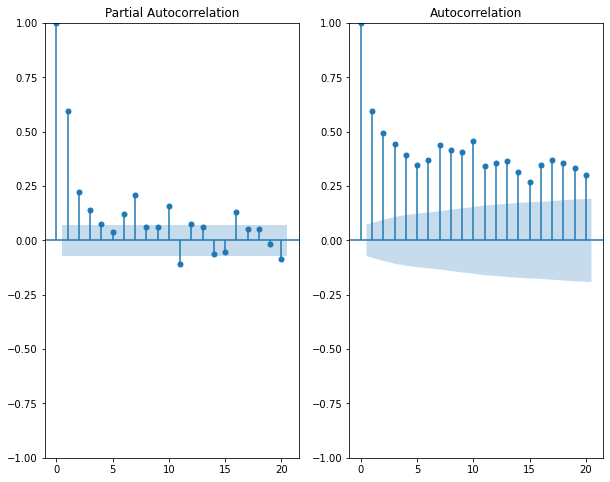

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(prod1,lags=20,ax=ax[0])
plot_acf(prod1.dropna(),lags=20,ax=ax[1])
plt.show()

In [ ]:
ss = int(0.80 * len(prod1['overall'])) 
train_df = prod1.iloc[:ss] 
test_df = prod1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 584, test = 147


In [ ]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 584, test = 147


In [ ]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  584
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -191.327
Date:                Sun, 13 Mar 2022   AIC                            412.654
Time:                        20:11:39   BIC                            478.203
Sample:                    07-30-2000   HQIC                           438.202
                         - 10-02-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.7623      0.378     12.597      0.000       4.021       5.503
ar.L1          0.2517      0.199      1.264      0.206      -0.139       0.642
ar.L2          0.3441      0.251      1.371      0.1

In [ ]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-07-30    4.762252
2000-08-06    4.926729
2000-08-13    4.940351
2000-08-20    4.945484
2000-08-27    4.948737
                ...   
2003-04-20    4.980236
2003-04-27    4.980073
2003-05-04    4.980066
2003-05-11    4.980236
2003-05-18    4.980076
Freq: W-SUN, Name: predicted_mean, Length: 147, dtype: float64


In [ ]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0       5.0   4.762252  0.237748
1       5.0   4.926729  0.073271
2       5.0   4.940351  0.059649
3       5.0   4.945484  0.054516
4       5.0   4.948737  0.051263
..      ...        ...       ...
142     5.0   4.980236  0.019764
143     5.0   4.980073  0.019927
144     5.0   4.980066  0.019934
145     5.0   4.980236  0.019764
146     5.0   4.980076  0.019924

[147 rows x 3 columns]


In [ ]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.0009204928224848643
	RMSE = 0.030339624626630837


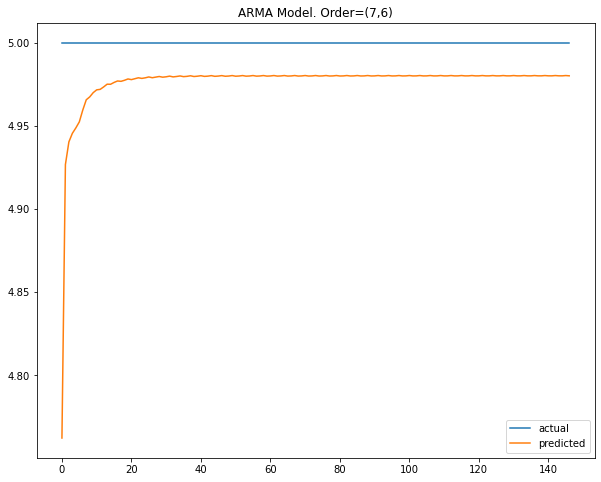

In [ ]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [ ]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+44, typ='levels')
print(fcast_m1)

2011-10-09    4.417810
2011-10-16    4.690135
2011-10-23    4.542688
2011-10-30    4.514988
2011-11-06    4.774001
2011-11-13    4.631022
2011-11-20    4.518012
2011-11-27    4.748471
2011-12-04    4.605250
2011-12-11    4.512553
2011-12-18    4.736847
2011-12-25    4.639109
2012-01-01    4.526782
2012-01-08    4.744508
2012-01-15    4.648144
2012-01-22    4.535252
2012-01-29    4.731124
2012-02-05    4.663584
2012-02-12    4.540123
2012-02-19    4.732054
2012-02-26    4.673963
2012-03-04    4.552637
2012-03-11    4.724676
2012-03-18    4.687125
2012-03-25    4.558417
2012-04-01    4.722779
2012-04-08    4.694971
2012-04-15    4.569733
2012-04-22    4.717205
2012-04-29    4.705765
2012-05-06    4.577117
2012-05-13    4.715082
2012-05-20    4.712219
2012-05-27    4.587569
2012-06-03    4.710524
2012-06-10    4.720489
2012-06-17    4.595591
2012-06-24    4.708524
2012-07-01    4.725751
2012-07-08    4.605480
2012-07-15    4.704978
2012-07-22    4.731951
2012-07-29    4.613665
2012-08-05 

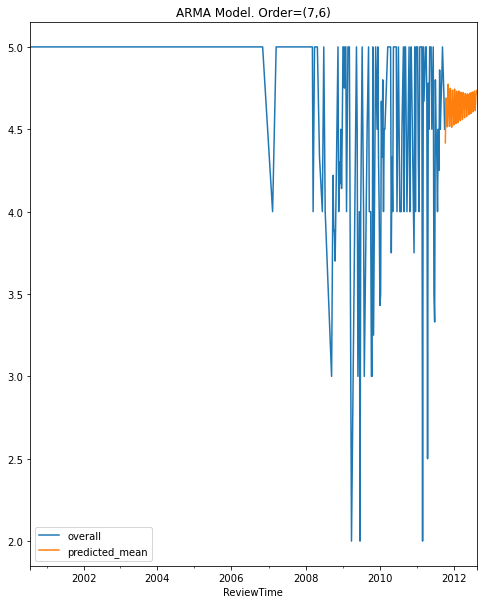

In [ ]:
train.plot(figsize=(8,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

## Positive Sentiment

In [ ]:
third = rev1[(rev1['polarity_sentiment'] == 'Positive')]
third

,product_id,overall,reviewerID,category,ReviewTime,reviews,helpful_rate,sentiment,polarity,polarity_sentiment
1,786950072,5,AA3TDQ34248M7,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,if never played let review turn off this wonde...,45.0,Positive,0.282192,Positive
4,786950072,2,AH1FE0H8VVV6E,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,great game played like twice even know nownot ...,20.0,Negative,0.400000,Positive
7,786950072,4,AUNK2GN1VD1OD,"[""Toys & Games"",""Games"",""Board Games""]",2013-11-18,i grew playing monopoly lot people did it unfo...,50.0,Positive,0.131538,Positive
11,786950072,1,A3A31QU1F6KCUX,"[""Toys & Games"",""Games"",""Board Games""]",2009-10-02,we game made thought newer version would time ...,44.0,Negative,0.103611,Positive
15,786955708,5,A256SIW5MV0DN4,"[""Toys & Games"",""Games"",""Board Games""]",2013-07-26,i loved dd board game wizard coast far i two a...,0.0,Positive,0.224545,Positive
...,...,...,...,...,...,...,...,...,...,...
118065,B00LBI9BKA,5,A18Q24BZK2CB5P,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this drone fun super duarable it easy use kid ...,0.0,Positive,0.373333,Positive
118066,B00LBI9BKA,5,A1I8ON1X0B2N2W,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,this brother prized toy it extremely durable p...,50.0,Positive,0.170972,Positive
118067,B00LBI9BKA,5,A3V24H5350ULKI,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,this panther drone toy awesome i definitely re...,0.0,Positive,0.380635,Positive
118068,B00LBI9BKA,5,A1W2F1WI0QZ4AJ,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,this first drone proven excellent choice since...,0.0,Positive,0.282292,Positive


In [ ]:
third = third.drop(['product_id','sentiment','helpful_rate','reviews','reviewerID'],axis=1)
third

,overall,category,ReviewTime,polarity,polarity_sentiment
1,5,"[""Toys & Games"",""Games"",""Board Games""]",2008-11-23,0.282192,Positive
4,2,"[""Toys & Games"",""Games"",""Board Games""]",2013-06-12,0.400000,Positive
7,4,"[""Toys & Games"",""Games"",""Board Games""]",2013-11-18,0.131538,Positive
11,1,"[""Toys & Games"",""Games"",""Board Games""]",2009-10-02,0.103611,Positive
15,5,"[""Toys & Games"",""Games"",""Board Games""]",2013-07-26,0.224545,Positive
...,...,...,...,...,...
118065,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,0.373333,Positive
118066,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-07,0.170972,Positive
118067,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-08,0.380635,Positive
118068,5,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",2014-07-18,0.282292,Positive


In [ ]:
third['ReviewTime'] = pd.to_datetime(third['ReviewTime'])

In [ ]:
third = third.set_index("ReviewTime")
print(third)

            overall                                           category  \
ReviewTime                                                               
2008-11-23        5             ["Toys & Games","Games","Board Games"]   
2013-06-12        2             ["Toys & Games","Games","Board Games"]   
2013-11-18        4             ["Toys & Games","Games","Board Games"]   
2009-10-02        1             ["Toys & Games","Games","Board Games"]   
2013-07-26        5             ["Toys & Games","Games","Board Games"]   
...             ...                                                ...   
2014-07-07        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-07        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-08        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-18        5  ["Toys & Games","Hobbies","Remote & App Contro...   
2014-07-15        4  ["Toys & Games","Hobbies","Remote & App Contro...   

            polarity polarity_sentime

In [ ]:
third=third.sort_values(by='ReviewTime')
third

,overall,category,polarity,polarity_sentiment
ReviewTime,,,,
2000-07-28,5,"[""Toys & Games"",""Games"",""Card Games""]",0.152604,Positive
2000-07-28,5,"[""Toys & Games"",""Games"",""Card Games""]",0.152604,Positive
2000-09-04,5,"[""Toys & Games"",""Baby & Toddler Toys""]",0.345000,Positive
2000-09-04,5,"[""Toys & Games"",""Baby & Toddler Toys""]",0.345000,Positive
2000-10-01,5,"[""Toys & Games"",""Learning & Education"",""Musica...",0.335417,Positive
...,...,...,...,...
2014-07-23,3,"[""Toys & Games"",""Hobbies"",""Remote & App Contro...",0.433333,Positive
2014-07-23,5,"[""Toys & Games"",""Building Toys"",""Building Sets""]",0.500000,Positive
2014-07-23,4,"[""Toys & Games"",""Dolls & Accessories"",""Playsets""]",0.108923,Positive


In [ ]:
third = third.resample('W').mean().round(2)

In [ ]:
third = third.interpolate(method='linear')
third

,overall,polarity
ReviewTime,,
2000-07-30,5.00,0.150000
2000-08-06,5.00,0.181667
2000-08-13,5.00,0.213333
2000-08-20,5.00,0.245000
2000-08-27,5.00,0.276667
...,...,...
2014-06-29,4.57,0.320000
2014-07-06,4.60,0.360000
2014-07-13,4.60,0.390000


<AxesSubplot:xlabel='ReviewTime'>

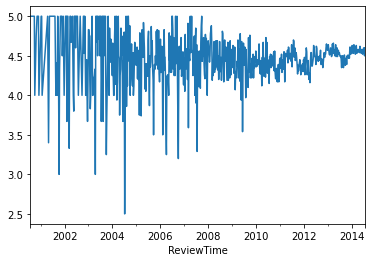

In [ ]:
third.overall.plot()

Text(0.5, 1.0, 'Random')

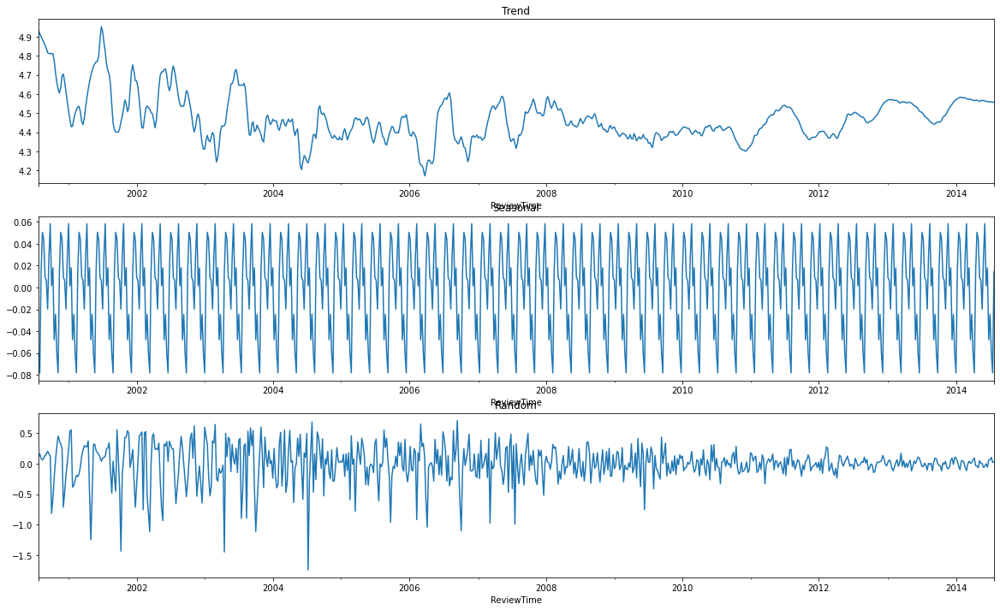

In [ ]:
fig,ax = plt.subplots(3,1,figsize=(20,12))
result = seasonal_decompose(third['overall'], period=14, extrapolate_trend='freq')
#trend
result.trend.plot(ax=ax[0])
ax[0].set_title("Trend")
#seasonality
result.seasonal.plot(ax=ax[1])
ax[1].set_title("Seasonal")
#residual
result.resid.plot(ax=ax[2])
ax[2].set_title("Random")

In [ ]:
third1=third['overall']
third1

ReviewTime
2000-07-30    5.00
2000-08-06    5.00
2000-08-13    5.00
2000-08-20    5.00
2000-08-27    5.00
              ... 
2014-06-29    4.57
2014-07-06    4.60
2014-07-13    4.60
2014-07-20    4.50
2014-07-27    4.60
Freq: W-SUN, Name: overall, Length: 731, dtype: float64

In [ ]:
third1 = pd.DataFrame(third1)

In [ ]:
def checkStationarity(third1):
  pvalue = adfuller(third1)[1]
  if(pvalue>0.05):
    msg = 'p-value={}. Data is not stationary'.format(pvalue)
  else:
    msg='p-value={}. Data is stationary'.format(pvalue)
  return(msg)

In [ ]:
ret = checkStationarity(third1);
ret

'p-value=2.0233723602210268e-22. Data is stationary'

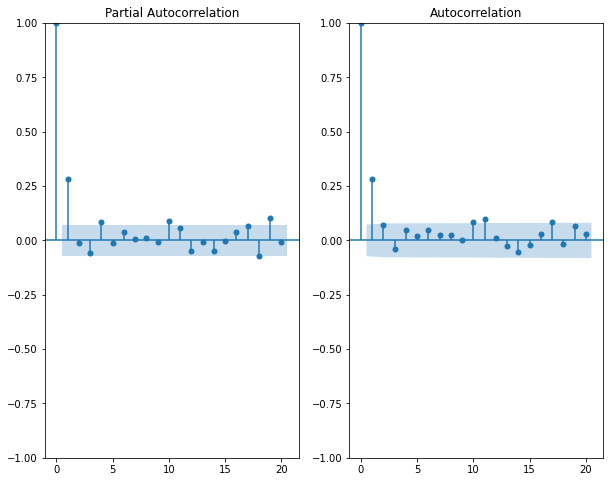

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,8))
plot_pacf(third1.dropna(),lags=20,ax=ax[0])
plot_acf(third1.dropna(),lags=20,ax=ax[1])
plt.show()

In [ ]:
ss = int(0.80 * len(third1['overall'])) 
train_df = third1.iloc[:ss] 
test_df = third1.iloc[ss:] 
print("train = {}, test = {}".format(len(train_df), len(test_df)))

train = 584, test = 147


In [ ]:
train = train_df.overall
test = test_df.overall
print("train = {}, test = {}".format(len(train), len(test)))

train = 584, test = 147


In [ ]:
p=7; q=6 
m1 = ARIMA(train,order=(p,0,q)).fit() 
print(m1.summary())

                               SARIMAX Results                                
Dep. Variable:                overall   No. Observations:                  584
Model:                 ARIMA(7, 0, 6)   Log Likelihood                -199.770
Date:                Sun, 13 Mar 2022   AIC                            429.541
Time:                        20:09:18   BIC                            495.089
Sample:                    07-30-2000   HQIC                           455.088
                         - 10-02-2011                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.5161      0.154     29.322      0.000       4.214       4.818
ar.L1          0.1401      0.108      1.292      0.196      -0.072       0.353
ar.L2         -0.5106      0.082     -6.203      0.0

In [ ]:
predictions = m1.predict(0,len(test)-1) 
print(predictions)

ReviewTime
2000-07-30    4.516079
2000-08-06    4.670646
2000-08-13    4.673009
2000-08-20    4.684910
2000-08-27    4.708855
                ...   
2003-04-20    4.385717
2003-04-27    4.162358
2003-05-04    4.741518
2003-05-11    4.564378
2003-05-18    4.584556
Freq: W-SUN, Name: predicted_mean, Length: 147, dtype: float64


In [ ]:
actual = []; pred = [] 
for i in range(len(predictions)):
       actual.append(train[i]) 
       pred.append(predictions[i]) 
df_res = pd.DataFrame({'actual':actual, 'predicted':pred}) 
df_res['err'] = df_res.actual - df_res.predicted #(E)
print(df_res)

     actual  predicted       err
0      5.00   4.516079  0.483921
1      5.00   4.670646  0.329354
2      5.00   4.673009  0.326991
3      5.00   4.684910  0.315090
4      5.00   4.708855  0.291145
..      ...        ...       ...
142    3.00   4.385717 -1.385717
143    5.00   4.162358  0.837642
144    4.67   4.741518 -0.071518
145    5.00   4.564378  0.435622
146    5.00   4.584556  0.415444

[147 rows x 3 columns]


In [ ]:
pvalue = sm.stats.acorr_ljungbox(m1.resid,lags=[1],return_df=True)['lb_pvalue'].values
if pvalue < 0.05:
  print("Reject H0. Bad model")
else:
  print("Fail-to-Reject H0. Good model")

Fail-to-Reject H0. Good model


In [ ]:
msg = 'ARMA Model. Order=(' + str(p) + ',' + str(q) + ')'
mse = mean_squared_error(df_res.actual, df_res.predicted)
print(msg + "\n\tMSE = {}\n\tRMSE = {}".format(mse,np.sqrt(mse)))

ARMA Model. Order=(7,6)
	MSE = 0.170476633397981
	RMSE = 0.41288816088376884


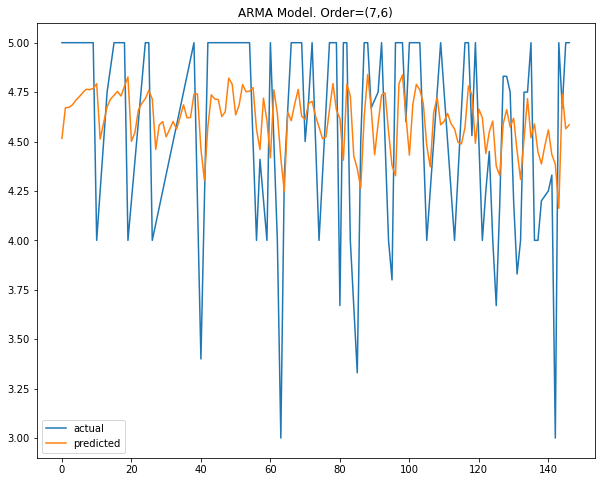

In [ ]:
df_res.actual.plot(figsize=(10,8),legend=True)
df_res.predicted.plot(legend=True)
plt.title(msg)
plt.show()

In [ ]:
fcast_m1 = m1.predict(start=len(train), end=len(train)+60, typ='levels')
print(fcast_m1)

2011-10-09    4.477442
2011-10-16    4.454147
2011-10-23    4.388745
2011-10-30    4.483843
2011-11-06    4.475569
                ...   
2012-11-04    4.475416
2012-11-11    4.476186
2012-11-18    4.415888
2012-11-25    4.457710
2012-12-02    4.485217
Freq: W-SUN, Name: predicted_mean, Length: 61, dtype: float64


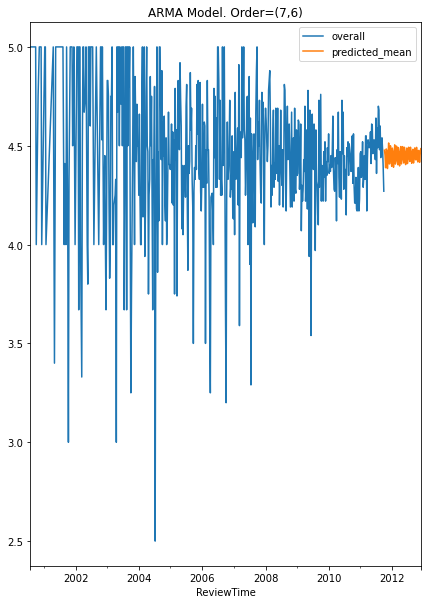

In [ ]:
train.plot(figsize=(7,10),legend=True) 
fcast_m1.plot(legend=True) 
plt.title(msg)
plt.show()

In [ ]:
rev.to_csv('Video_Gamesfin.csv')

In [ ]:
rev1.to_csv('Toys_and_Gamesfin.csv')